In [37]:
%matplotlib notebook
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import matplotlib.figure as fig
from matplotlib.ticker import StrMethodFormatter
import seaborn as sns
from datetime import datetime as dt
from dateutil.parser import parse
import re

In [38]:
# we only want the interval data from a single agency
# other ones for NM:  32000-2, 32000-3, 32000-901, 32000-4, 32000-61, 32000-8, 32000-9, 32000-18
# NC:  34003-31, 34003-32, 34003-35, ...
# agency = "34003-2"
# read the file in chunks, then append only the data that matches that agency
# print(dt.now())
# iter_csv = pd.read_csv('data/intervals.csv', iterator=True, chunksize=1000)
# df = pd.concat([chunk[chunk['uniquename'] == agency] for chunk in iter_csv])
# print(dt.now())

In [47]:
# read the big interval data file from disk
print(dt.now())
df_all = pd.read_csv('data/intervals.csv')
print(dt.now())

2019-02-14 15:13:32.069157
2019-02-14 15:13:38.754273


In [53]:
# clean up and annotate
print(dt.now())
# remove rows that have any blank values
# this will remove the first row which is bogus - an artifact of the interval calculation process.
df_all.dropna(axis='index', how='any', inplace=True)

# add a new column which is the timestamp as a datetime object
df_all['ts'] = df_all.apply(lambda row: parse(row.timestamp), axis=1)

# add a new column for the hour of the day
df_all['HR'] = df_all.apply(lambda row: row.ts.hour, axis=1)

# add a new column for the day of the week
df_all['DOW'] = df_all.apply(lambda row: row.ts.weekday(), axis=1)

# this function will return a 'code' for (W)eekend, (N)ight, or (D)ay
def timeslot(h,d):
    # h - hour of day
    # d - day of week (0=Monday)
    if d > 4:             # day 5 or 6 (saturday or sunday)
        return "W"        # then Weekend
    elif h < 8 or h > 17: # before 7:59a or after 5:59p 
        return "N"        # then Night
    else:                 # otherwise
        return "D"        # Day

# make a new column with the timeslot code in it
df_all['SLOT'] = df_all.apply(lambda row: timeslot(row.HR, row.DOW), axis=1)
print(dt.now())

In [66]:
def make_output(a, df, trim_value, s):
    # this removes the rows considered to be 'outliers'
    # trimmed will be what is to the left of the threshold (the non-outliers)
    trimmed = df[df.interval < trim_value]

    # set the # of bins
    bins_to_use = 100

    # set the groupby using the timeslot
    by_slot = trimmed.groupby('SLOT')

    # show all the slots in one plot
    fig = plt.figure()
    ax = plt.subplot()
    ax.grid(True, which='both')  # set a grid
    fig.set_size_inches(10, 6)   # size of the full figure
    rugkws={"height": .025, "color": "999999"}  # rug display parameters
    histkws={"linewidth": 1, "alpha": 0.5}        # histogram display parameters

    for name, group in by_slot:
        sns.distplot(group.interval, label=name, kde=False, bins=bins_to_use, hist_kws=histkws, rug=True, rug_kws=rugkws)
        # print the basic stats
        print(name, group["interval"].describe().apply(lambda x: format(x, '.2f')))
        if(s):
            group["interval"].describe().apply(lambda x: format(x, '.2f')).to_csv('output/' + agency + '-' + name + '.csv')

    plt.title(agency)    # output the title
    plt.legend()         # display a legend
    if(s):
        plt.savefig('output/' + agency)

    # show the slots in separate graphs 
    for slot in list('DNW'):
        ddf = trimmed[trimmed.SLOT == slot]
        fig = plt.figure()
        ax = plt.subplot()
        ax.grid(True, which='both')  # set a grid
        fig.set_size_inches(10, 6)   # size of the full figure
        rugkws={"height": .025, "color": "999999"}  # rug display parameters
        histkws={"linewidth": 1, "alpha": 0.5}        # histogram display parameters

        sns.distplot(ddf.interval, label=slot, kde=False, bins=bins_to_use, hist_kws=histkws, rug=True, rug_kws=rugkws)
        # print the basic stats
        print(slot, ddf["interval"].describe().apply(lambda x: format(x, '.2f')))
    
        title = agency + "-" + slot
        plt.title(title)    # output the title
        plt.legend()         # display a legend
        if(s):
            plt.savefig('output/' + title)

In [73]:
def get_agency_list(method):
    a_list = []
    if method == 'f':
        agency_list_file = 'agency-list.txt'
        fo = open(agency_list_file, "r")
        for line in fo:
            a_list.append(line.rstrip('\n'))
    else:
        a_list = ['34003-2', '34003-3', '34003-4']

    return a_list

34003-30


<IPython.core.display.Javascript object>


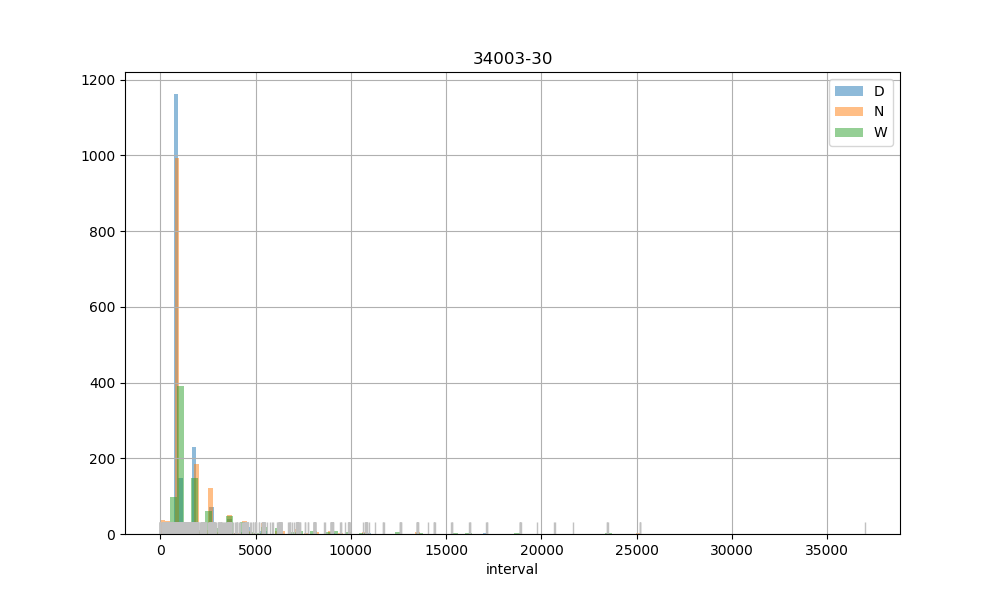

D count     1780.00
mean      1429.90
std       1711.24
min          2.00
25%        889.00
50%        910.00
75%       1204.75
max      23499.00
Name: interval, dtype: object
N count     1687.00
mean      1802.41
std       2149.12
min          2.00
25%        890.00
50%        915.00
75%       1811.00
max      25194.00
Name: interval, dtype: object
W count      942.00
mean      2389.00
std       3069.81
min        141.00
25%        898.00
50%        938.50
75%       2698.75
max      36962.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


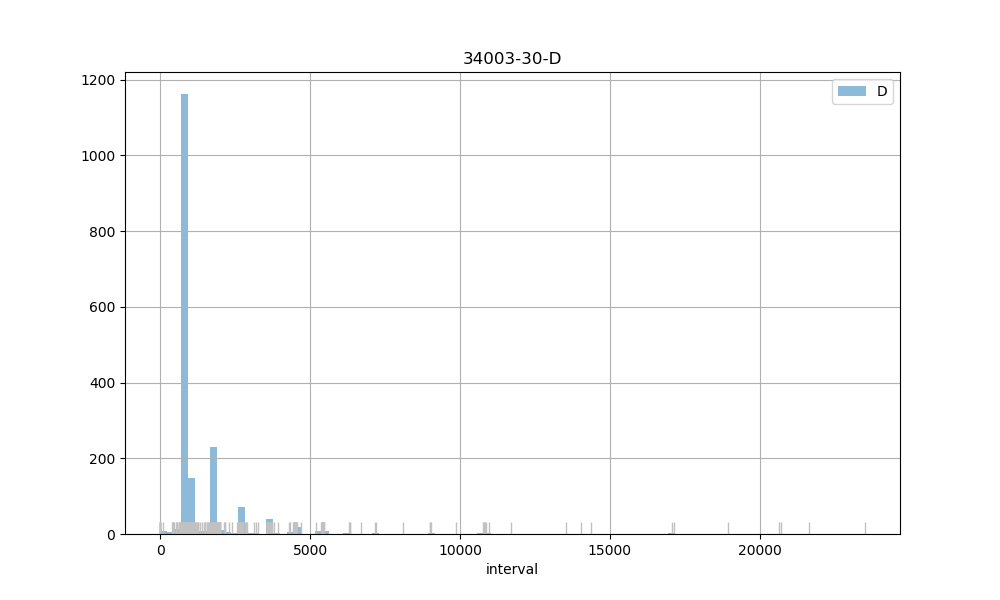

D count     1780.00
mean      1429.90
std       1711.24
min          2.00
25%        889.00
50%        910.00
75%       1204.75
max      23499.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


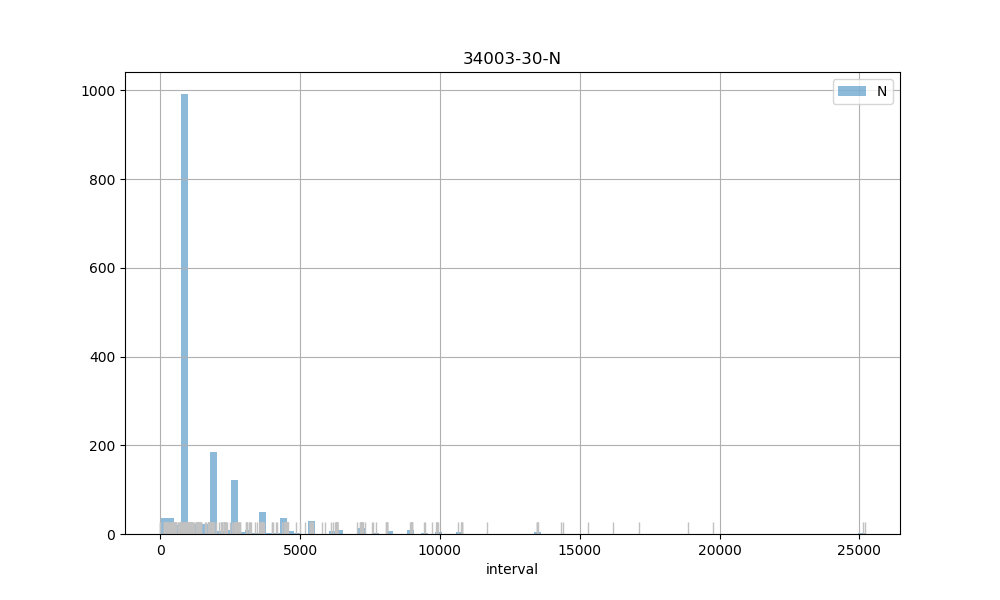

N count     1687.00
mean      1802.41
std       2149.12
min          2.00
25%        890.00
50%        915.00
75%       1811.00
max      25194.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count      942.00
mean      2389.00
std       3069.81
min        141.00
25%        898.00
50%        938.50
75%       2698.75
max      36962.00
Name: interval, dtype: object
34003-31


<IPython.core.display.Javascript object>

D count      686.00
mean      4118.38
std       7189.91
min          6.00
25%        902.00
50%       1798.50
75%       4184.00
max      55780.00
Name: interval, dtype: object
N count      396.00
mean      6935.59
std      10717.67
min        757.00
25%        902.00
50%       1826.00
75%       8974.50
max      66829.00
Name: interval, dtype: object
W count      273.00
mean      8160.12
std      12687.67
min        241.00
25%        907.00
50%       2694.00
75%      10786.00
max      86233.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count      686.00
mean      4118.38
std       7189.91
min          6.00
25%        902.00
50%       1798.50
75%       4184.00
max      55780.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


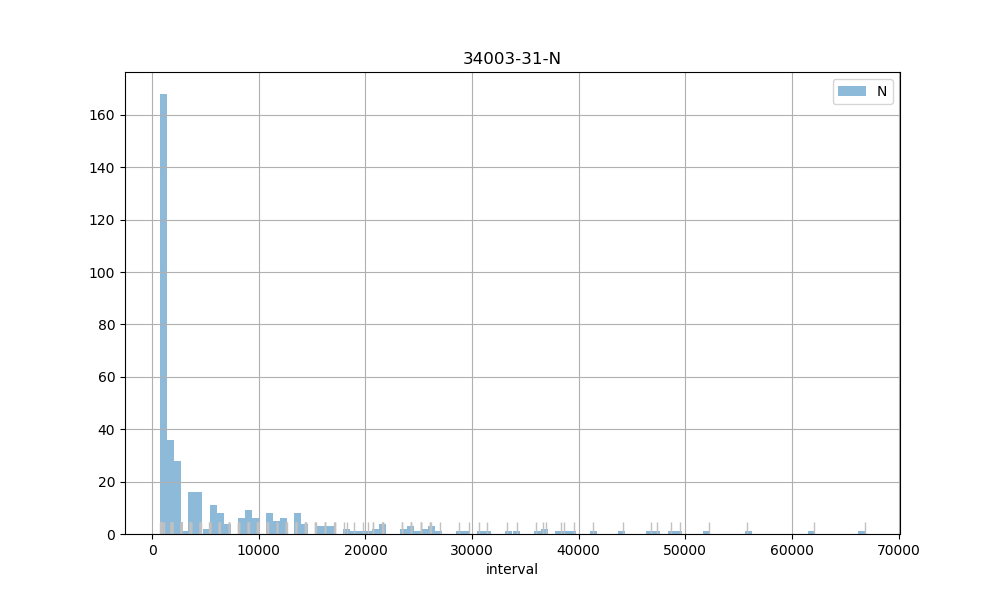

N count      396.00
mean      6935.59
std      10717.67
min        757.00
25%        902.00
50%       1826.00
75%       8974.50
max      66829.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count      273.00
mean      8160.12
std      12687.67
min        241.00
25%        907.00
50%       2694.00
75%      10786.00
max      86233.00
Name: interval, dtype: object
34003-32


<IPython.core.display.Javascript object>


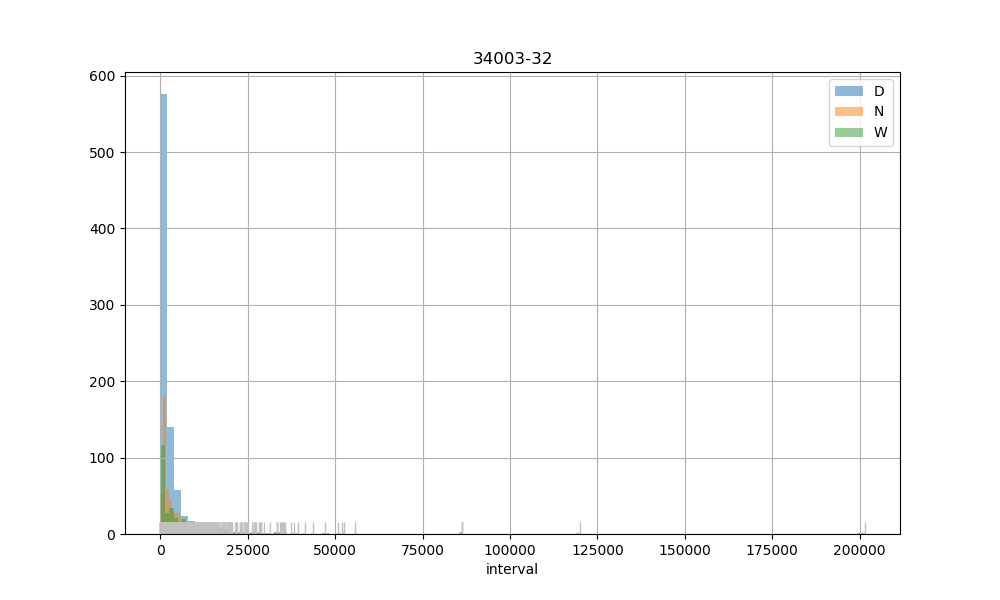

D count       865.00
mean       3097.49
std        7907.42
min           2.00
25%         899.00
50%        1015.00
75%        2715.00
max      201439.00
Name: interval, dtype: object
N count      554.00
mean      5307.29
std       8817.25
min          5.00
25%        905.00
50%       1828.00
75%       5886.50
max      86410.00
Name: interval, dtype: object
W count       316.00
mean       7009.16
std       11411.97
min         228.00
25%         909.75
50%        2882.00
75%        8847.00
max      120148.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


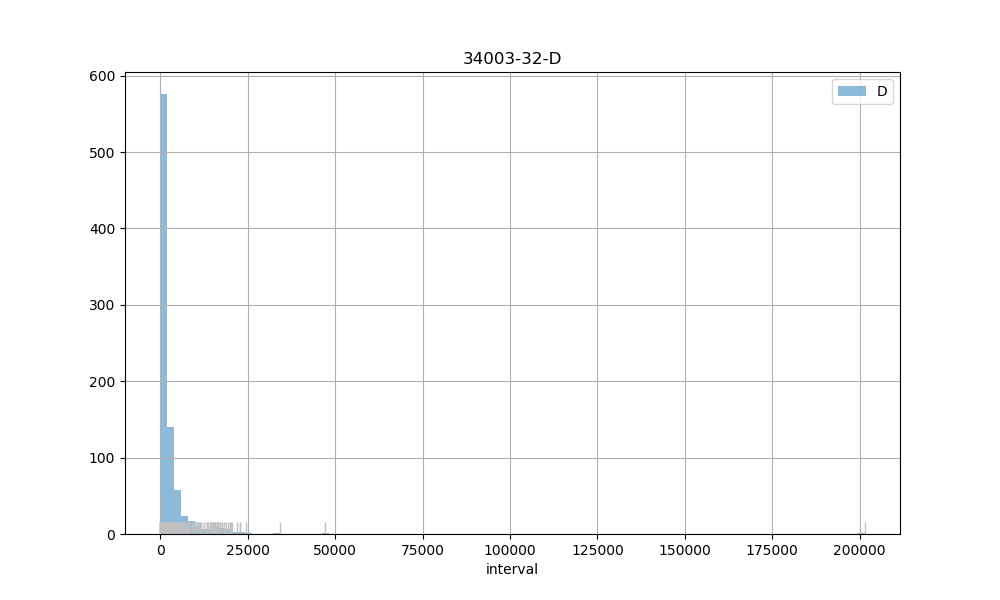

D count       865.00
mean       3097.49
std        7907.42
min           2.00
25%         899.00
50%        1015.00
75%        2715.00
max      201439.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


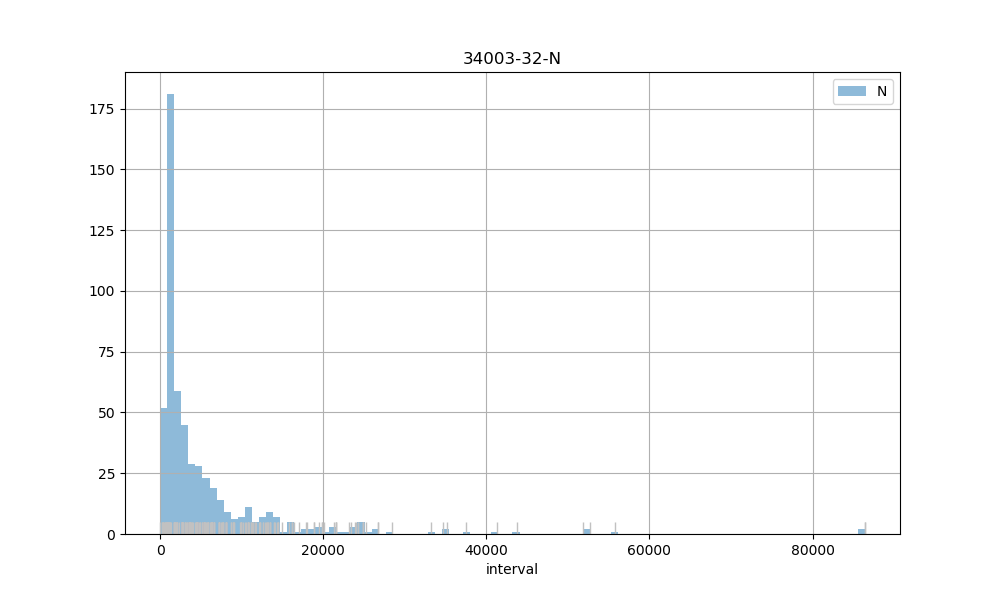

N count      554.00
mean      5307.29
std       8817.25
min          5.00
25%        905.00
50%       1828.00
75%       5886.50
max      86410.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


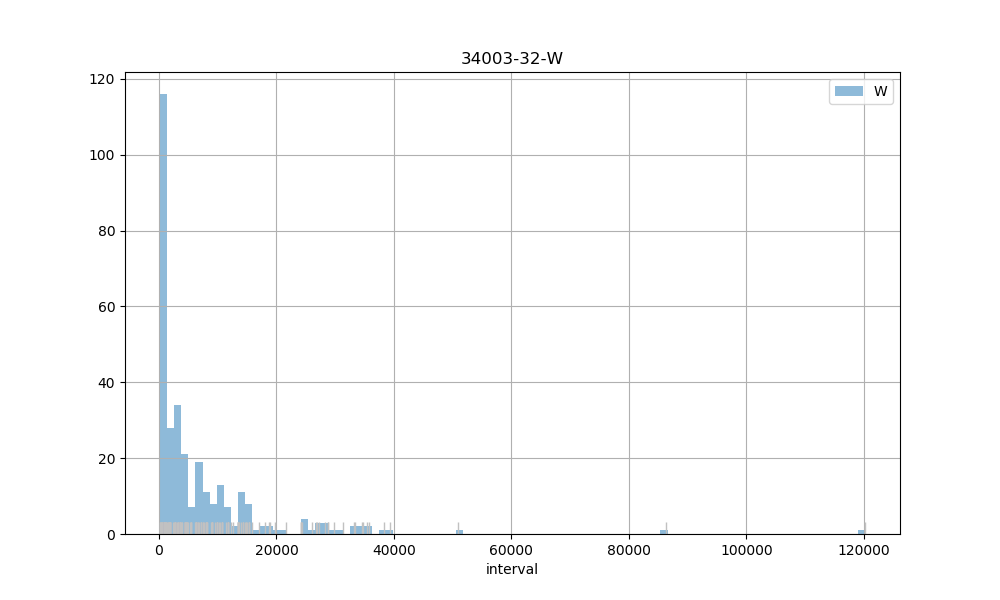

W count       316.00
mean       7009.16
std       11411.97
min         228.00
25%         909.75
50%        2882.00
75%        8847.00
max      120148.00
Name: interval, dtype: object
34003-35


<IPython.core.display.Javascript object>

D count     2326.00
mean      1034.95
std        628.26
min          8.00
25%        854.00
50%        922.00
75%        955.00
max      12645.00
Name: interval, dtype: object
N count     2409.00
mean      1323.30
std       1187.03
min          8.00
25%        876.00
50%        927.00
75%       1021.00
max      21563.00
Name: interval, dtype: object
W count     1603.00
mean      1397.05
std       1061.16
min          8.00
25%        891.00
50%        935.00
75%       1748.50
max      13441.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count     2326.00
mean      1034.95
std        628.26
min          8.00
25%        854.00
50%        922.00
75%        955.00
max      12645.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count     2409.00
mean      1323.30
std       1187.03
min          8.00
25%        876.00
50%        927.00
75%       1021.00
max      21563.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


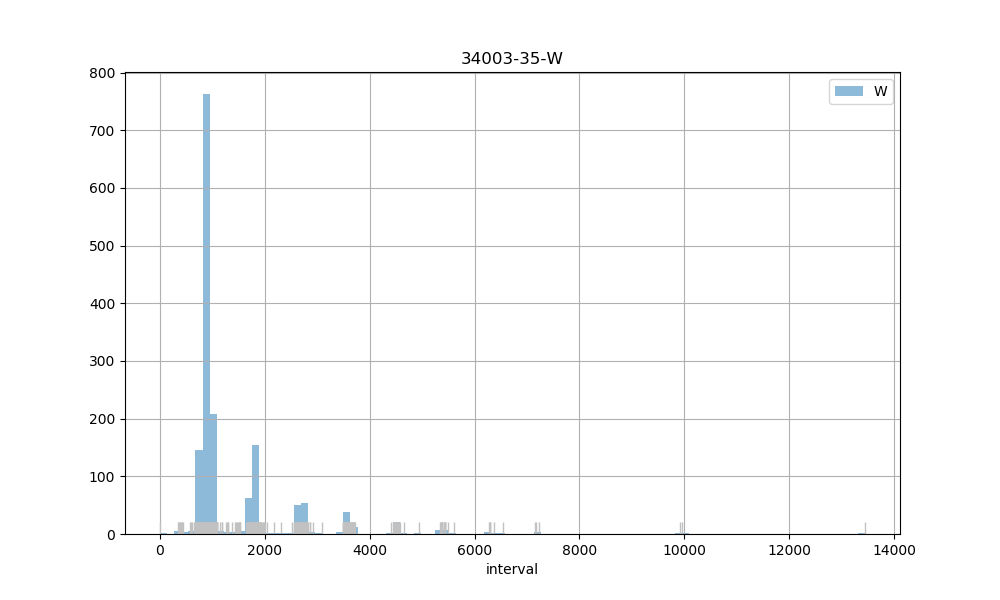

W count     1603.00
mean      1397.05
std       1061.16
min          8.00
25%        891.00
50%        935.00
75%       1748.50
max      13441.00
Name: interval, dtype: object
34003-36


<IPython.core.display.Javascript object>


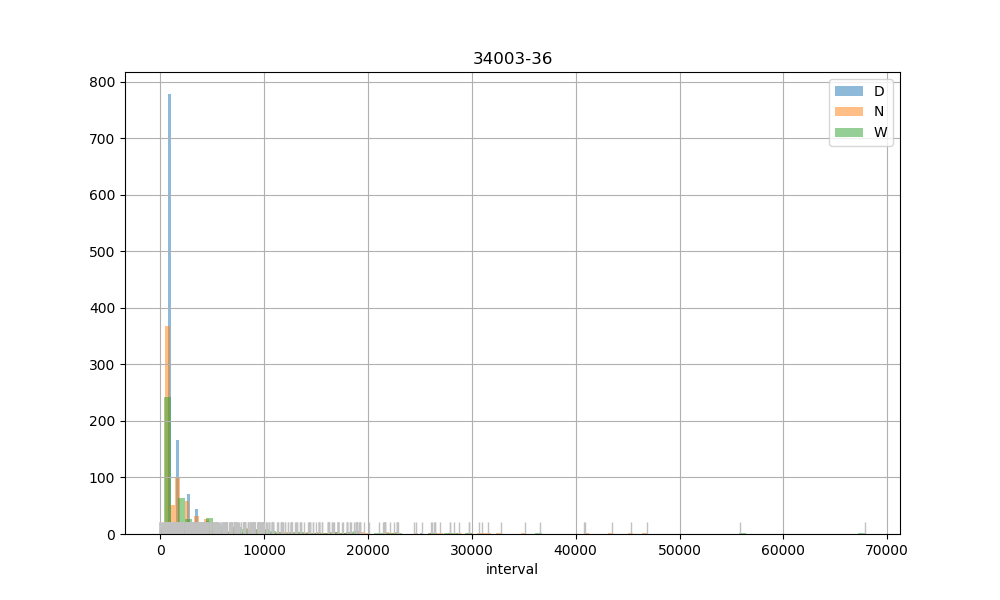

D count     1248.00
mean      1981.56
std       2428.93
min          2.00
25%        895.00
50%        916.00
75%       1807.25
max      26076.00
Name: interval, dtype: object
N count      842.00
mean      3812.35
std       6104.03
min          4.00
25%        897.00
50%       1162.00
75%       3614.75
max      46898.00
Name: interval, dtype: object
W count      520.00
mean      4096.93
std       6206.97
min        358.00
25%        901.00
50%       1787.50
75%       4887.00
max      67836.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count     1248.00
mean      1981.56
std       2428.93
min          2.00
25%        895.00
50%        916.00
75%       1807.25
max      26076.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count      842.00
mean      3812.35
std       6104.03
min          4.00
25%        897.00
50%       1162.00
75%       3614.75
max      46898.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count      520.00
mean      4096.93
std       6206.97
min        358.00
25%        901.00
50%       1787.50
75%       4887.00
max      67836.00
Name: interval, dtype: object
34003-37


/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


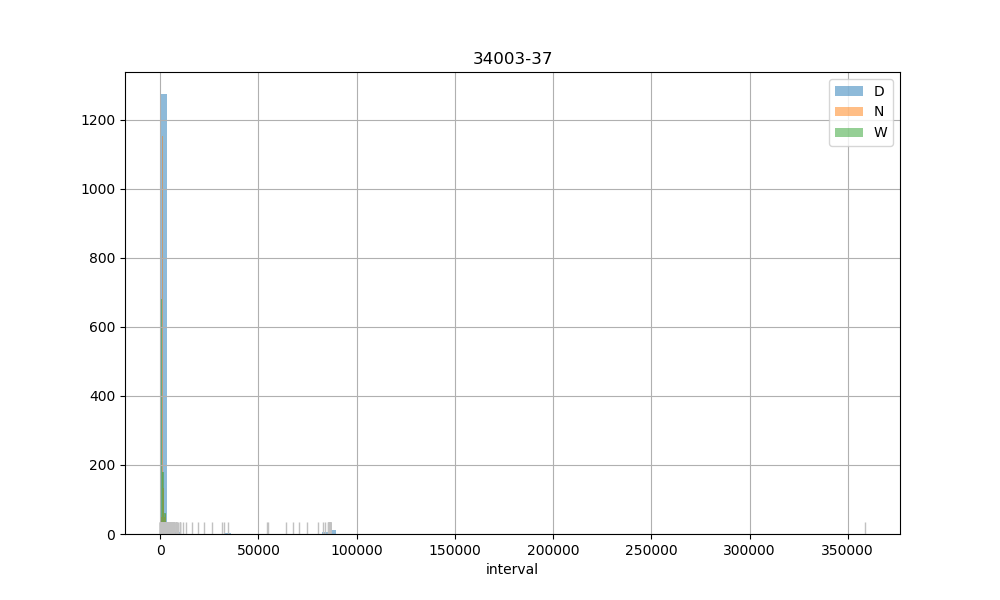

D count      1326.00
mean       2747.84
std       14317.78
min           2.00
25%         868.00
50%         905.00
75%         960.00
max      358673.00
Name: interval, dtype: object
N count     1497.00
mean      1291.31
std       2147.31
min        182.00
25%        888.00
50%        909.00
75%       1017.00
max      54937.00
Name: interval, dtype: object
W count     1014.00
mean      2227.46
std       8321.95
min        176.00
25%        891.00
50%        919.00
75%       1773.75
max      86451.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count      1326.00
mean       2747.84
std       14317.78
min           2.00
25%         868.00
50%         905.00
75%         960.00
max      358673.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count     1497.00
mean      1291.31
std       2147.31
min        182.00
25%        888.00
50%        909.00
75%       1017.00
max      54937.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count     1014.00
mean      2227.46
std       8321.95
min        176.00
25%        891.00
50%        919.00
75%       1773.75
max      86451.00
Name: interval, dtype: object
34003-39


<IPython.core.display.Javascript object>

D count       139.00
mean      19914.74
std       27473.25
min           2.00
25%        1762.00
50%        6308.00
75%       33953.00
max      216393.00
Name: interval, dtype: object
N count      199.00
mean     13760.21
std      20274.08
min        205.00
25%       1792.50
50%       6311.00
75%      15144.00
max      86498.00
Name: interval, dtype: object
W count      102.00
mean     22188.83
std      26515.54
min        796.00
25%       3583.25
50%       9586.50
75%      34575.00
max      86495.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count       139.00
mean      19914.74
std       27473.25
min           2.00
25%        1762.00
50%        6308.00
75%       33953.00
max      216393.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count      199.00
mean     13760.21
std      20274.08
min        205.00
25%       1792.50
50%       6311.00
75%      15144.00
max      86498.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count      102.00
mean     22188.83
std      26515.54
min        796.00
25%       3583.25
50%       9586.50
75%      34575.00
max      86495.00
Name: interval, dtype: object
34003-40


<IPython.core.display.Javascript object>


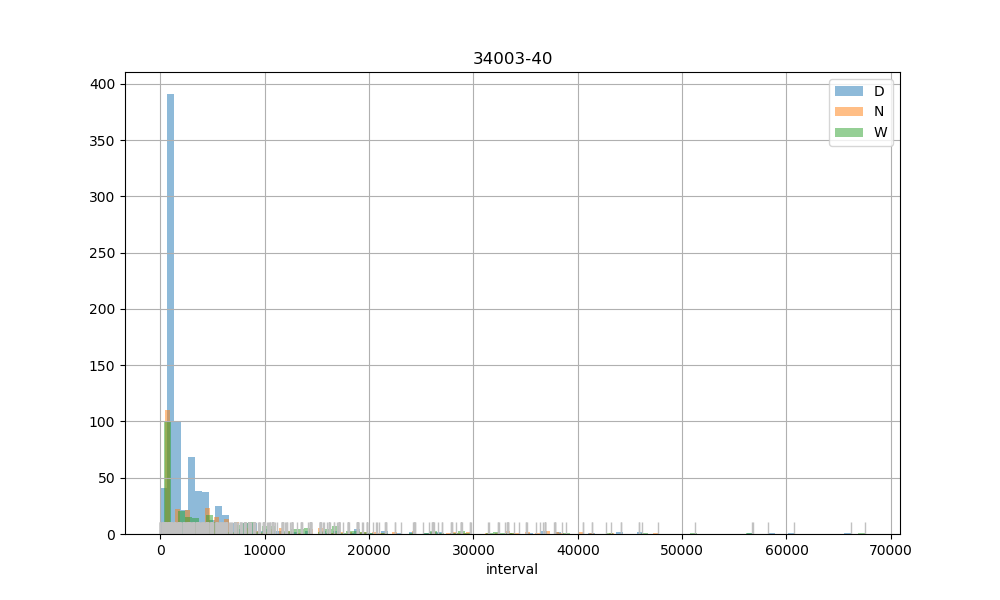

D count      846.00
mean      3723.67
std       7125.15
min          2.00
25%        895.25
50%       1043.50
75%       3587.75
max      66138.00
Name: interval, dtype: object
N count      317.00
mean      7588.59
std      10228.05
min        474.00
25%        905.00
50%       2758.00
75%       8146.00
max      47691.00
Name: interval, dtype: object
W count      309.00
mean      7292.79
std       9627.68
min        375.00
25%        918.00
50%       3600.00
75%       9433.00
max      67504.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


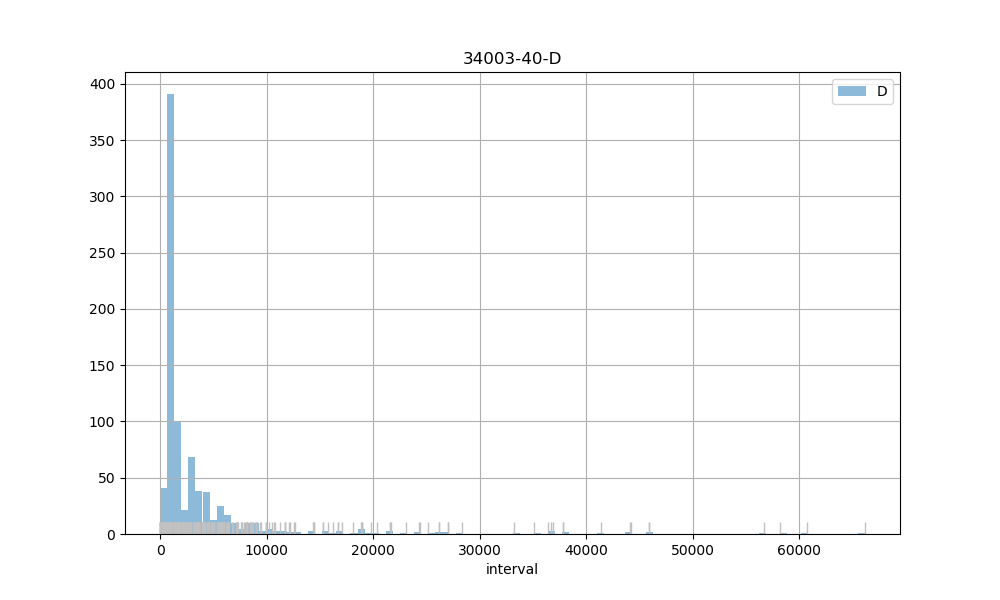

D count      846.00
mean      3723.67
std       7125.15
min          2.00
25%        895.25
50%       1043.50
75%       3587.75
max      66138.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count      317.00
mean      7588.59
std      10228.05
min        474.00
25%        905.00
50%       2758.00
75%       8146.00
max      47691.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count      309.00
mean      7292.79
std       9627.68
min        375.00
25%        918.00
50%       3600.00
75%       9433.00
max      67504.00
Name: interval, dtype: object
34003-41


<IPython.core.display.Javascript object>


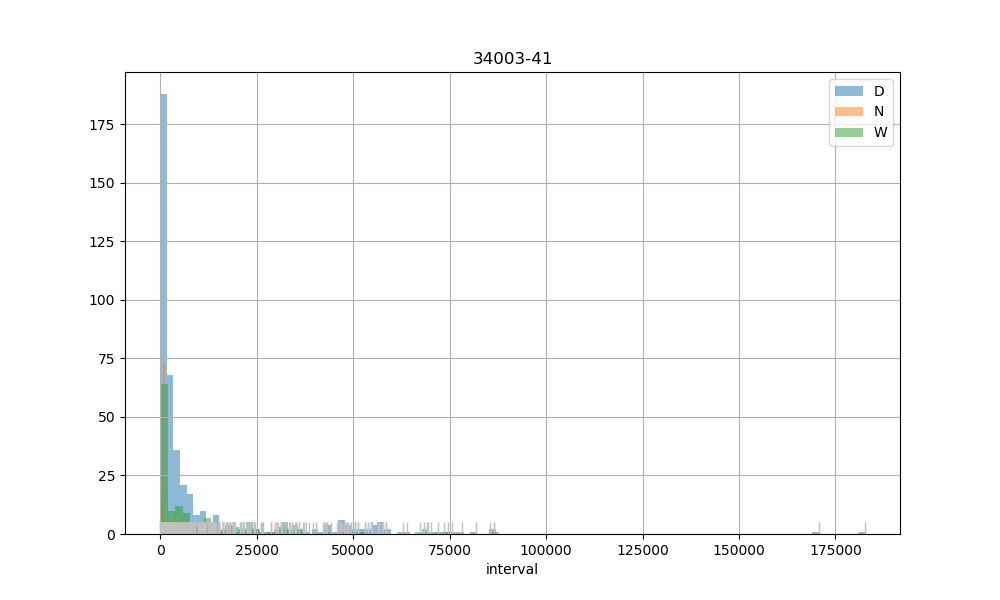

D count       432.00
mean      10009.06
std       18477.38
min           2.00
25%         912.50
50%        1833.50
75%        8046.50
max      170611.00
Name: interval, dtype: object
N count      203.00
mean      6282.82
std       9456.70
min        207.00
25%        892.00
50%       1806.00
75%       7202.00
max      48501.00
Name: interval, dtype: object
W count       155.00
mean      13868.72
std       23148.72
min         306.00
25%         906.00
50%        4532.00
75%       17154.50
max      182594.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count       432.00
mean      10009.06
std       18477.38
min           2.00
25%         912.50
50%        1833.50
75%        8046.50
max      170611.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count      203.00
mean      6282.82
std       9456.70
min        207.00
25%        892.00
50%       1806.00
75%       7202.00
max      48501.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count       155.00
mean      13868.72
std       23148.72
min         306.00
25%         906.00
50%        4532.00
75%       17154.50
max      182594.00
Name: interval, dtype: object
34003-42


<IPython.core.display.Javascript object>


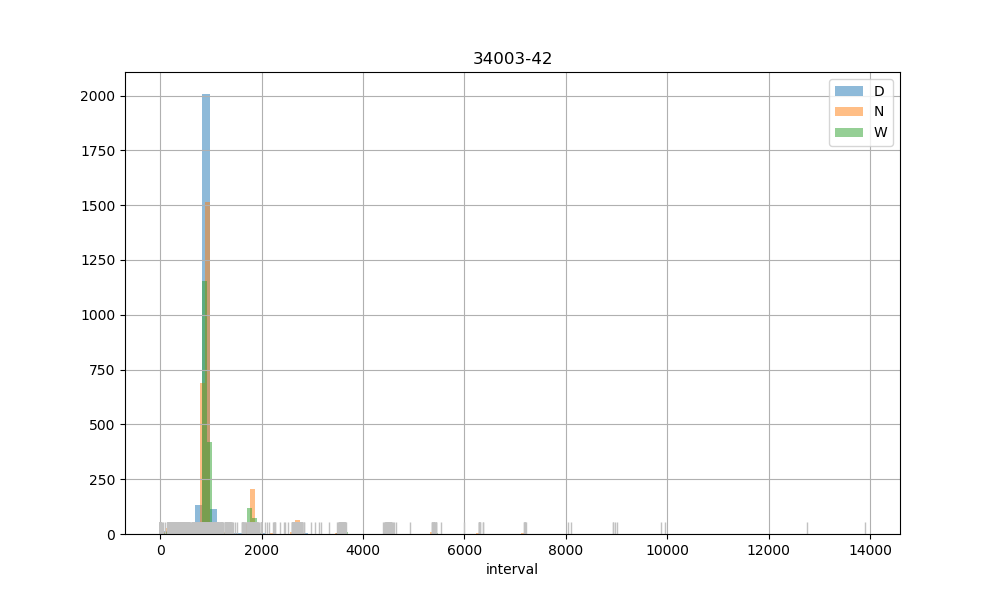

D count     2436.00
mean       980.18
std        553.50
min          2.00
25%        881.00
50%        902.00
75%        927.00
max      13891.00
Name: interval, dtype: object
N count    2869.00
mean     1117.64
std       802.25
min         2.00
25%       883.00
50%       904.00
75%       935.00
max      9868.00
Name: interval, dtype: object
W count    2006.00
mean     1117.68
std       680.01
min        25.00
25%       882.00
50%       905.00
75%       943.00
max      9943.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count     2436.00
mean       980.18
std        553.50
min          2.00
25%        881.00
50%        902.00
75%        927.00
max      13891.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count    2869.00
mean     1117.64
std       802.25
min         2.00
25%       883.00
50%       904.00
75%       935.00
max      9868.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count    2006.00
mean     1117.68
std       680.01
min        25.00
25%       882.00
50%       905.00
75%       943.00
max      9943.00
Name: interval, dtype: object
34003-45


<IPython.core.display.Javascript object>


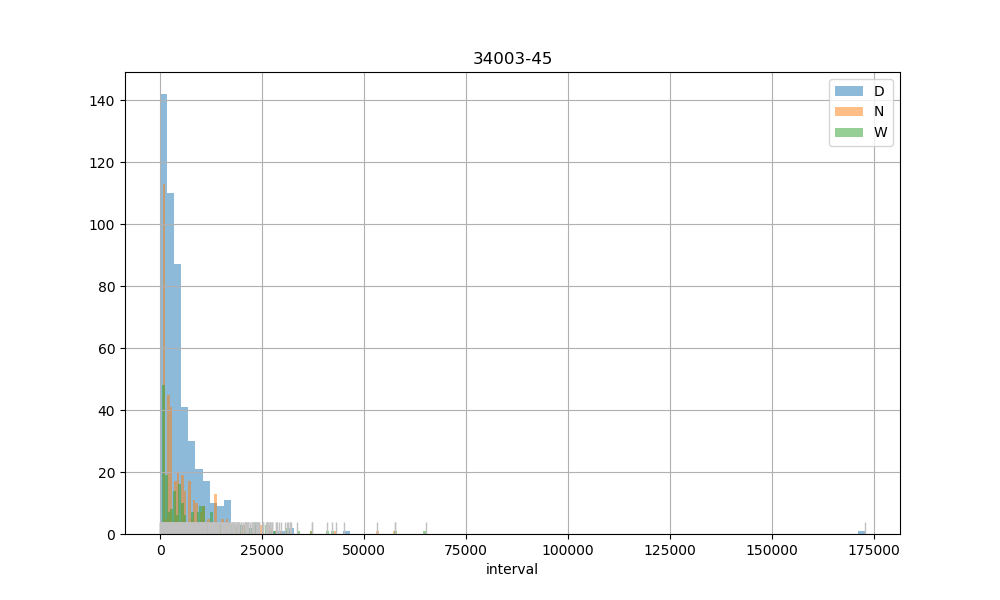

D count       493.00
mean       5226.22
std        9319.18
min           2.00
25%         986.00
50%        2921.00
75%        6288.00
max      172810.00
Name: interval, dtype: object
N count      421.00
mean      6478.84
std       7726.05
min          3.00
25%        963.00
50%       3563.00
75%       8184.00
max      57580.00
Name: interval, dtype: object
W count      234.00
mean      8690.14
std       9840.60
min        539.00
25%       1788.25
50%       4967.50
75%      11467.75
max      65223.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count       493.00
mean       5226.22
std        9319.18
min           2.00
25%         986.00
50%        2921.00
75%        6288.00
max      172810.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count      421.00
mean      6478.84
std       7726.05
min          3.00
25%        963.00
50%       3563.00
75%       8184.00
max      57580.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count      234.00
mean      8690.14
std       9840.60
min        539.00
25%       1788.25
50%       4967.50
75%      11467.75
max      65223.00
Name: interval, dtype: object
34003-47


<IPython.core.display.Javascript object>

D count       312.00
mean      10816.41
std       47996.09
min           2.00
25%         936.75
50%        2756.00
75%        9923.50
max      834898.00
Name: interval, dtype: object
N count      280.00
mean      9406.28
std      11890.45
min        221.00
25%        963.50
50%       4495.50
75%      15179.00
max      86498.00
Name: interval, dtype: object
W count      142.00
mean     12772.14
std      14215.46
min        272.00
25%       1252.00
50%       9331.50
75%      19107.00
max      65922.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count       312.00
mean      10816.41
std       47996.09
min           2.00
25%         936.75
50%        2756.00
75%        9923.50
max      834898.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count      280.00
mean      9406.28
std      11890.45
min        221.00
25%        963.50
50%       4495.50
75%      15179.00
max      86498.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


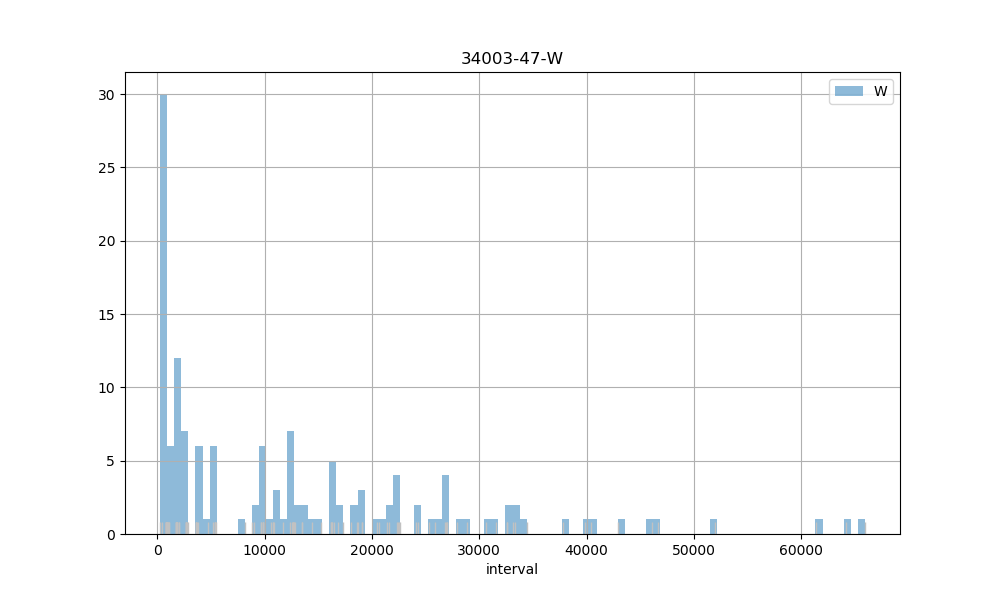

W count      142.00
mean     12772.14
std      14215.46
min        272.00
25%       1252.00
50%       9331.50
75%      19107.00
max      65922.00
Name: interval, dtype: object
34003-50


<IPython.core.display.Javascript object>


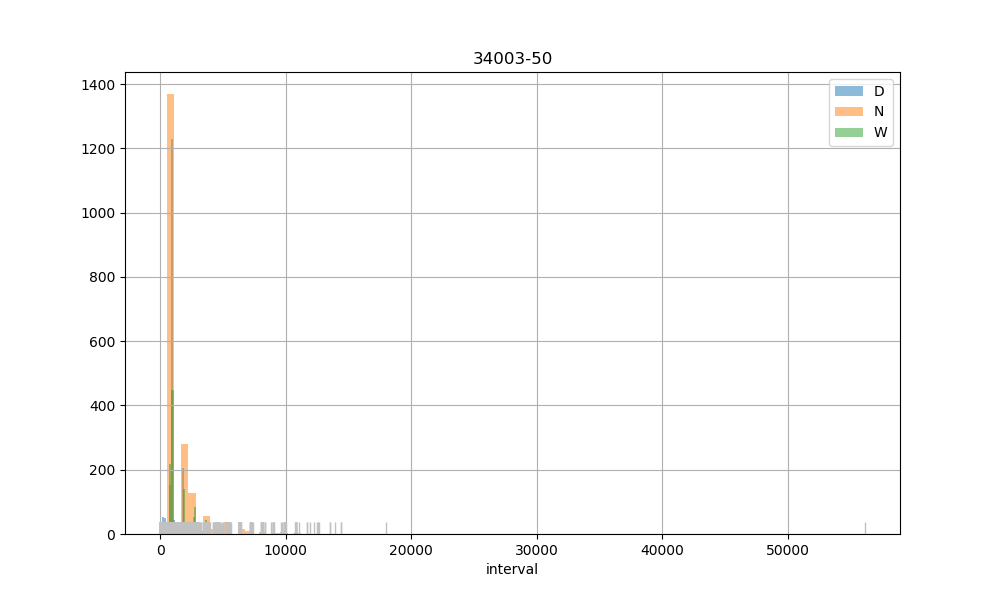

D count     2006.00
mean      1213.22
std       1092.41
min         -2.00
25%        880.25
50%        907.00
75%        969.75
max      14374.00
Name: interval, dtype: object
N count     2000.00
mean      1591.24
std       1906.85
min          2.00
25%        892.00
50%        914.00
75%       1792.00
max      56138.00
Name: interval, dtype: object
W count     1206.00
mean      1839.38
std       1793.15
min        175.00
25%        893.00
50%        931.00
75%       1845.50
max      17976.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


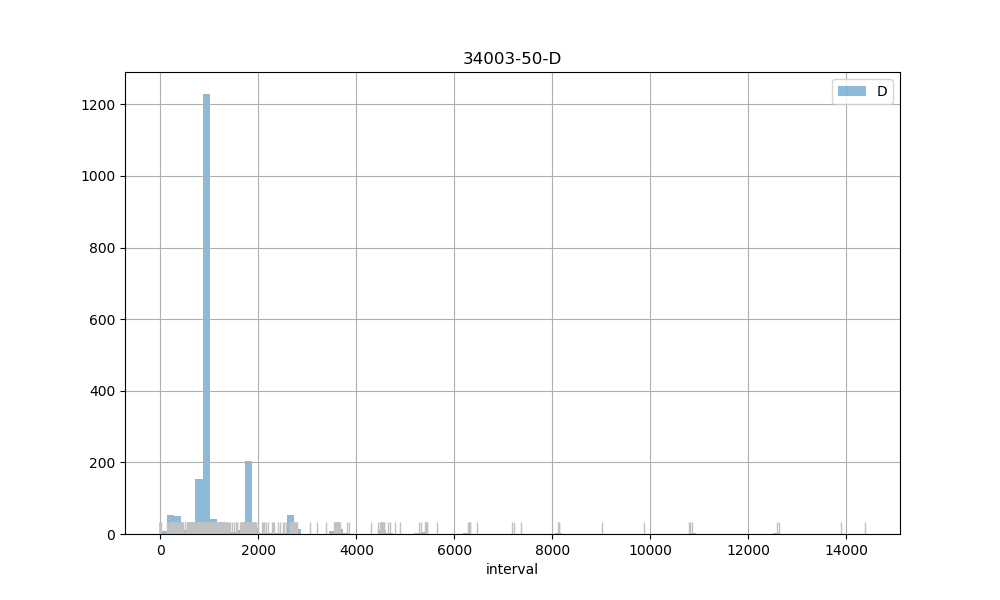

D count     2006.00
mean      1213.22
std       1092.41
min         -2.00
25%        880.25
50%        907.00
75%        969.75
max      14374.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count     2000.00
mean      1591.24
std       1906.85
min          2.00
25%        892.00
50%        914.00
75%       1792.00
max      56138.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


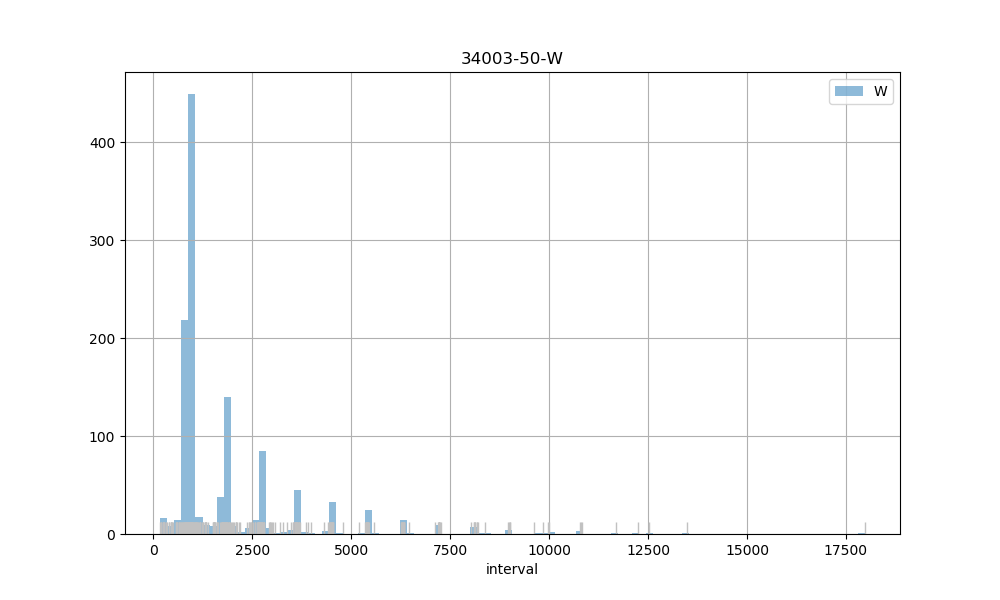

W count     1206.00
mean      1839.38
std       1793.15
min        175.00
25%        893.00
50%        931.00
75%       1845.50
max      17976.00
Name: interval, dtype: object
34003-51


<IPython.core.display.Javascript object>


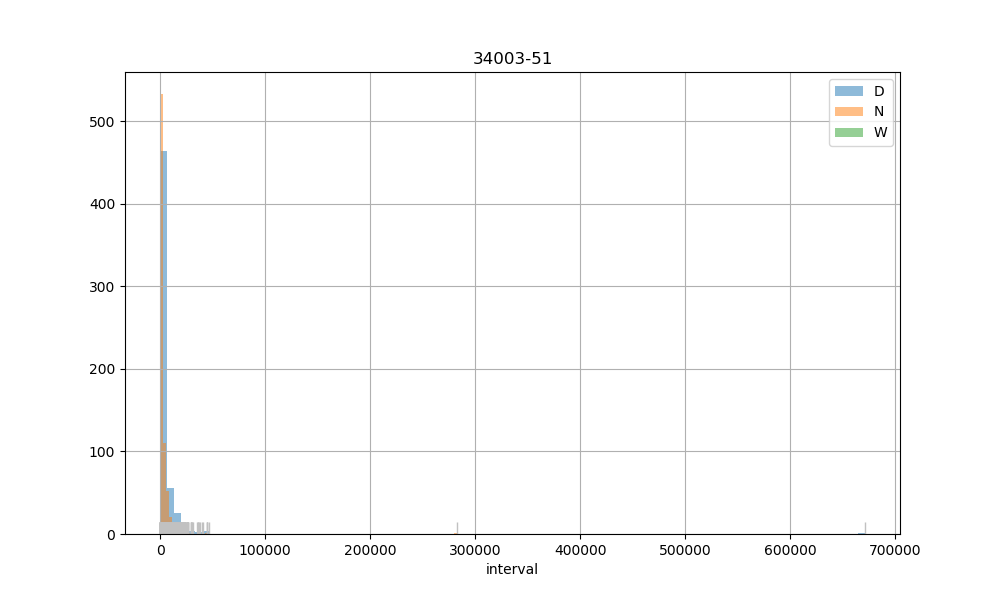

D count       570.00
mean       5621.75
std       28711.70
min           2.00
25%         904.25
50%        1787.50
75%        4538.00
max      670996.00
Name: interval, dtype: object
N count       753.00
mean       3459.74
std       10961.45
min           3.00
25%         902.00
50%        1780.00
75%        3594.00
max      282655.00
Name: interval, dtype: object
W count      463.00
mean      4373.46
std       5755.53
min        256.00
25%        909.00
50%       1820.00
75%       4739.00
max      39924.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


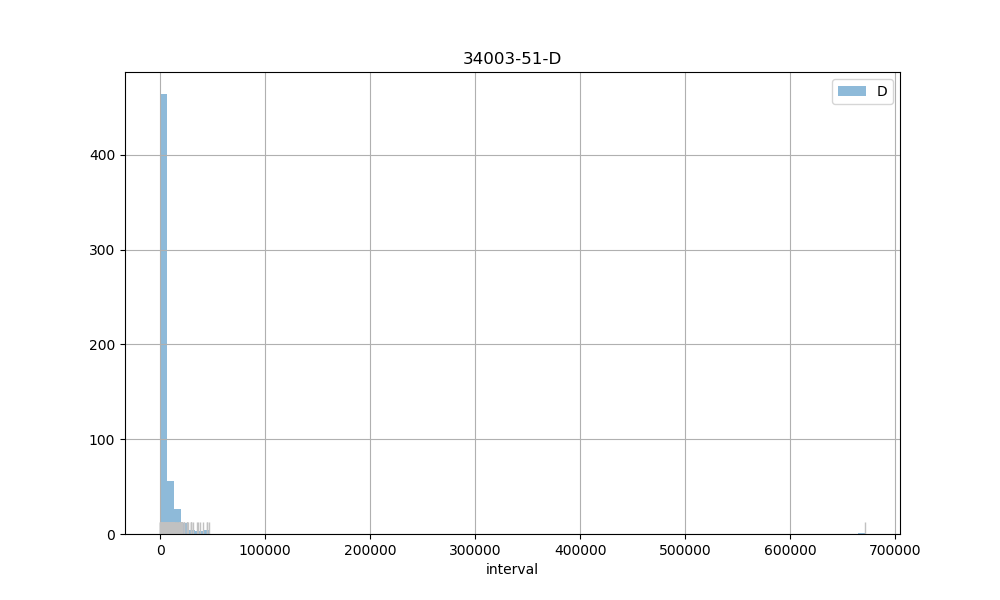

D count       570.00
mean       5621.75
std       28711.70
min           2.00
25%         904.25
50%        1787.50
75%        4538.00
max      670996.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


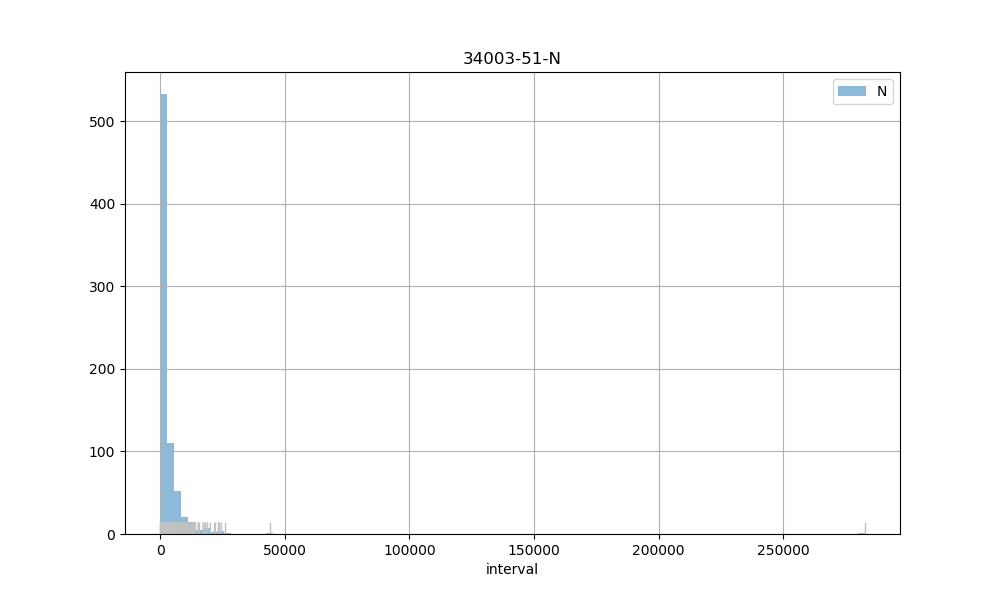

N count       753.00
mean       3459.74
std       10961.45
min           3.00
25%         902.00
50%        1780.00
75%        3594.00
max      282655.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count      463.00
mean      4373.46
std       5755.53
min        256.00
25%        909.00
50%       1820.00
75%       4739.00
max      39924.00
Name: interval, dtype: object
34003-52


<IPython.core.display.Javascript object>


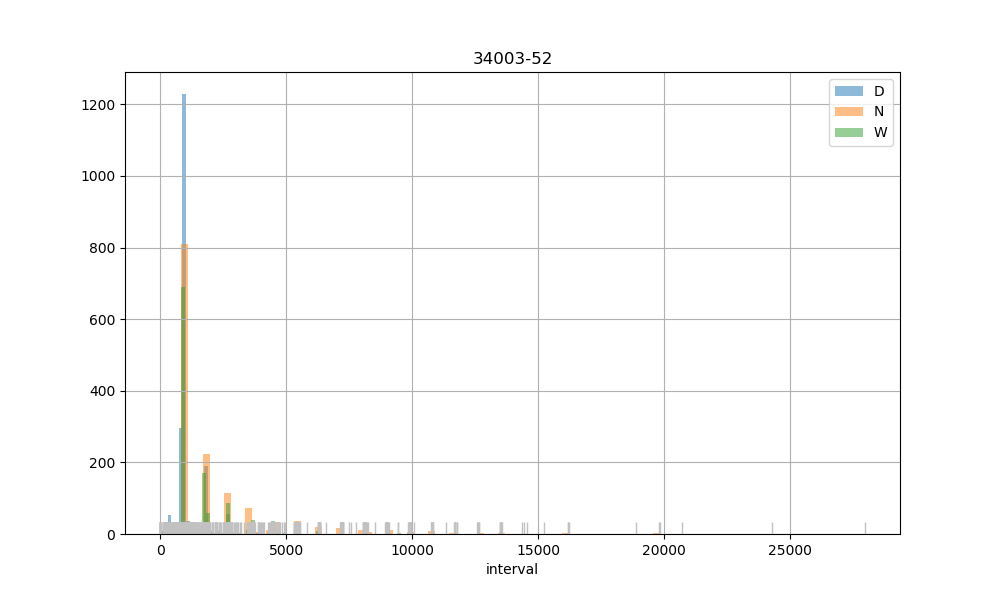

D count     2076.00
mean      1168.05
std       1009.29
min          2.00
25%        882.75
50%        904.00
75%        946.00
max      14536.00
Name: interval, dtype: object
N count     1458.00
mean      2169.53
std       2546.77
min          2.00
25%        897.00
50%        928.00
75%       2670.00
max      27953.00
Name: interval, dtype: object
W count     1247.00
mean      1792.14
std       1790.19
min         34.00
25%        896.00
50%        921.00
75%       1811.00
max      16171.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


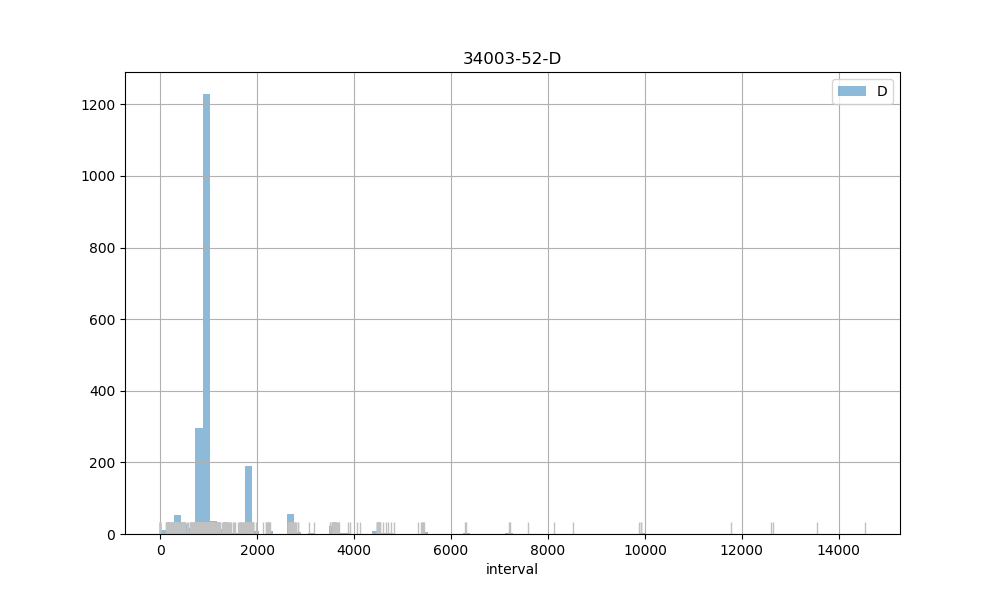

D count     2076.00
mean      1168.05
std       1009.29
min          2.00
25%        882.75
50%        904.00
75%        946.00
max      14536.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count     1458.00
mean      2169.53
std       2546.77
min          2.00
25%        897.00
50%        928.00
75%       2670.00
max      27953.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


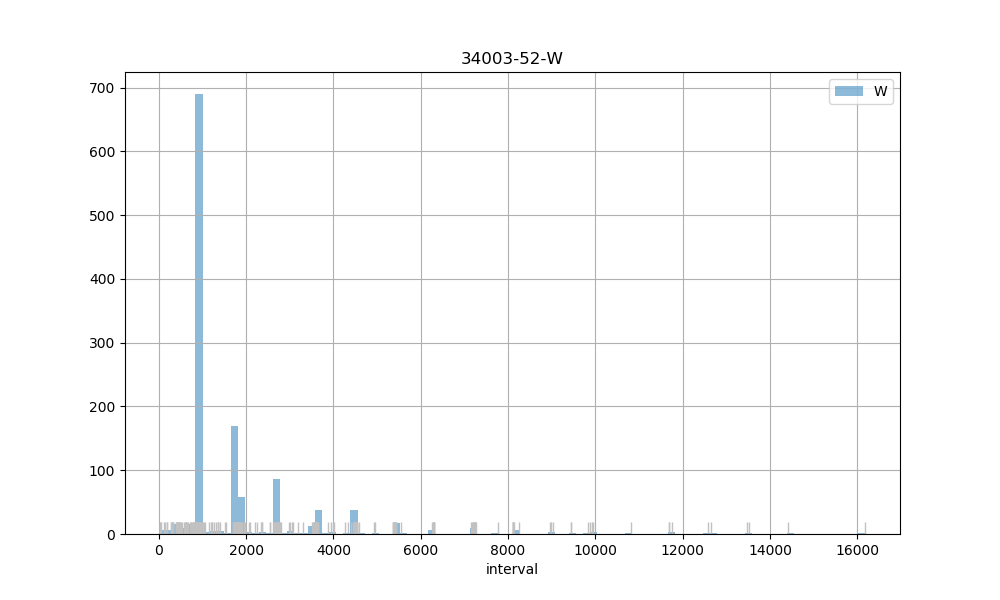

W count     1247.00
mean      1792.14
std       1790.19
min         34.00
25%        896.00
50%        921.00
75%       1811.00
max      16171.00
Name: interval, dtype: object
34003-53


<IPython.core.display.Javascript object>


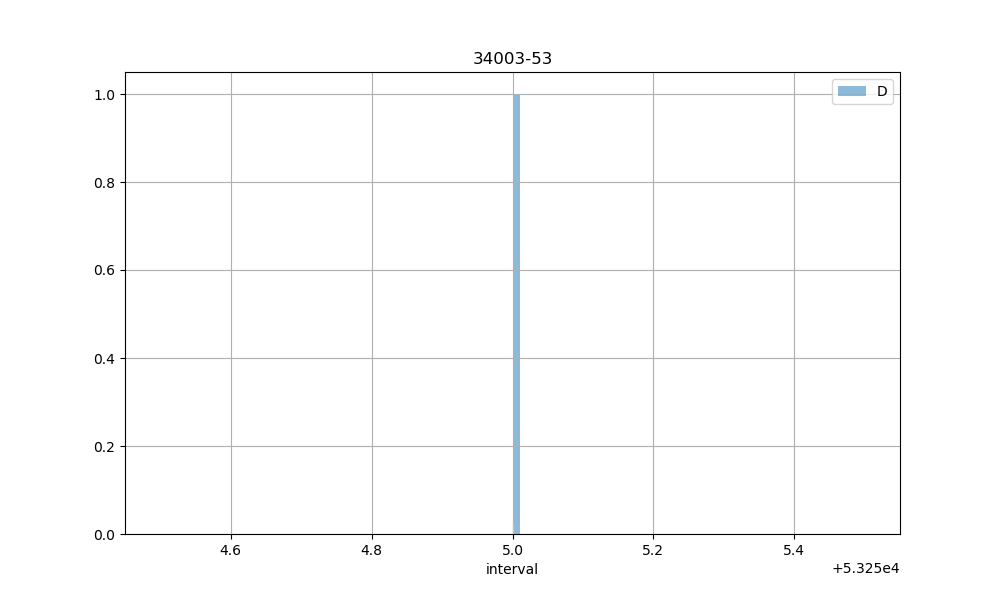

D count        1.00
mean     53255.00
std           nan
min      53255.00
25%      53255.00
50%      53255.00
75%      53255.00
max      53255.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count        1.00
mean     53255.00
std           nan
min      53255.00
25%      53255.00
50%      53255.00
75%      53255.00
max      53255.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


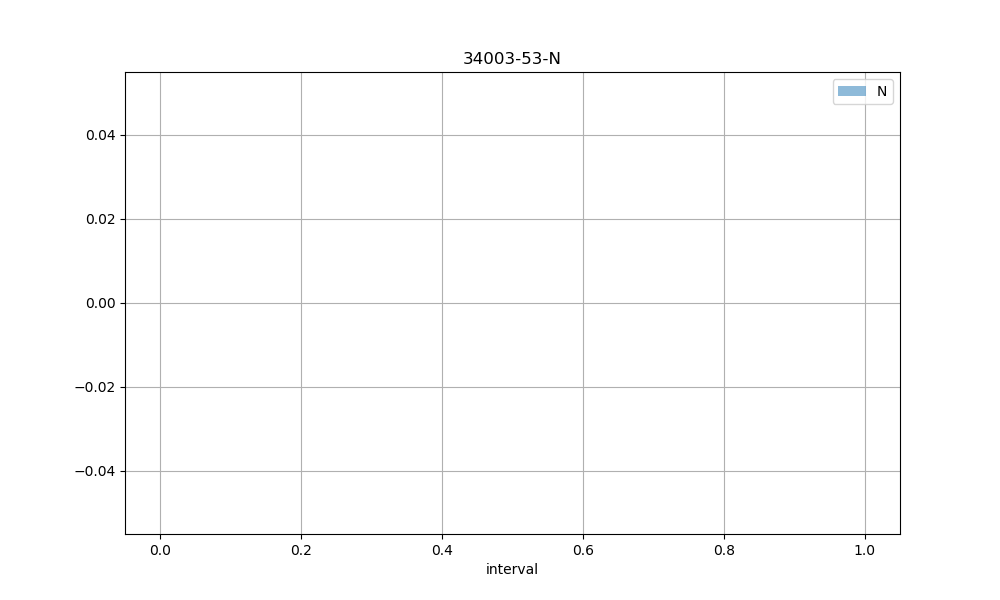

/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:198: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


N count    0.00
mean      nan
std       nan
min       nan
25%       nan
50%       nan
75%       nan
max       nan
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count    0.00
mean      nan
std       nan
min       nan
25%       nan
50%       nan
75%       nan
max       nan
Name: interval, dtype: object
34003-54


<IPython.core.display.Javascript object>

D count        618.00
mean        6361.58
std        69299.86
min            0.00
25%          896.00
50%         1743.50
75%         3233.50
max      1716395.00
Name: interval, dtype: object
N count      431.00
mean      5082.48
std       8494.04
min        202.00
25%        909.00
50%       1823.00
75%       5365.50
max      89085.00
Name: interval, dtype: object
W count      293.00
mean      5850.60
std       7926.17
min        294.00
25%        929.00
50%       2670.00
75%       7146.00
max      62096.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count        618.00
mean        6361.58
std        69299.86
min            0.00
25%          896.00
50%         1743.50
75%         3233.50
max      1716395.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


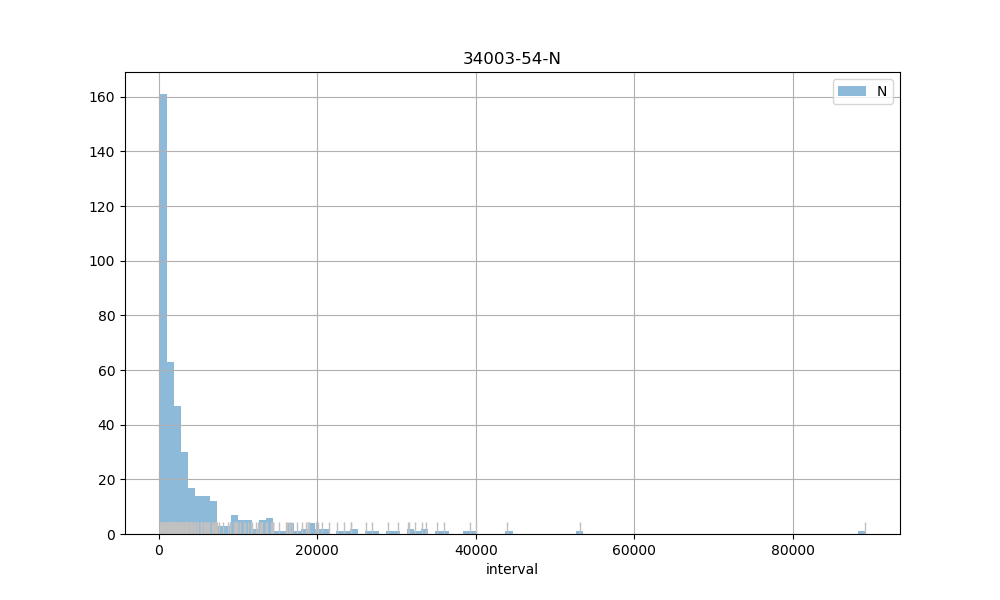

N count      431.00
mean      5082.48
std       8494.04
min        202.00
25%        909.00
50%       1823.00
75%       5365.50
max      89085.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count      293.00
mean      5850.60
std       7926.17
min        294.00
25%        929.00
50%       2670.00
75%       7146.00
max      62096.00
Name: interval, dtype: object
34003-56


<IPython.core.display.Javascript object>


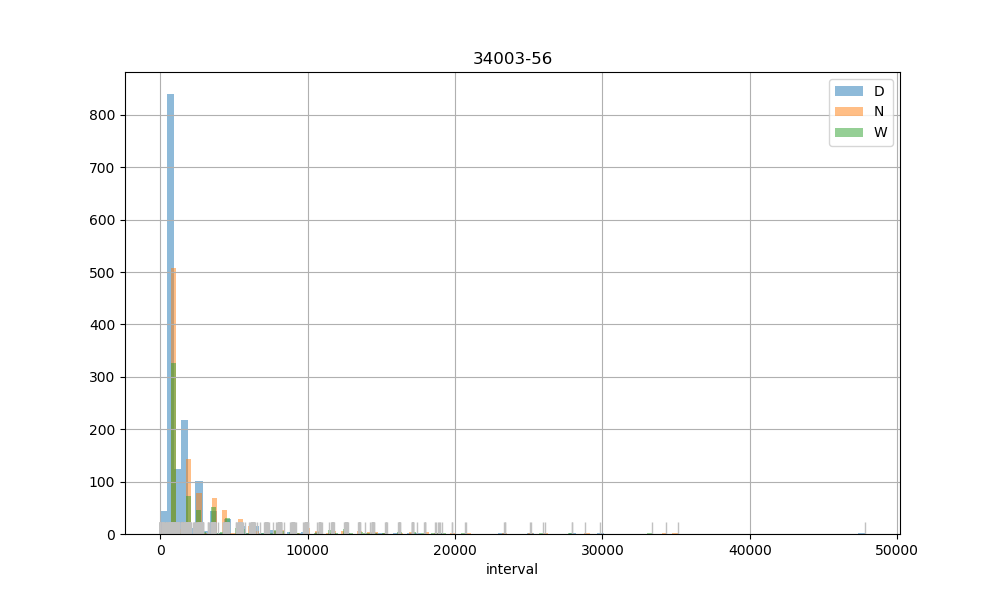

D count     1485.00
mean      1716.25
std       2507.55
min          2.00
25%        882.00
50%        927.00
75%       1793.00
max      47803.00
Name: interval, dtype: object
N count     1051.00
mean      2911.94
std       3878.85
min          1.00
25%        903.00
50%       1119.00
75%       3553.00
max      35103.00
Name: interval, dtype: object
W count      700.00
mean      3177.91
std       3990.89
min         95.00
25%        904.00
50%       1439.00
75%       3636.00
max      33343.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


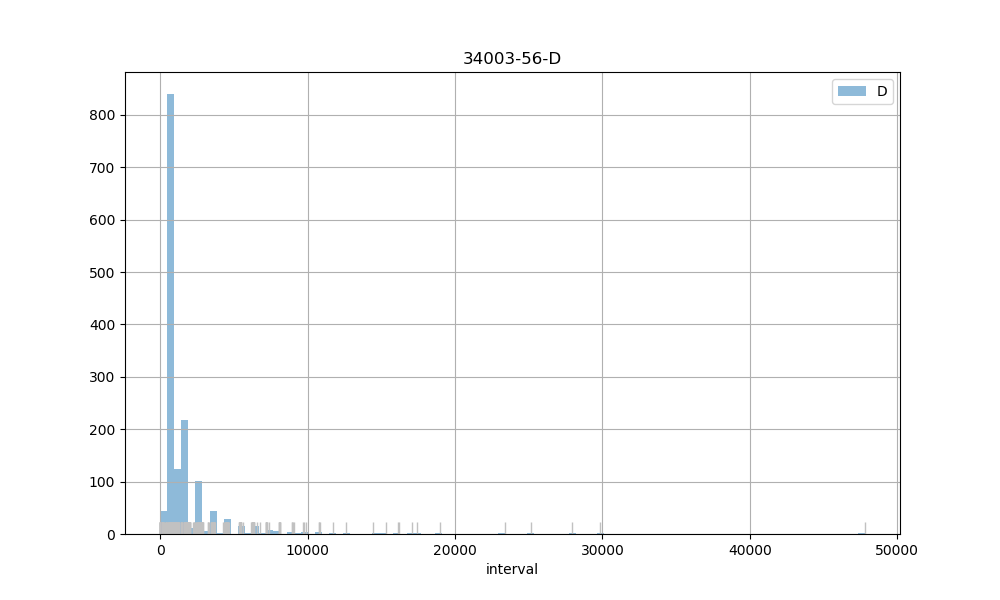

D count     1485.00
mean      1716.25
std       2507.55
min          2.00
25%        882.00
50%        927.00
75%       1793.00
max      47803.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


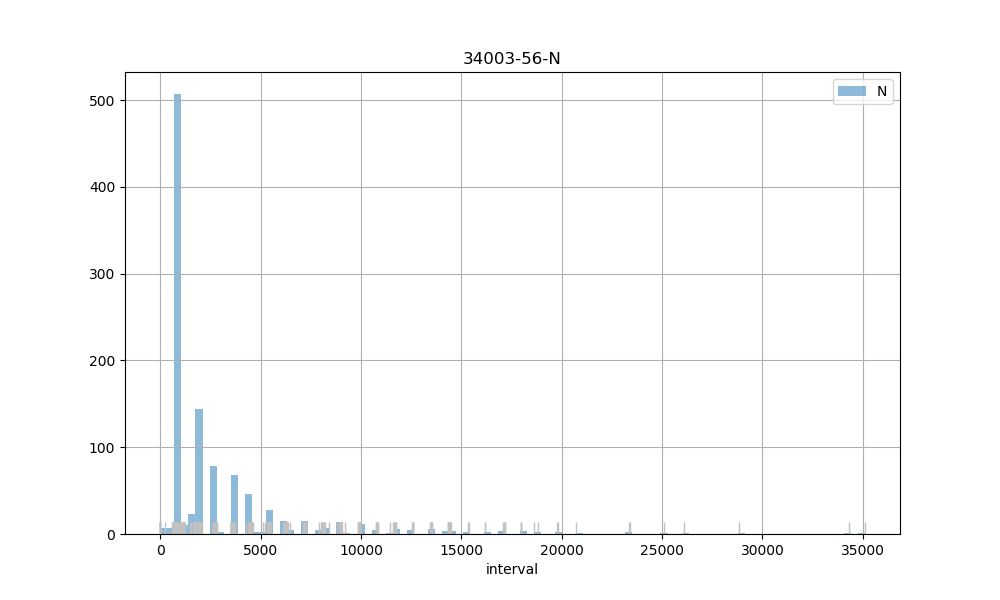

N count     1051.00
mean      2911.94
std       3878.85
min          1.00
25%        903.00
50%       1119.00
75%       3553.00
max      35103.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count      700.00
mean      3177.91
std       3990.89
min         95.00
25%        904.00
50%       1439.00
75%       3636.00
max      33343.00
Name: interval, dtype: object
34003-58


<IPython.core.display.Javascript object>


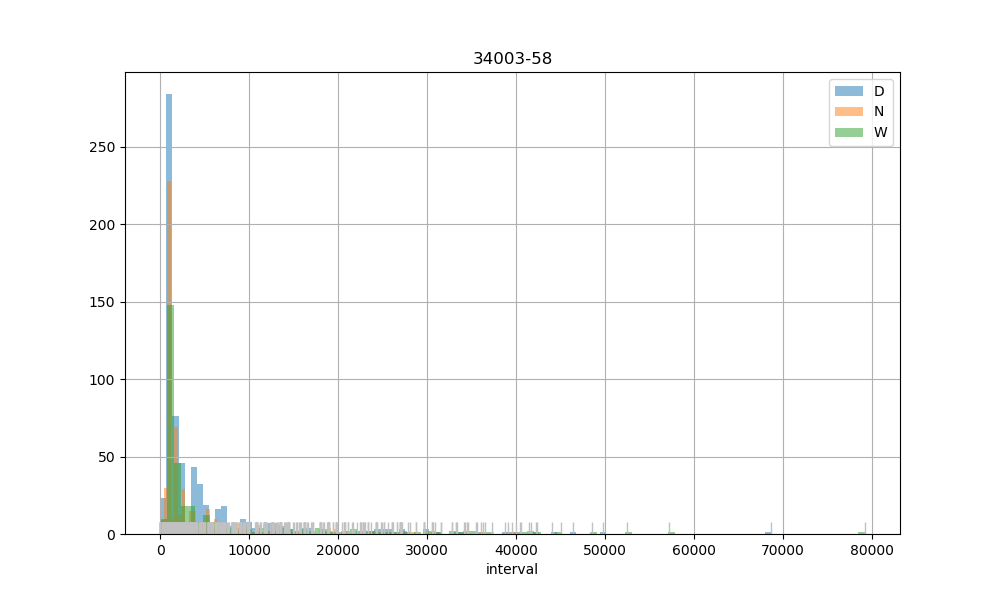

D count      679.00
mean      4788.92
std       7613.78
min          2.00
25%        898.00
50%       1780.00
75%       4573.50
max      68728.00
Name: interval, dtype: object
N count      571.00
mean      4127.88
std       6340.78
min          5.00
25%        896.00
50%       1757.00
75%       4128.50
max      39959.00
Name: interval, dtype: object
W count      348.00
mean      6401.07
std      10699.78
min          0.00
25%        896.75
50%       1788.00
75%       5769.25
max      79240.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count      679.00
mean      4788.92
std       7613.78
min          2.00
25%        898.00
50%       1780.00
75%       4573.50
max      68728.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count      571.00
mean      4127.88
std       6340.78
min          5.00
25%        896.00
50%       1757.00
75%       4128.50
max      39959.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


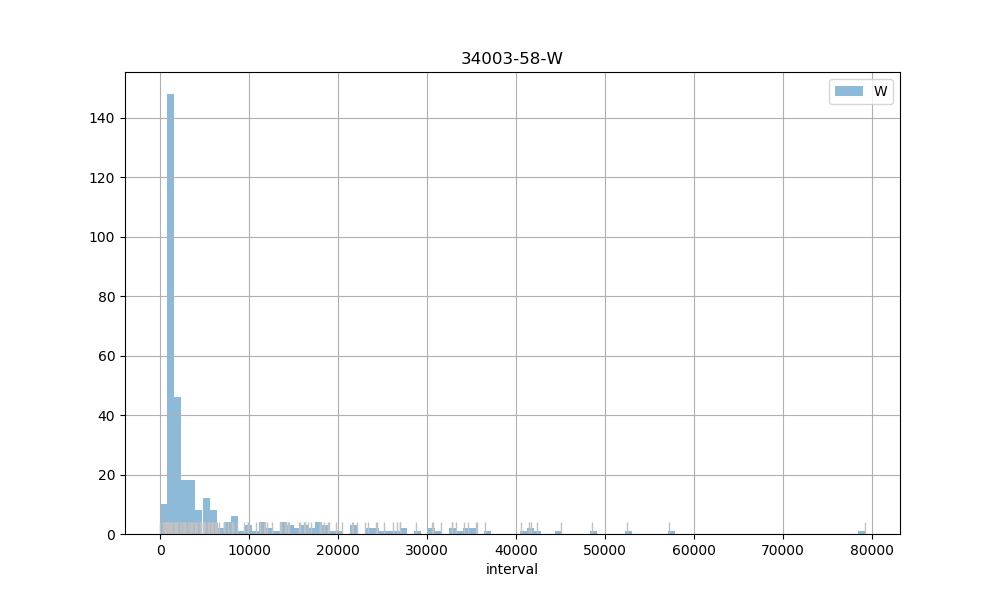

W count      348.00
mean      6401.07
std      10699.78
min          0.00
25%        896.75
50%       1788.00
75%       5769.25
max      79240.00
Name: interval, dtype: object
34003-59


<IPython.core.display.Javascript object>


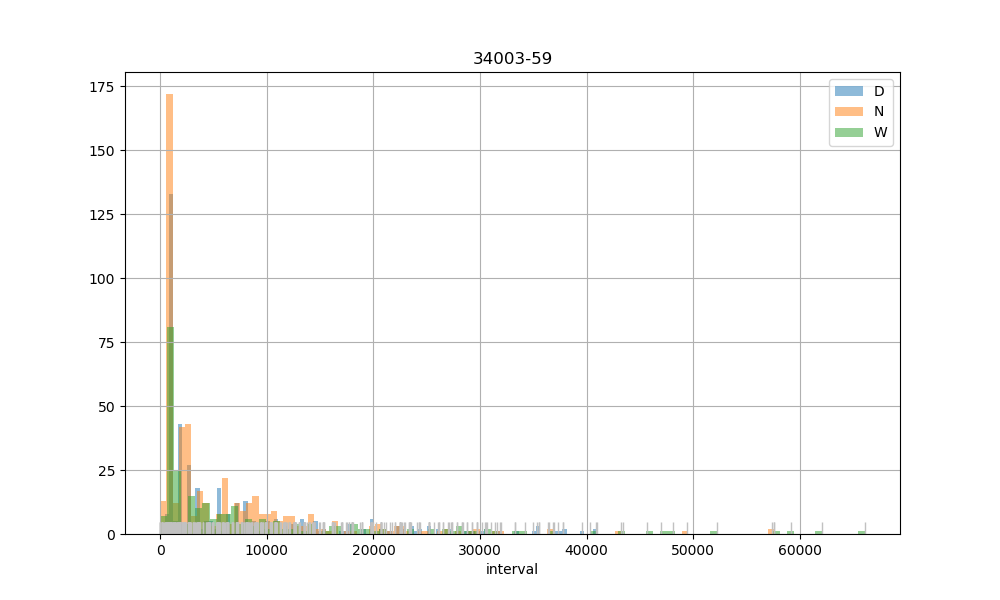

D count      398.00
mean      6670.34
std       8883.47
min          7.00
25%        909.25
50%       2672.50
75%       8120.75
max      40996.00
Name: interval, dtype: object
N count      507.00
mean      5794.71
std       7678.92
min          5.00
25%        906.50
50%       2686.00
75%       8225.50
max      57611.00
Name: interval, dtype: object
W count      272.00
mean      8215.40
std      11691.60
min          0.00
25%        913.75
50%       3581.00
75%       9903.25
max      66107.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


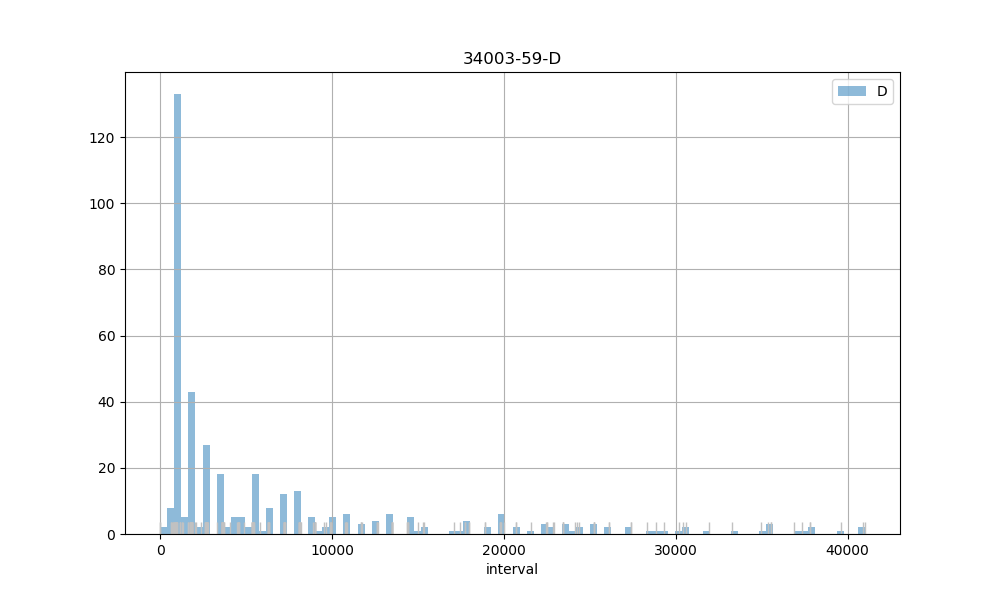

D count      398.00
mean      6670.34
std       8883.47
min          7.00
25%        909.25
50%       2672.50
75%       8120.75
max      40996.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


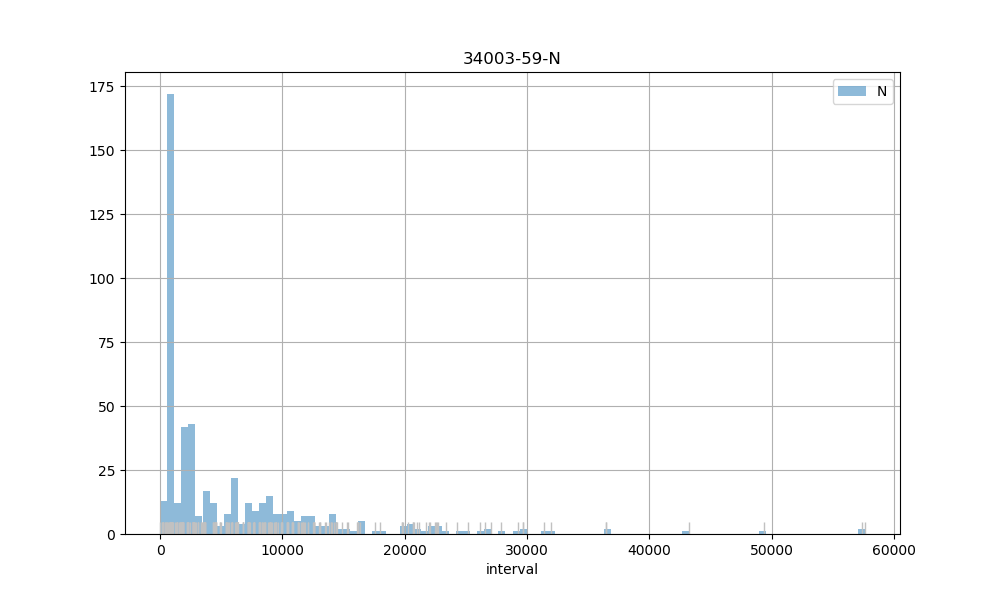

N count      507.00
mean      5794.71
std       7678.92
min          5.00
25%        906.50
50%       2686.00
75%       8225.50
max      57611.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count      272.00
mean      8215.40
std      11691.60
min          0.00
25%        913.75
50%       3581.00
75%       9903.25
max      66107.00
Name: interval, dtype: object
34003-57


<IPython.core.display.Javascript object>


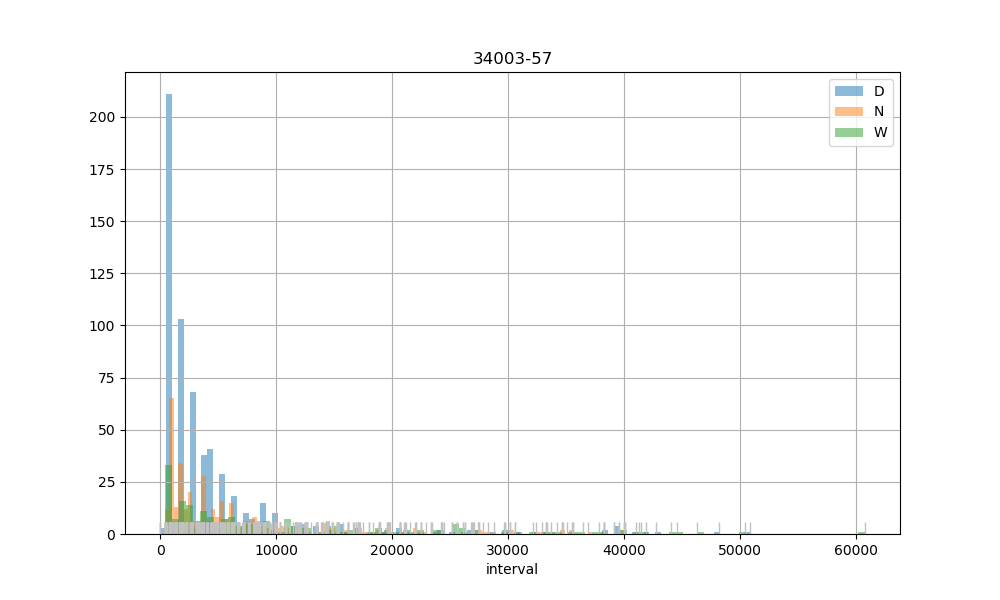

D count      634.00
mean      4789.03
std       7204.13
min          2.00
25%        911.25
50%       1992.50
75%       5326.75
max      50860.00
Name: interval, dtype: object
N count      379.00
mean      6735.69
std       7858.63
min        382.00
25%       1773.00
50%       3618.00
75%       8202.50
max      40054.00
Name: interval, dtype: object
W count      209.00
mean     10614.20
std      11816.48
min        371.00
25%       1818.00
50%       5856.00
75%      15303.00
max      60796.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


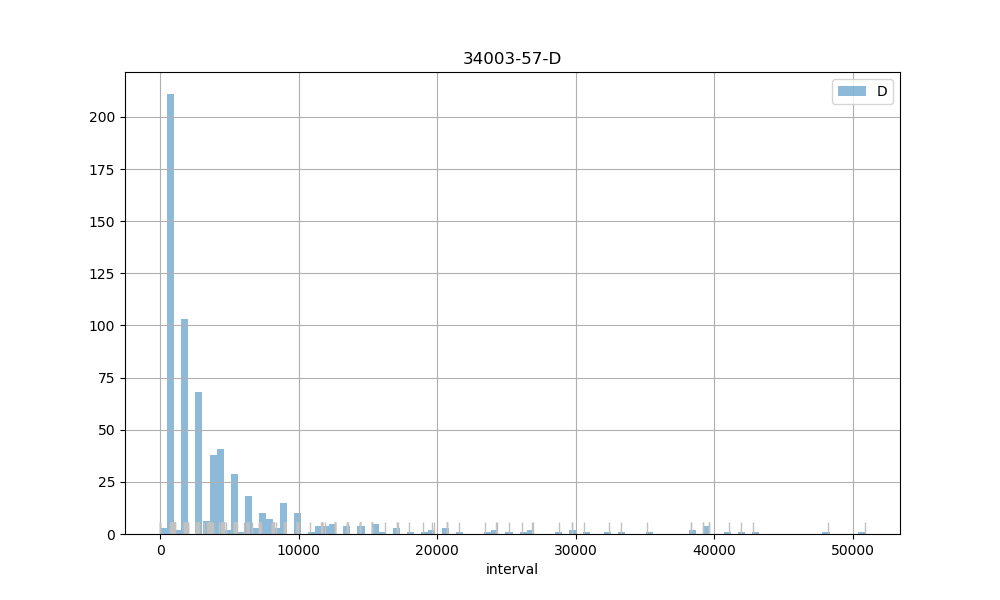

D count      634.00
mean      4789.03
std       7204.13
min          2.00
25%        911.25
50%       1992.50
75%       5326.75
max      50860.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


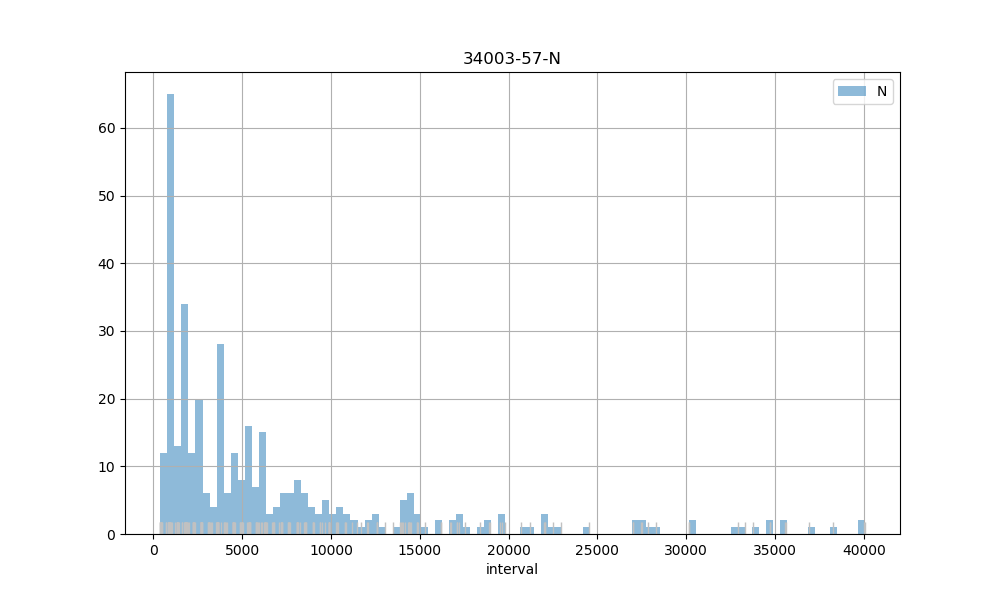

N count      379.00
mean      6735.69
std       7858.63
min        382.00
25%       1773.00
50%       3618.00
75%       8202.50
max      40054.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


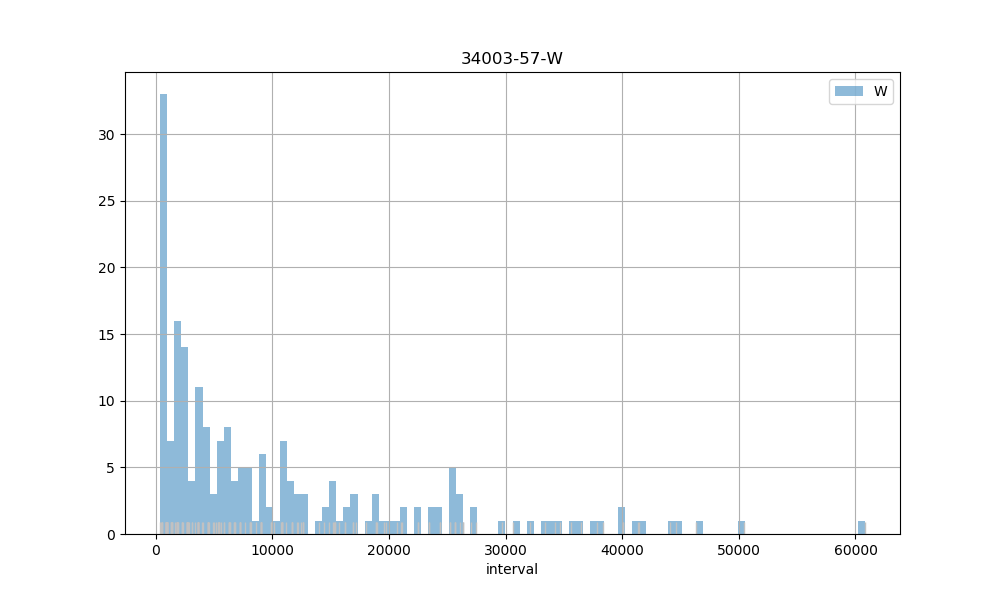

W count      209.00
mean     10614.20
std      11816.48
min        371.00
25%       1818.00
50%       5856.00
75%      15303.00
max      60796.00
Name: interval, dtype: object
34003-61


<IPython.core.display.Javascript object>


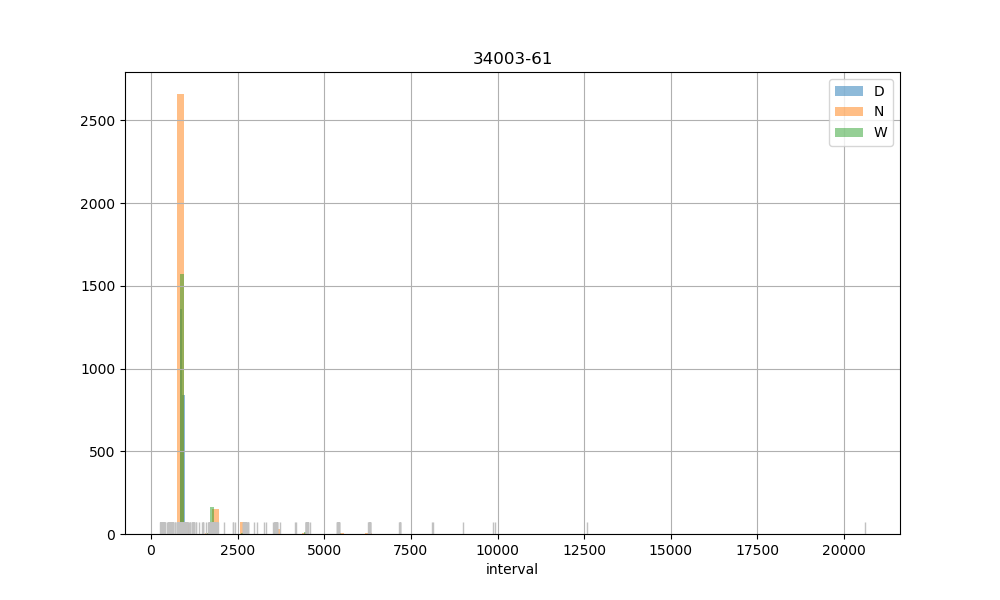

D count    2479.00
mean      952.66
std       382.64
min       281.00
25%       889.00
50%       900.00
75%       911.00
max      7194.00
Name: interval, dtype: object
N count     3012.00
mean      1072.14
std        761.10
min        561.00
25%        892.00
50%        901.00
75%        915.00
max      20597.00
Name: interval, dtype: object
W count    1983.00
mean     1132.30
std       695.31
min       268.00
25%       891.00
50%       904.00
75%       921.00
max      9929.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count    2479.00
mean      952.66
std       382.64
min       281.00
25%       889.00
50%       900.00
75%       911.00
max      7194.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count     3012.00
mean      1072.14
std        761.10
min        561.00
25%        892.00
50%        901.00
75%        915.00
max      20597.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


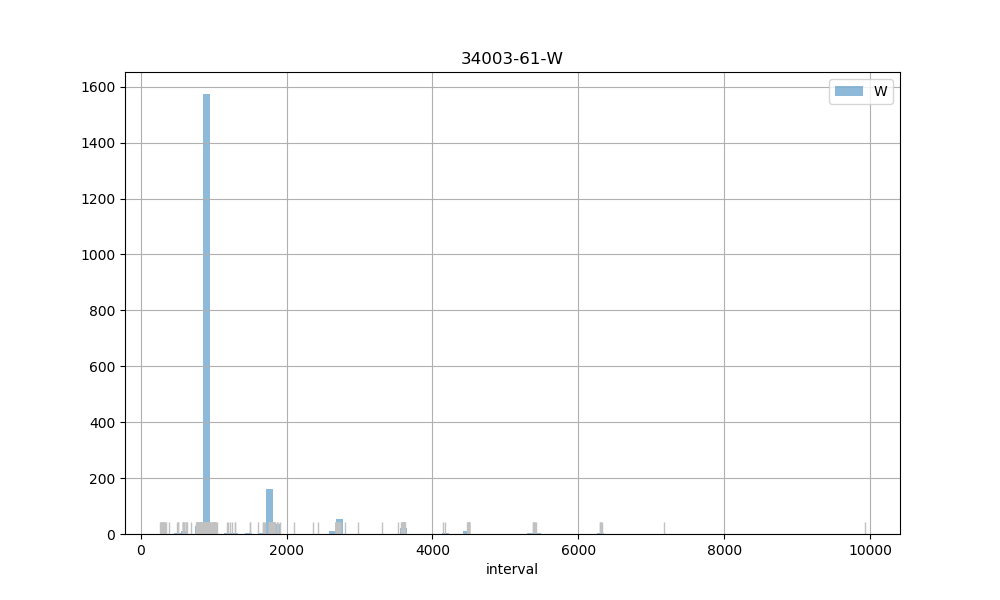

W count    1983.00
mean     1132.30
std       695.31
min       268.00
25%       891.00
50%       904.00
75%       921.00
max      9929.00
Name: interval, dtype: object
34003-63


<IPython.core.display.Javascript object>


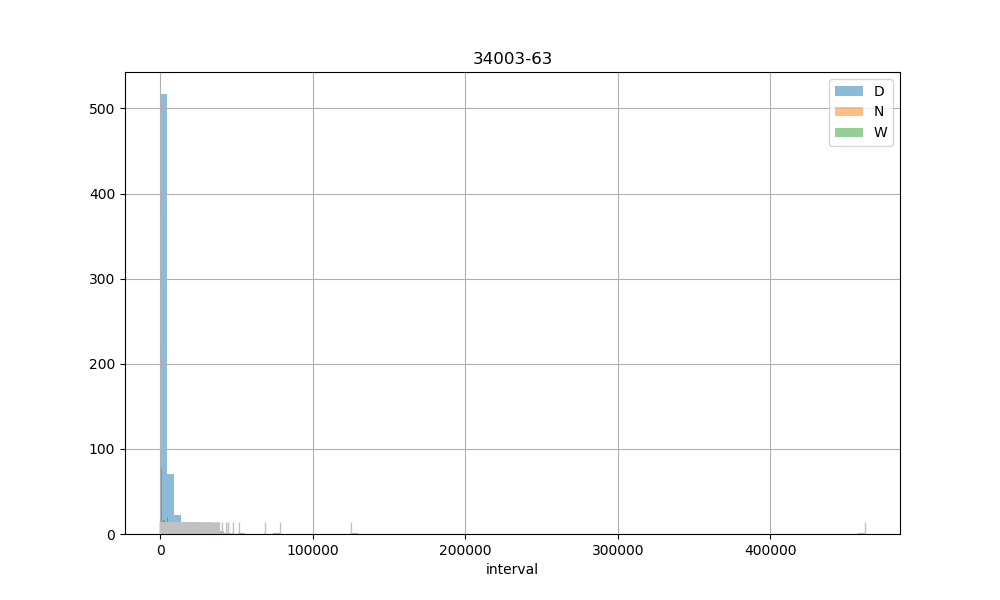

D count       659.00
mean       5327.69
std       19998.79
min           2.00
25%         900.00
50%        1768.00
75%        3650.50
max      461924.00
Name: interval, dtype: object
N count      362.00
mean      6174.73
std       6892.37
min        173.00
25%        903.25
50%       3584.50
75%       8739.75
max      33691.00
Name: interval, dtype: object
W count      255.00
mean      8178.84
std      10098.57
min        320.00
25%        917.50
50%       4028.00
75%      12612.50
max      68916.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


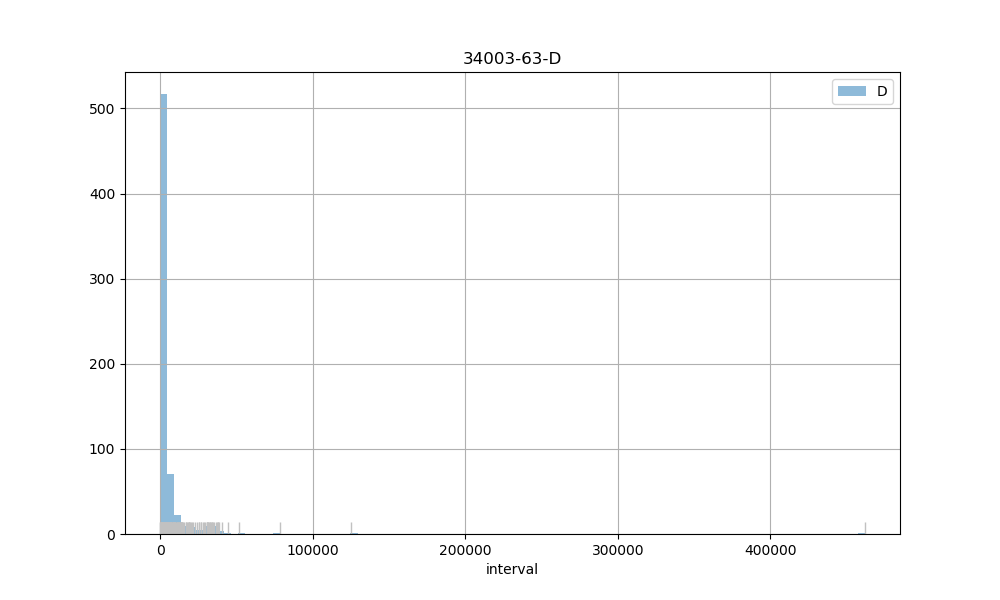

D count       659.00
mean       5327.69
std       19998.79
min           2.00
25%         900.00
50%        1768.00
75%        3650.50
max      461924.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count      362.00
mean      6174.73
std       6892.37
min        173.00
25%        903.25
50%       3584.50
75%       8739.75
max      33691.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


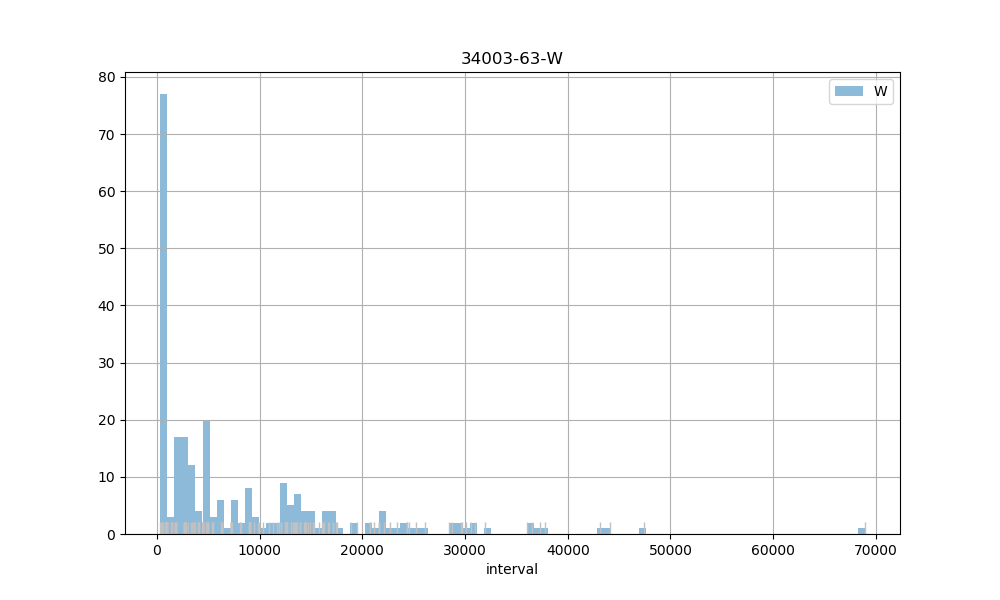

W count      255.00
mean      8178.84
std      10098.57
min        320.00
25%        917.50
50%       4028.00
75%      12612.50
max      68916.00
Name: interval, dtype: object
34003-64


<IPython.core.display.Javascript object>


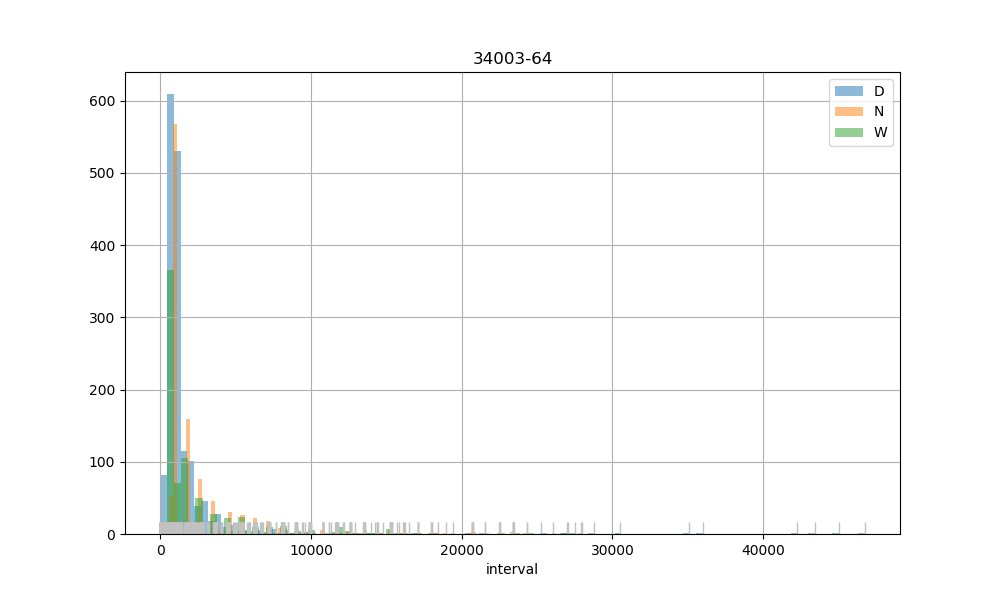

D count     1644.00
mean      1598.52
std       2864.04
min          2.00
25%        873.00
50%        913.00
75%       1706.00
max      45010.00
Name: interval, dtype: object
N count     1111.00
mean      2679.11
std       3727.28
min          0.00
25%        887.00
50%        943.00
75%       2706.00
max      27972.00
Name: interval, dtype: object
W count      796.00
mean      2803.86
std       4232.61
min          0.00
25%        888.00
50%        942.00
75%       2708.25
max      46753.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


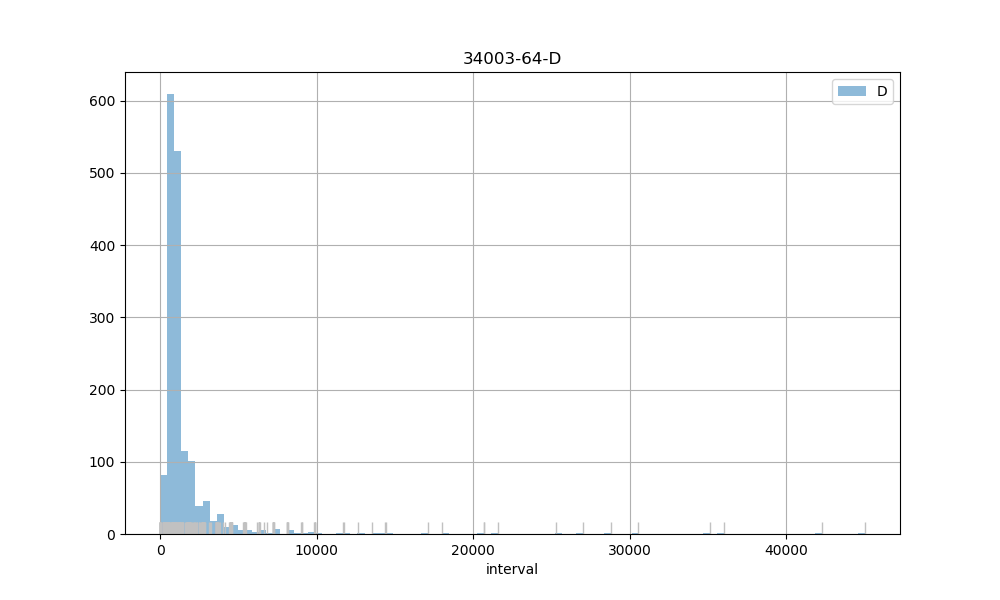

D count     1644.00
mean      1598.52
std       2864.04
min          2.00
25%        873.00
50%        913.00
75%       1706.00
max      45010.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


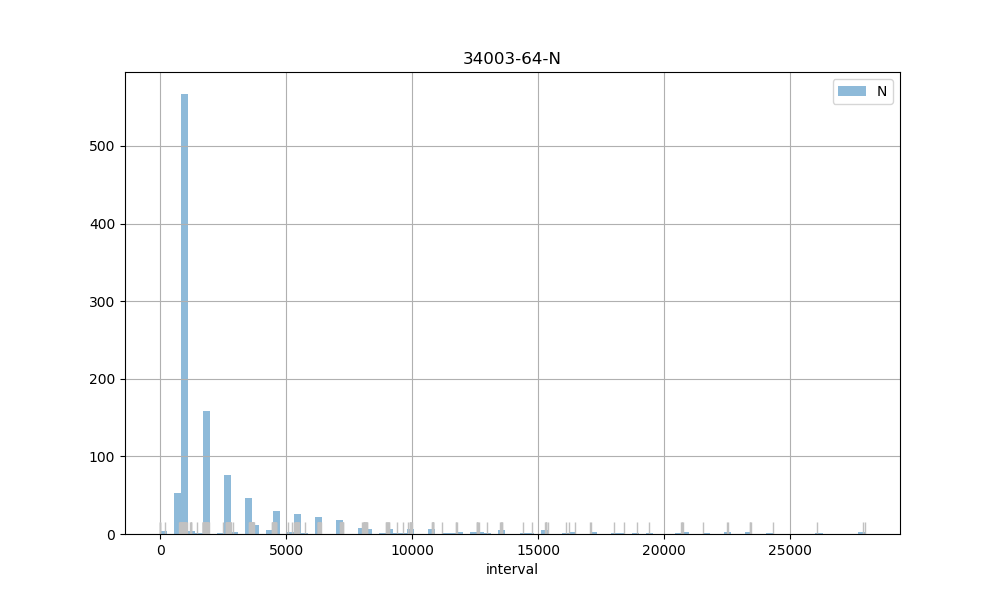

N count     1111.00
mean      2679.11
std       3727.28
min          0.00
25%        887.00
50%        943.00
75%       2706.00
max      27972.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count      796.00
mean      2803.86
std       4232.61
min          0.00
25%        888.00
50%        942.00
75%       2708.25
max      46753.00
Name: interval, dtype: object
34003-66


<IPython.core.display.Javascript object>


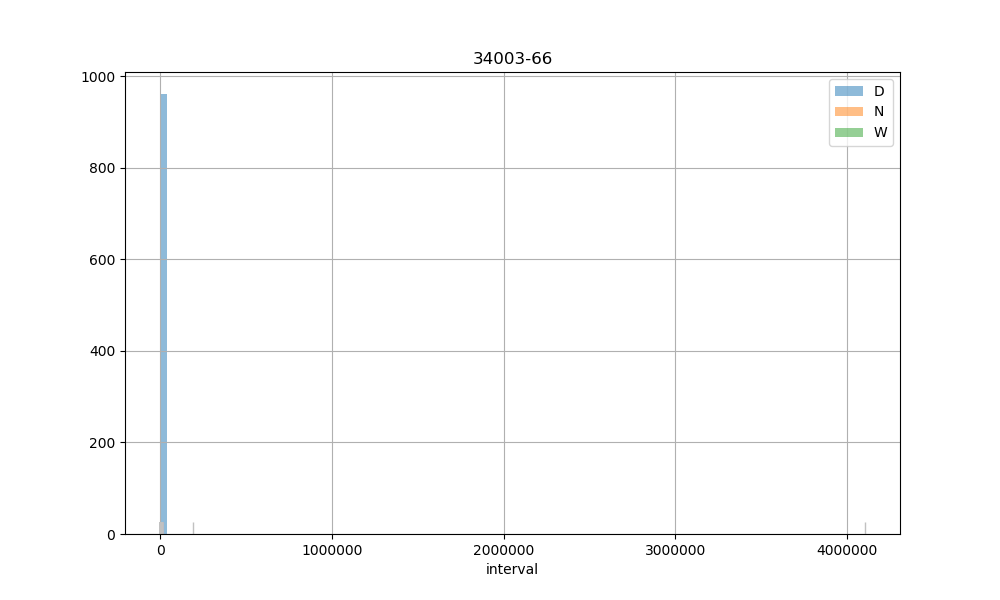

D count        963.00
mean        5539.18
std       132311.46
min            2.00
25%          877.00
50%          905.00
75%          937.00
max      4102728.00
Name: interval, dtype: object
N count     1174.00
mean      1238.03
std       1143.18
min        167.00
25%        882.00
50%        906.00
75%        938.00
max      12473.00
Name: interval, dtype: object
W count     755.00
mean     1386.57
std      1111.60
min       165.00
25%       886.50
50%       912.00
75%      1759.50
max      9764.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


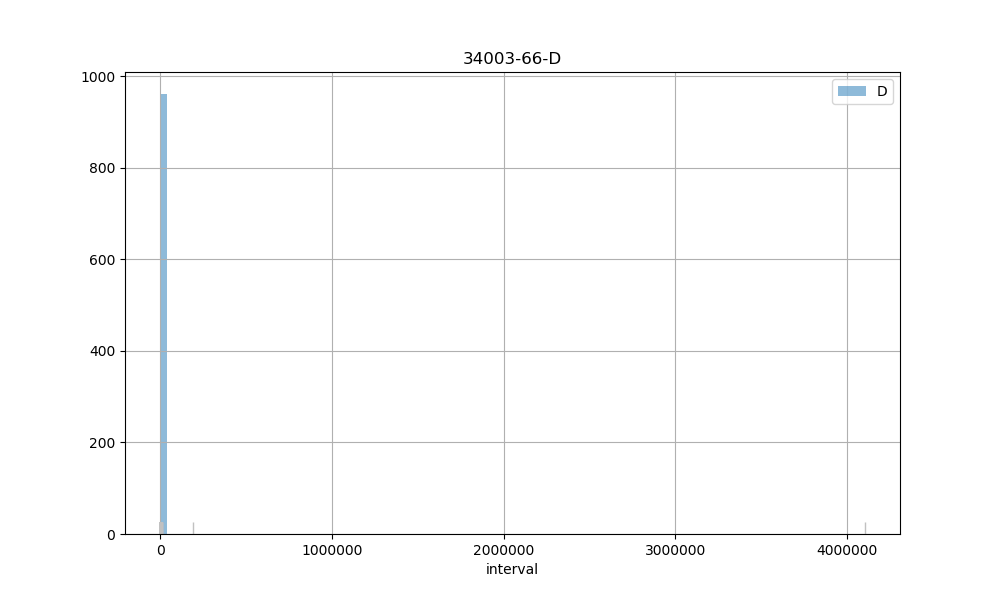

D count        963.00
mean        5539.18
std       132311.46
min            2.00
25%          877.00
50%          905.00
75%          937.00
max      4102728.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count     1174.00
mean      1238.03
std       1143.18
min        167.00
25%        882.00
50%        906.00
75%        938.00
max      12473.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count     755.00
mean     1386.57
std      1111.60
min       165.00
25%       886.50
50%       912.00
75%      1759.50
max      9764.00
Name: interval, dtype: object
34003-1


<IPython.core.display.Javascript object>


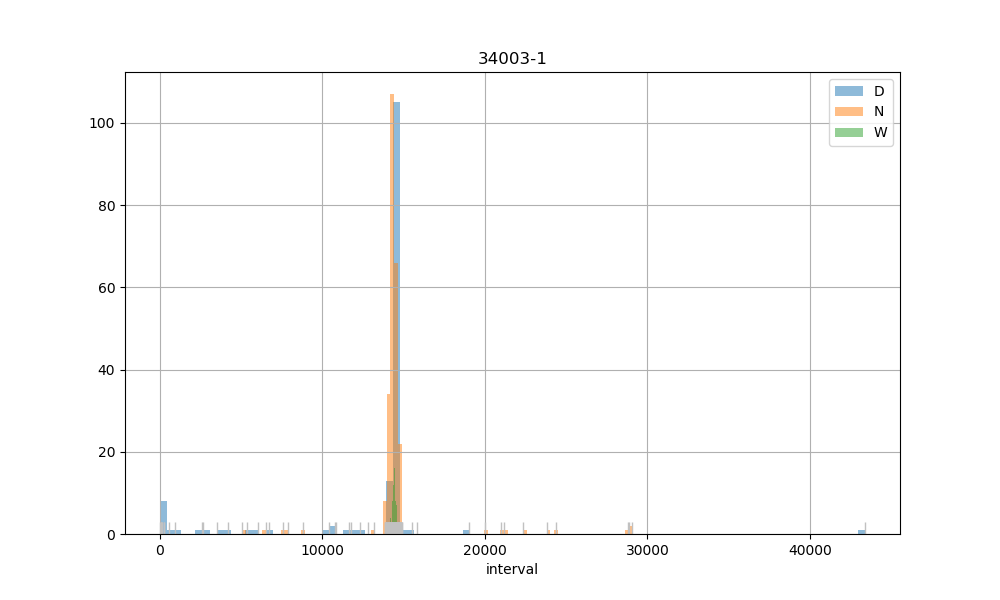

D count      145.00
mean     13091.17
std       4855.49
min         14.00
25%      14330.00
50%      14433.00
75%      14498.00
max      43386.00
Name: interval, dtype: object
N count      252.00
mean     14586.87
std       2257.30
min       5056.00
25%      14278.50
50%      14385.00
75%      14510.75
max      29080.00
Name: interval, dtype: object
W count      156.00
mean     14386.81
std        226.24
min      12805.00
25%      14307.25
50%      14392.00
75%      14464.75
max      15823.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


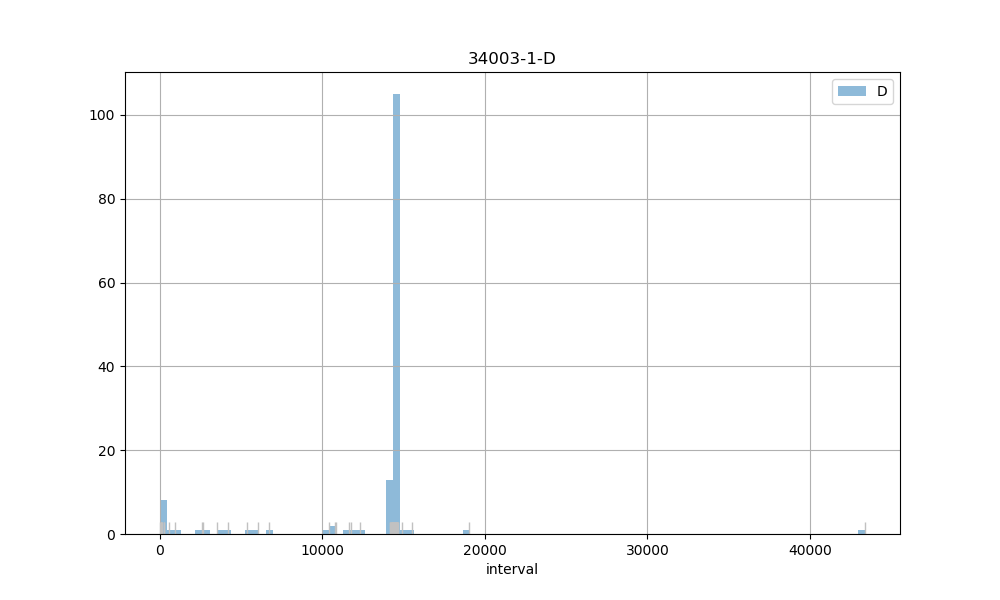

D count      145.00
mean     13091.17
std       4855.49
min         14.00
25%      14330.00
50%      14433.00
75%      14498.00
max      43386.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count      252.00
mean     14586.87
std       2257.30
min       5056.00
25%      14278.50
50%      14385.00
75%      14510.75
max      29080.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


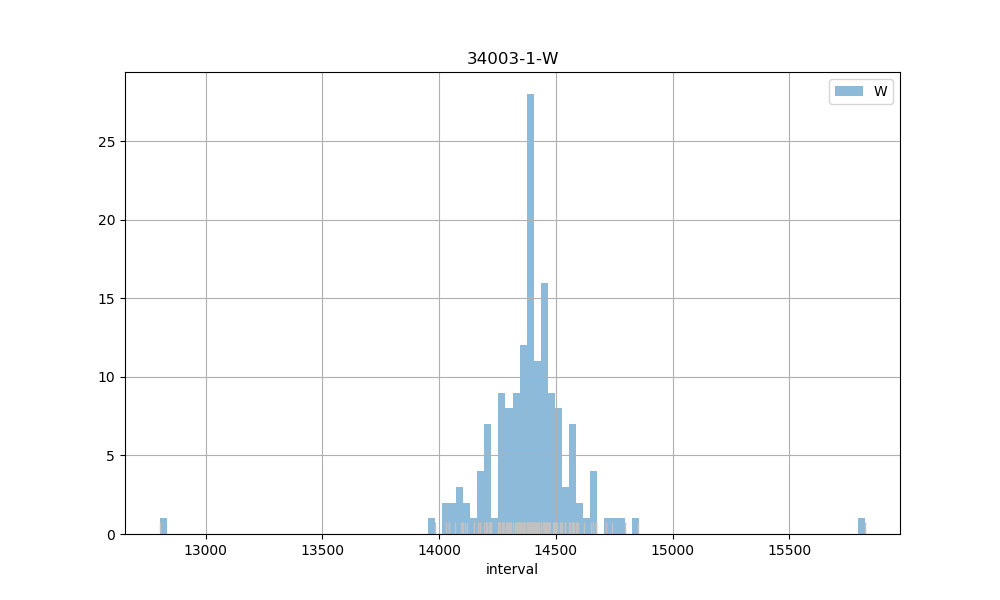

W count      156.00
mean     14386.81
std        226.24
min      12805.00
25%      14307.25
50%      14392.00
75%      14464.75
max      15823.00
Name: interval, dtype: object
34003-68


<IPython.core.display.Javascript object>


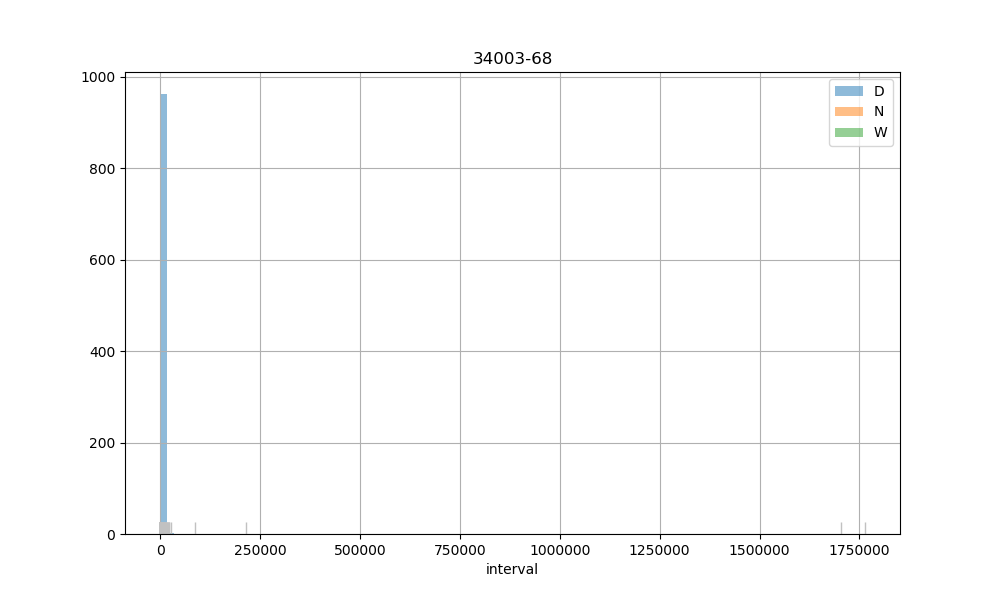

D count        968.00
mean        5255.53
std        79072.61
min            2.00
25%          887.00
50%          907.00
75%          958.25
max      1763465.00
Name: interval, dtype: object
N count     1063.00
mean      1582.04
std       1863.79
min        188.00
25%        890.00
50%        910.00
75%       1769.00
max      22488.00
Name: interval, dtype: object
W count      673.00
mean      1585.74
std       1784.79
min          3.00
25%        890.00
50%        911.00
75%       1786.00
max      27919.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count        968.00
mean        5255.53
std        79072.61
min            2.00
25%          887.00
50%          907.00
75%          958.25
max      1763465.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


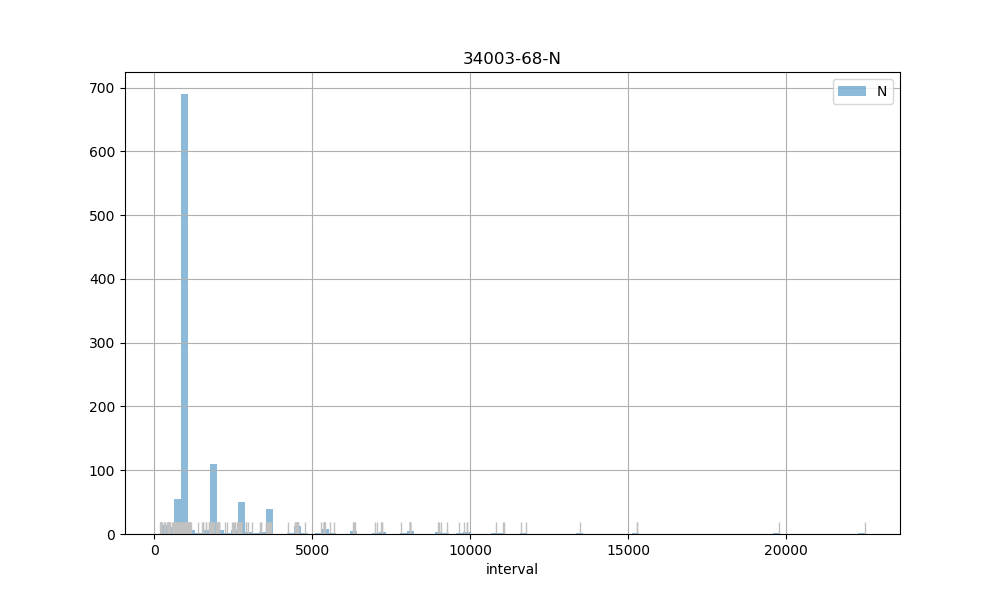

N count     1063.00
mean      1582.04
std       1863.79
min        188.00
25%        890.00
50%        910.00
75%       1769.00
max      22488.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count      673.00
mean      1585.74
std       1784.79
min          3.00
25%        890.00
50%        911.00
75%       1786.00
max      27919.00
Name: interval, dtype: object
34003-69


<IPython.core.display.Javascript object>


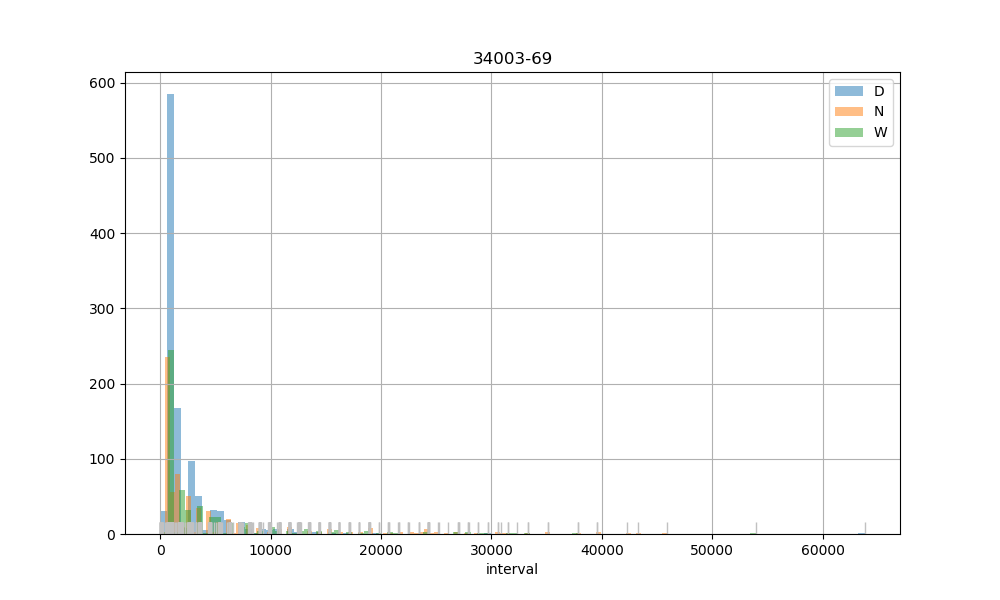

D count     1083.00
mean      2223.18
std       3125.76
min          2.00
25%        894.50
50%        948.00
75%       2674.50
max      63827.00
Name: interval, dtype: object
N count      669.00
mean      4765.88
std       7122.82
min          2.00
25%        900.00
50%       1800.00
75%       4629.00
max      45893.00
Name: interval, dtype: object
W count      531.00
mean      4195.11
std       6054.42
min        131.00
25%        902.00
50%       1795.00
75%       4544.00
max      53966.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count     1083.00
mean      2223.18
std       3125.76
min          2.00
25%        894.50
50%        948.00
75%       2674.50
max      63827.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


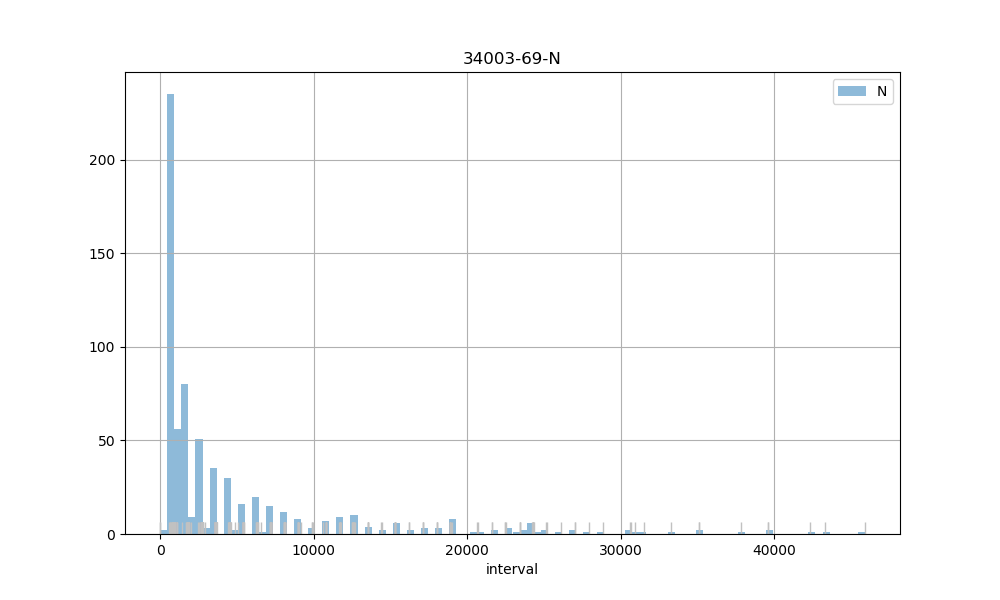

N count      669.00
mean      4765.88
std       7122.82
min          2.00
25%        900.00
50%       1800.00
75%       4629.00
max      45893.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


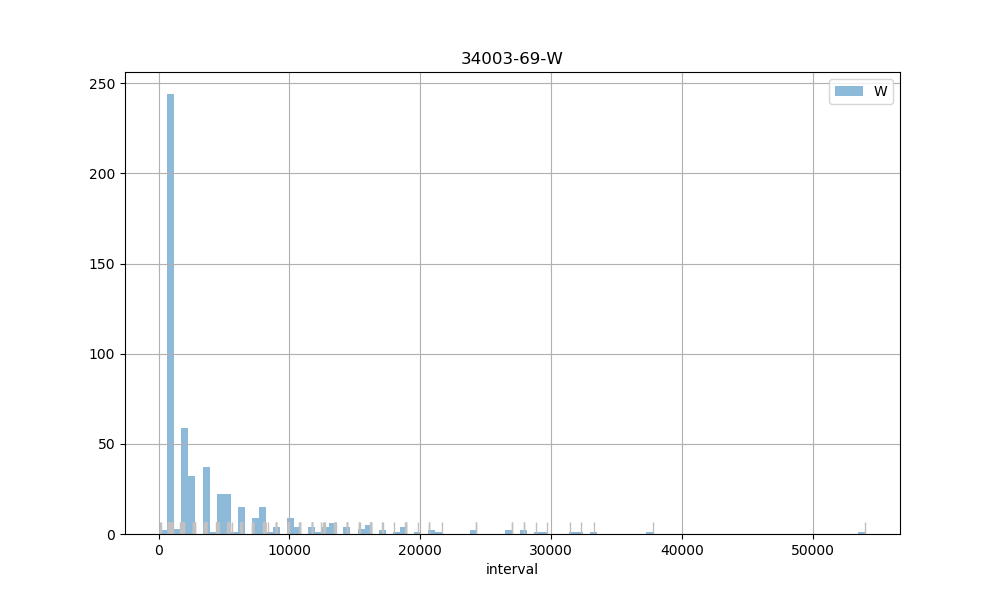

W count      531.00
mean      4195.11
std       6054.42
min        131.00
25%        902.00
50%       1795.00
75%       4544.00
max      53966.00
Name: interval, dtype: object
34003-70


<IPython.core.display.Javascript object>

D count        276.00
mean       18381.36
std       119984.09
min            6.00
25%          907.75
50%         2682.00
75%         7986.75
max      1814751.00
Name: interval, dtype: object
N count       181.00
mean       7852.83
std       14881.49
min         389.00
25%         906.00
50%        2680.00
75%        8098.00
max      120376.00
Name: interval, dtype: object
W count       94.00
mean     14033.39
std      17831.19
min        202.00
25%        946.00
50%       5433.50
75%      21458.25
max      68575.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


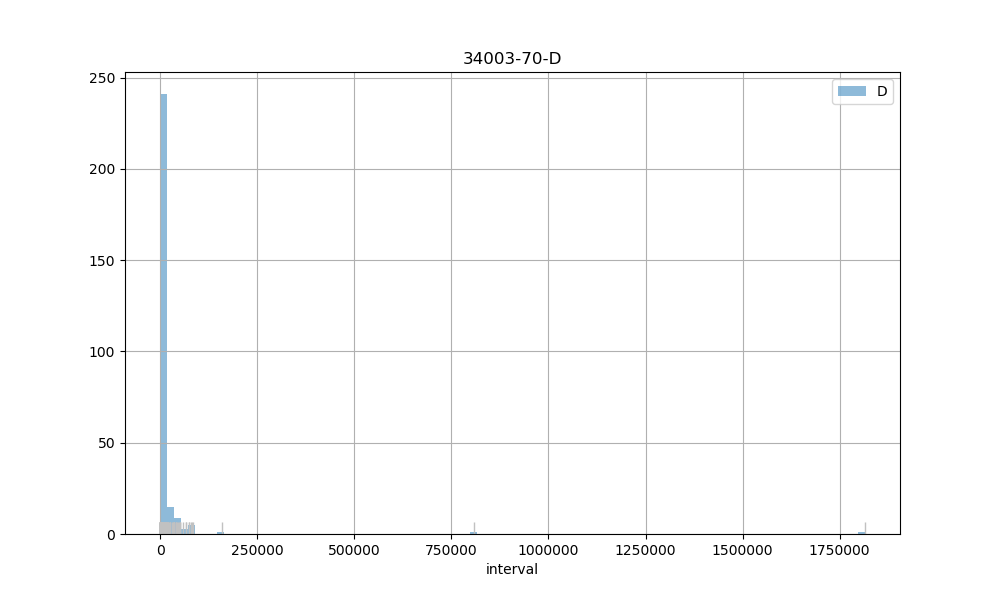

D count        276.00
mean       18381.36
std       119984.09
min            6.00
25%          907.75
50%         2682.00
75%         7986.75
max      1814751.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count       181.00
mean       7852.83
std       14881.49
min         389.00
25%         906.00
50%        2680.00
75%        8098.00
max      120376.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count       94.00
mean     14033.39
std      17831.19
min        202.00
25%        946.00
50%       5433.50
75%      21458.25
max      68575.00
Name: interval, dtype: object
34003-71


<IPython.core.display.Javascript object>


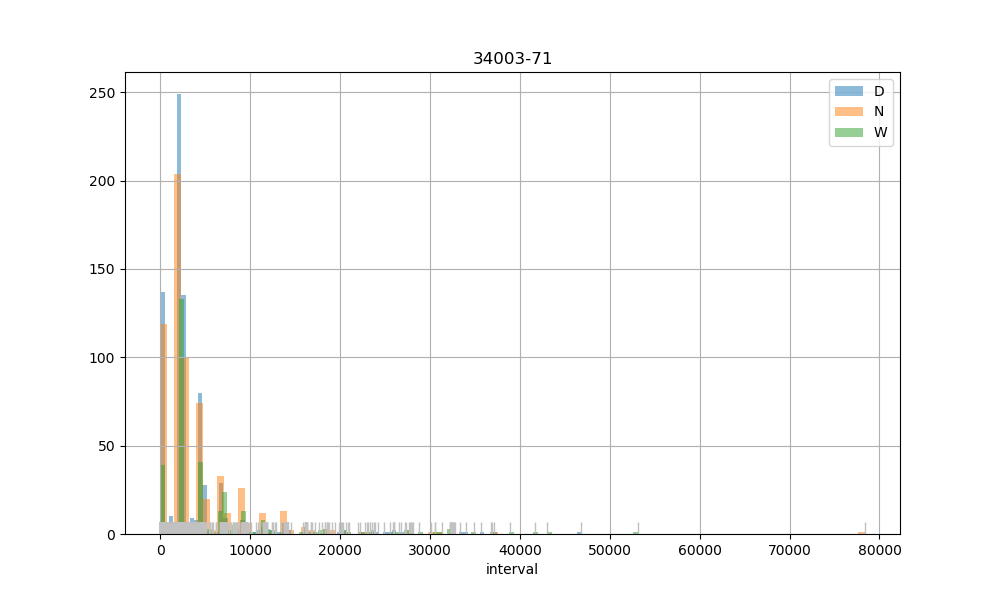

D count      779.00
mean      3674.73
std       5034.82
min          6.00
25%       2193.00
50%       2327.00
75%       4554.00
max      46828.00
Name: interval, dtype: object
N count      647.00
mean      4203.51
std       5685.83
min          4.00
25%       2225.00
50%       2356.00
75%       4674.00
max      78365.00
Name: interval, dtype: object
W count      356.00
mean      6314.66
std       7994.24
min         -8.00
25%       2285.50
50%       2436.50
75%       7005.50
max      53138.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


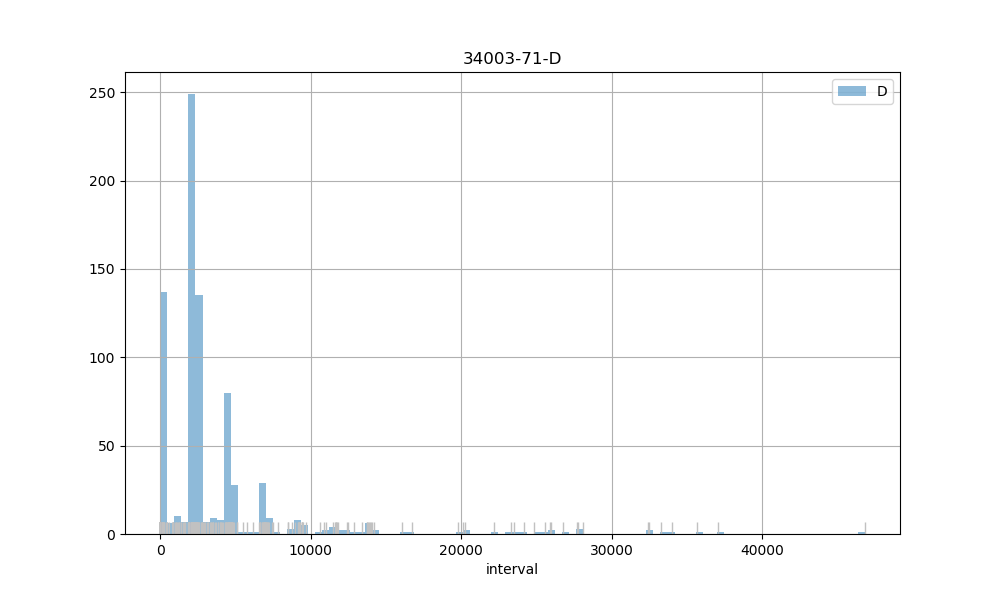

D count      779.00
mean      3674.73
std       5034.82
min          6.00
25%       2193.00
50%       2327.00
75%       4554.00
max      46828.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count      647.00
mean      4203.51
std       5685.83
min          4.00
25%       2225.00
50%       2356.00
75%       4674.00
max      78365.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


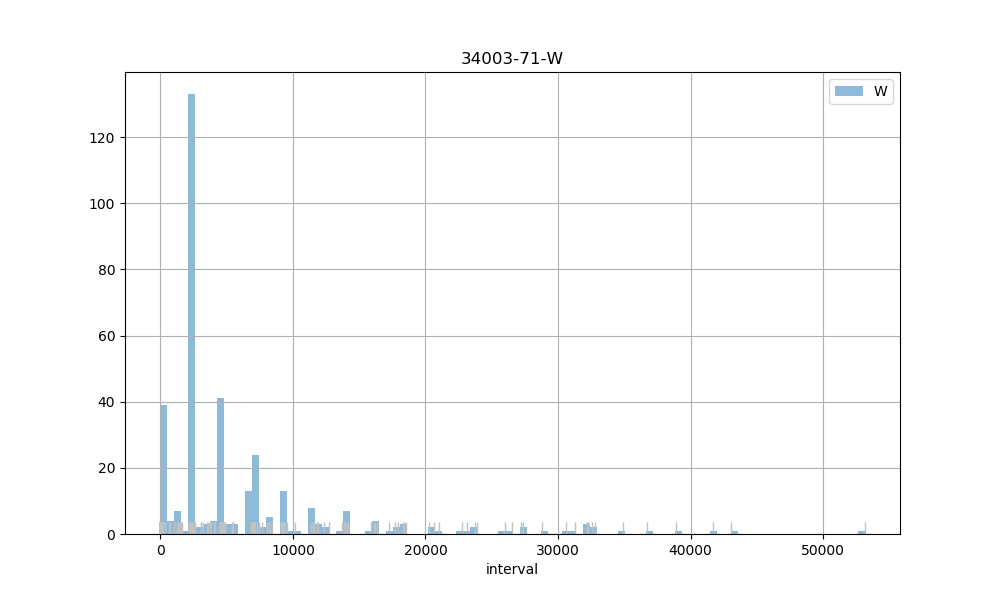

W count      356.00
mean      6314.66
std       7994.24
min         -8.00
25%       2285.50
50%       2436.50
75%       7005.50
max      53138.00
Name: interval, dtype: object
34003-74


<IPython.core.display.Javascript object>

D count      757.00
mean      4410.67
std       8162.85
min          2.00
25%        900.00
50%       1775.00
75%       3651.00
max      76107.00
Name: interval, dtype: object
N count      488.00
mean      4661.61
std       6947.10
min        153.00
25%        893.00
50%       1707.50
75%       4585.00
max      42325.00
Name: interval, dtype: object
W count      329.00
mean      6636.83
std       9230.51
min        181.00
25%        904.00
50%       2705.00
75%       8105.00
max      60307.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count      757.00
mean      4410.67
std       8162.85
min          2.00
25%        900.00
50%       1775.00
75%       3651.00
max      76107.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


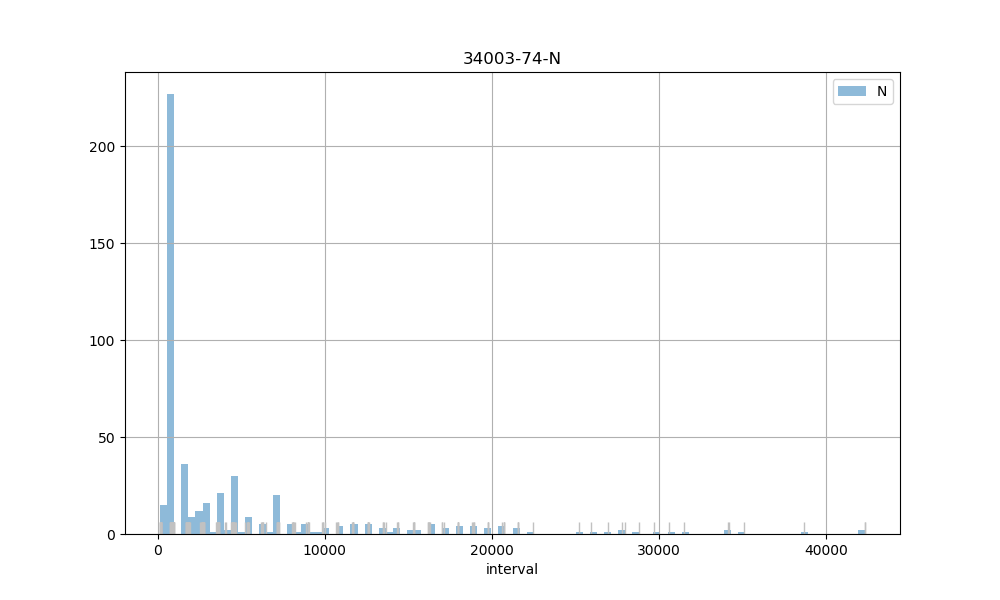

N count      488.00
mean      4661.61
std       6947.10
min        153.00
25%        893.00
50%       1707.50
75%       4585.00
max      42325.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


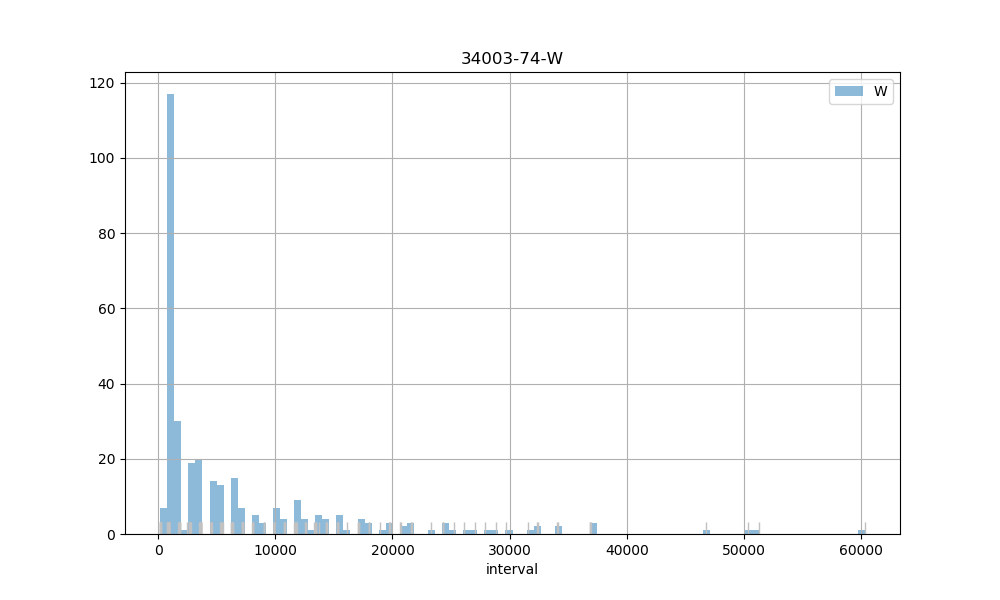

W count      329.00
mean      6636.83
std       9230.51
min        181.00
25%        904.00
50%       2705.00
75%       8105.00
max      60307.00
Name: interval, dtype: object
34003-75


<IPython.core.display.Javascript object>

D count     2477.00
mean       946.86
std        538.07
min          2.00
25%        875.00
50%        900.00
75%        927.00
max      15307.00
Name: interval, dtype: object
N count     2273.00
mean      1431.38
std       1593.74
min         -3.00
25%        891.00
50%        908.00
75%        956.00
max      18884.00
Name: interval, dtype: object
W count     1602.00
mean      1396.62
std       1414.83
min         11.00
25%        888.00
50%        909.00
75%       1400.25
max      23382.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count     2477.00
mean       946.86
std        538.07
min          2.00
25%        875.00
50%        900.00
75%        927.00
max      15307.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count     2273.00
mean      1431.38
std       1593.74
min         -3.00
25%        891.00
50%        908.00
75%        956.00
max      18884.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count     1602.00
mean      1396.62
std       1414.83
min         11.00
25%        888.00
50%        909.00
75%       1400.25
max      23382.00
Name: interval, dtype: object
34003-76


<IPython.core.display.Javascript object>


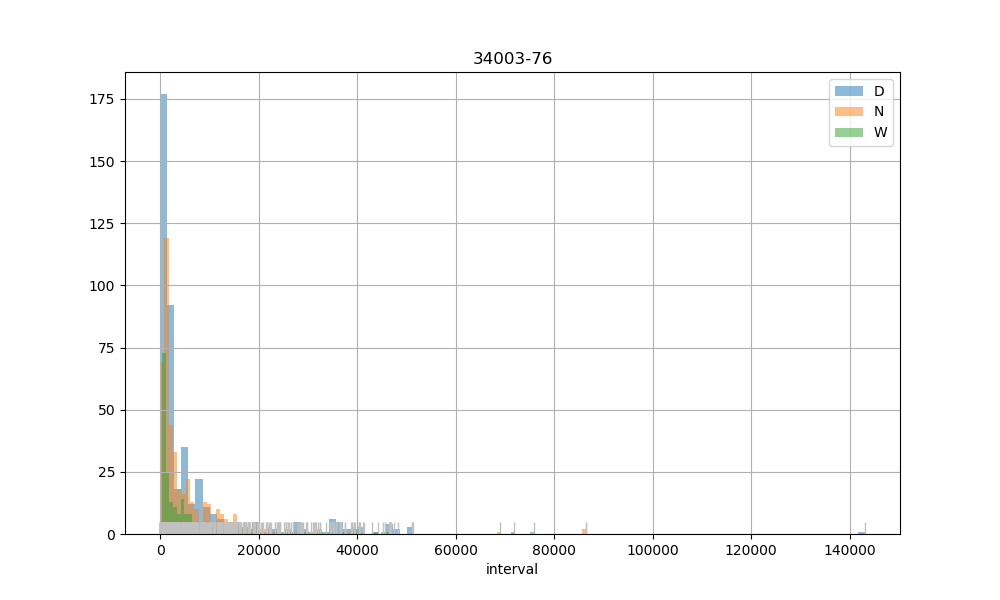

D count       442.00
mean       6951.76
std       12498.00
min           2.00
25%         909.00
50%        1859.50
75%        6888.00
max      143061.00
Name: interval, dtype: object
N count      451.00
mean      5722.81
std       9021.84
min          0.00
25%        909.00
50%       2103.00
75%       7204.00
max      86519.00
Name: interval, dtype: object
W count      251.00
mean      8673.18
std      11827.76
min        355.00
25%        954.50
50%       3580.00
75%      11748.00
max      75842.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count       442.00
mean       6951.76
std       12498.00
min           2.00
25%         909.00
50%        1859.50
75%        6888.00
max      143061.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


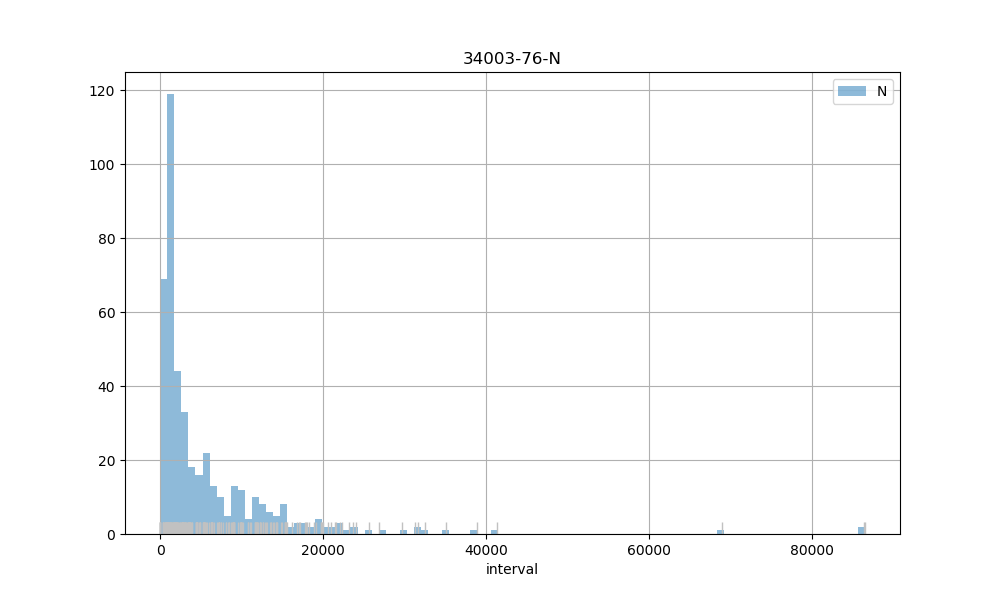

N count      451.00
mean      5722.81
std       9021.84
min          0.00
25%        909.00
50%       2103.00
75%       7204.00
max      86519.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count      251.00
mean      8673.18
std      11827.76
min        355.00
25%        954.50
50%       3580.00
75%      11748.00
max      75842.00
Name: interval, dtype: object
34003-77


<IPython.core.display.Javascript object>

D count     1144.00
mean      2171.05
std       2514.98
min          3.00
25%        890.00
50%       1393.50
75%       2702.25
max      43723.00
Name: interval, dtype: object
N count      969.00
mean      3250.75
std       4090.29
min        524.00
25%        908.00
50%       1812.00
75%       3596.00
max      31516.00
Name: interval, dtype: object
W count      540.00
mean      4075.50
std       4422.28
min        315.00
25%        955.00
50%       2675.50
75%       5370.25
max      33361.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


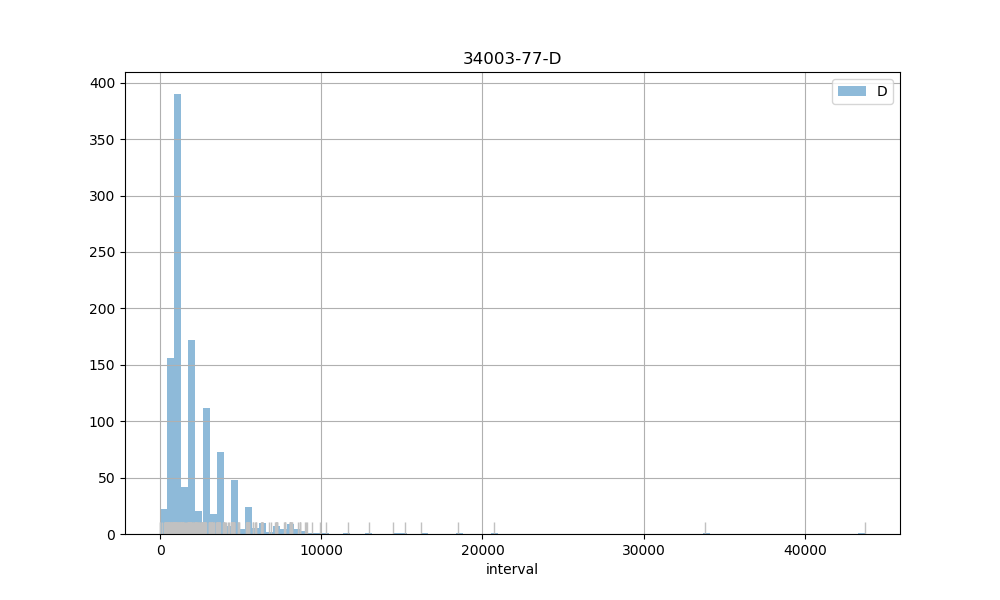

D count     1144.00
mean      2171.05
std       2514.98
min          3.00
25%        890.00
50%       1393.50
75%       2702.25
max      43723.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count      969.00
mean      3250.75
std       4090.29
min        524.00
25%        908.00
50%       1812.00
75%       3596.00
max      31516.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


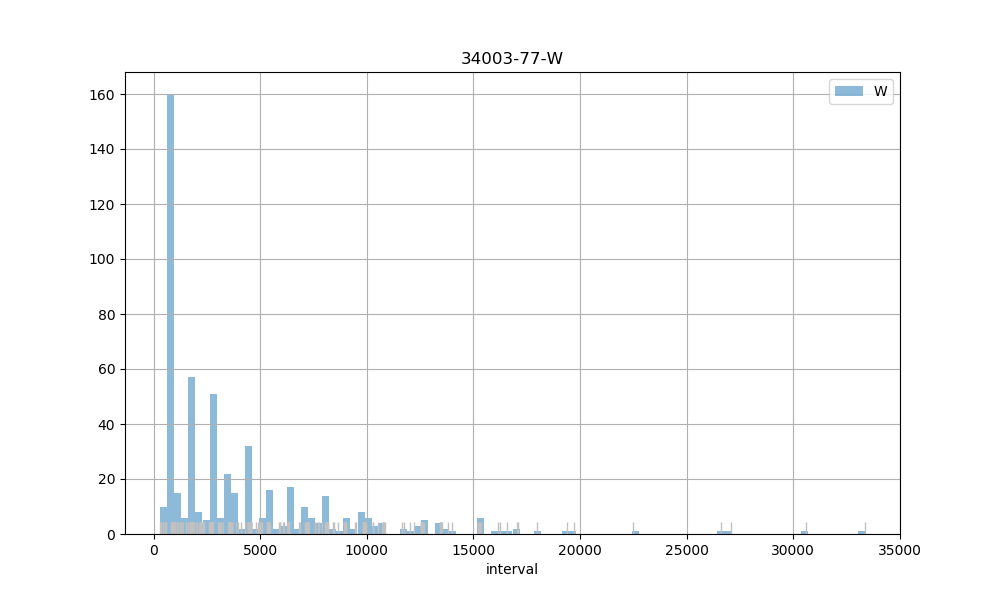

W count      540.00
mean      4075.50
std       4422.28
min        315.00
25%        955.00
50%       2675.50
75%       5370.25
max      33361.00
Name: interval, dtype: object
34003-78


<IPython.core.display.Javascript object>


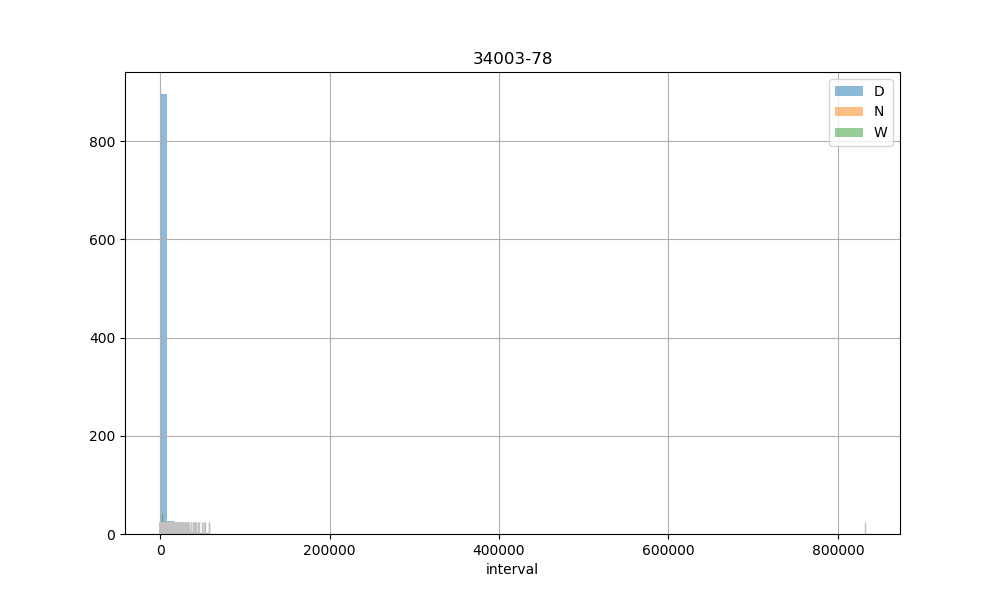

D count       956.00
mean       3827.61
std       27471.44
min           2.00
25%         884.00
50%         945.00
75%        2642.50
max      831761.00
Name: interval, dtype: object
N count      552.00
mean      3790.04
std       5857.53
min          0.00
25%        899.00
50%       1161.50
75%       3660.00
max      44097.00
Name: interval, dtype: object
W count      424.00
mean      4854.75
std       8123.17
min          0.00
25%        898.00
50%       1798.00
75%       4564.50
max      57556.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count       956.00
mean       3827.61
std       27471.44
min           2.00
25%         884.00
50%         945.00
75%        2642.50
max      831761.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


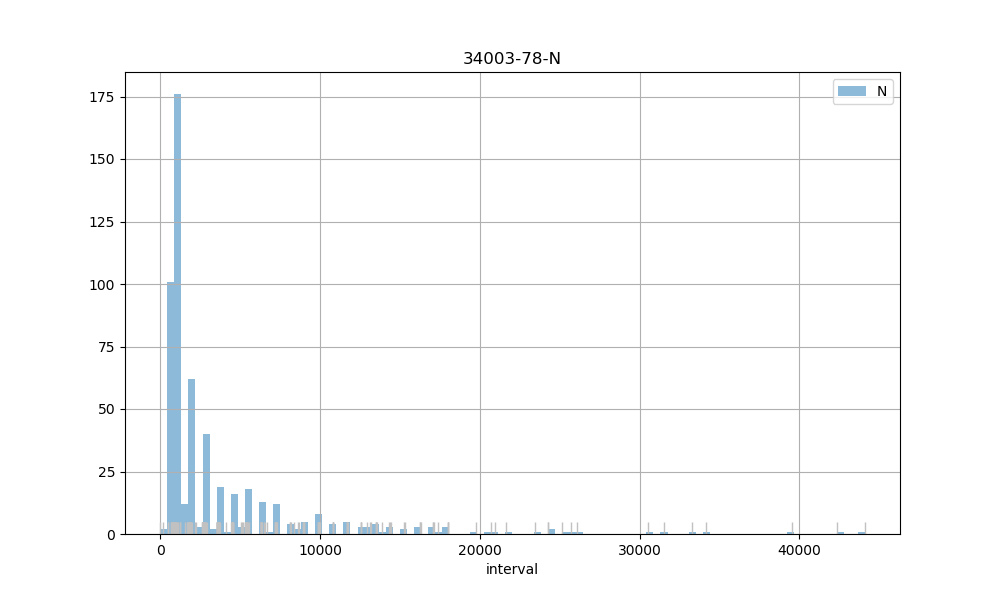

N count      552.00
mean      3790.04
std       5857.53
min          0.00
25%        899.00
50%       1161.50
75%       3660.00
max      44097.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


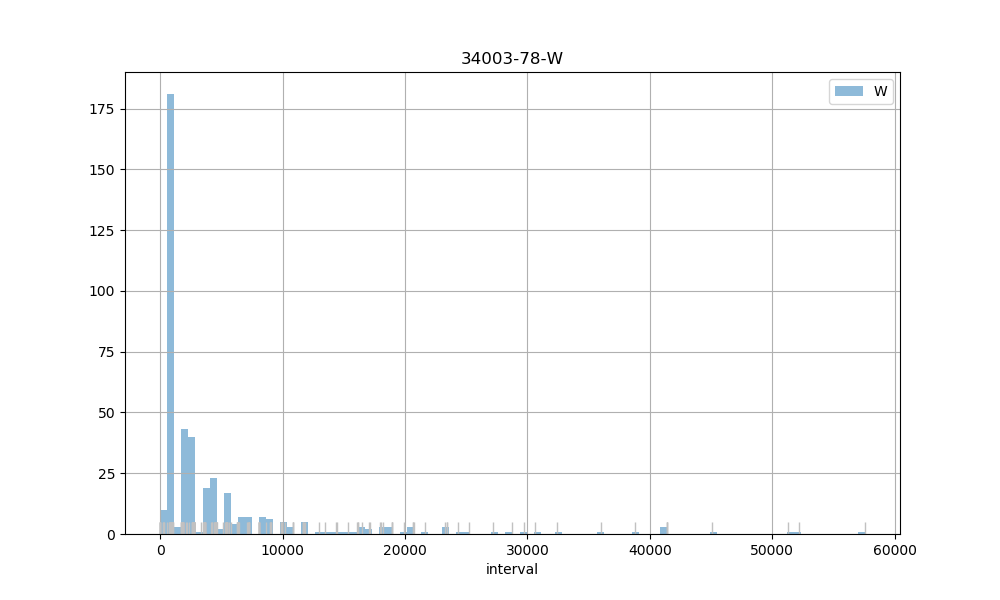

W count      424.00
mean      4854.75
std       8123.17
min          0.00
25%        898.00
50%       1798.00
75%       4564.50
max      57556.00
Name: interval, dtype: object
34003-79


<IPython.core.display.Javascript object>

D count     1616.00
mean      1535.12
std       2104.75
min          2.00
25%        889.00
50%        913.00
75%       1761.00
max      33059.00
Name: interval, dtype: object
N count     1446.00
mean      2145.89
std       2661.01
min          2.00
25%        893.00
50%        917.00
75%       2575.00
max      28483.00
Name: interval, dtype: object
W count      796.00
mean      2815.21
std       4010.67
min         31.00
25%        896.75
50%        946.00
75%       3080.75
max      44676.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count     1616.00
mean      1535.12
std       2104.75
min          2.00
25%        889.00
50%        913.00
75%       1761.00
max      33059.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


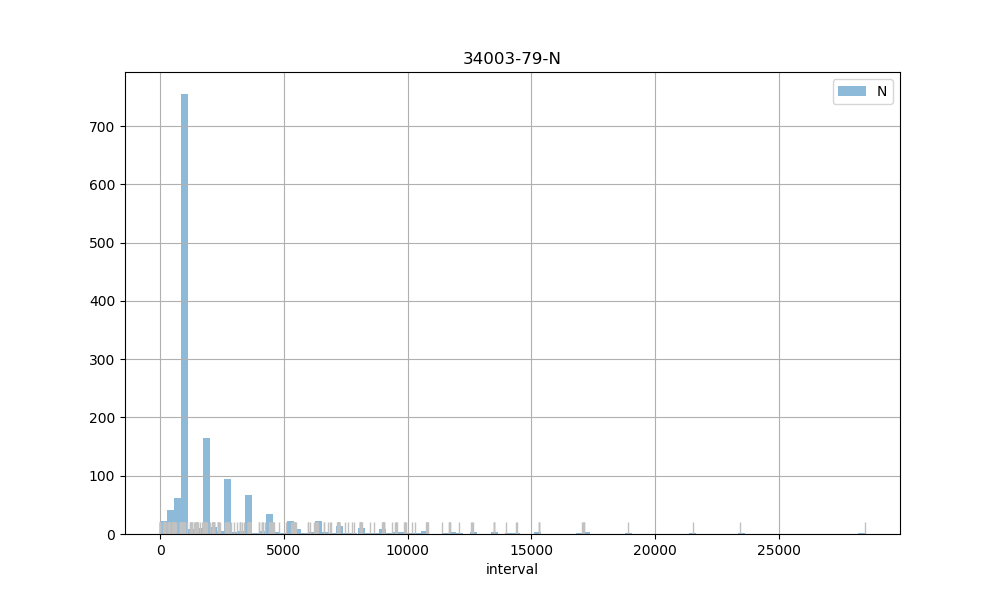

N count     1446.00
mean      2145.89
std       2661.01
min          2.00
25%        893.00
50%        917.00
75%       2575.00
max      28483.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


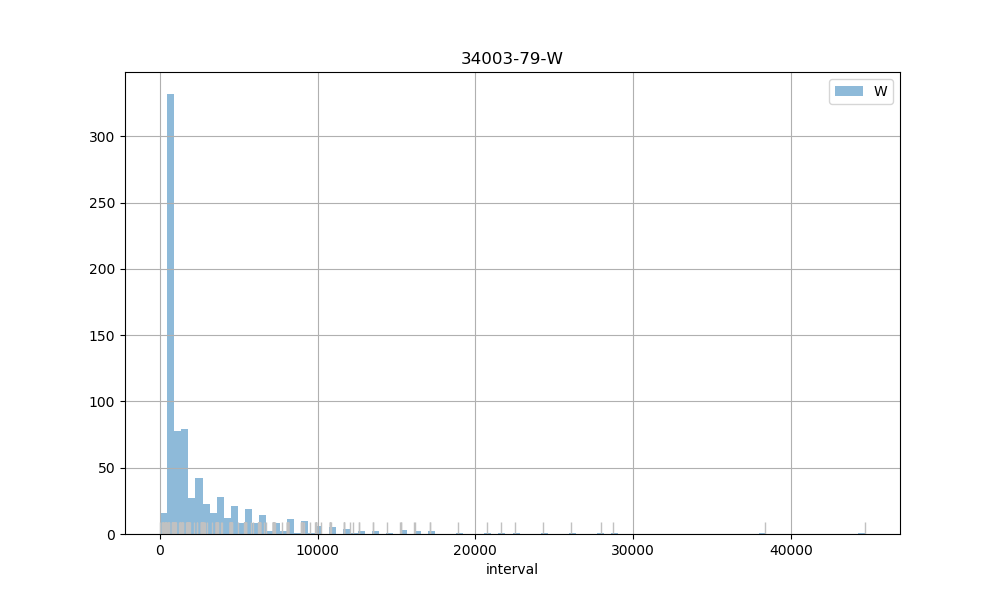

W count      796.00
mean      2815.21
std       4010.67
min         31.00
25%        896.75
50%        946.00
75%       3080.75
max      44676.00
Name: interval, dtype: object
34003-80


<IPython.core.display.Javascript object>

D count     1305.00
mean      1988.87
std       2867.84
min          8.00
25%        812.00
50%       1208.00
75%       2398.00
max      51603.00
Name: interval, dtype: object
N count      962.00
mean      3104.64
std       4241.83
min         51.00
25%        809.25
50%       1441.50
75%       3595.50
max      40065.00
Name: interval, dtype: object
W count      682.00
mean      3299.54
std       3694.57
min         72.00
25%        899.75
50%       2378.50
75%       4408.00
max      26398.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


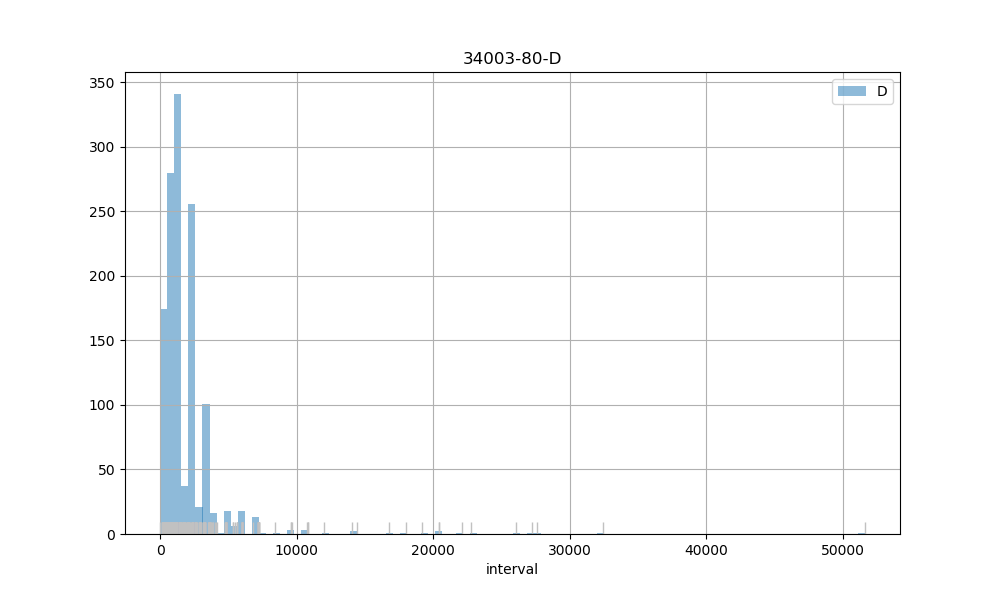

D count     1305.00
mean      1988.87
std       2867.84
min          8.00
25%        812.00
50%       1208.00
75%       2398.00
max      51603.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


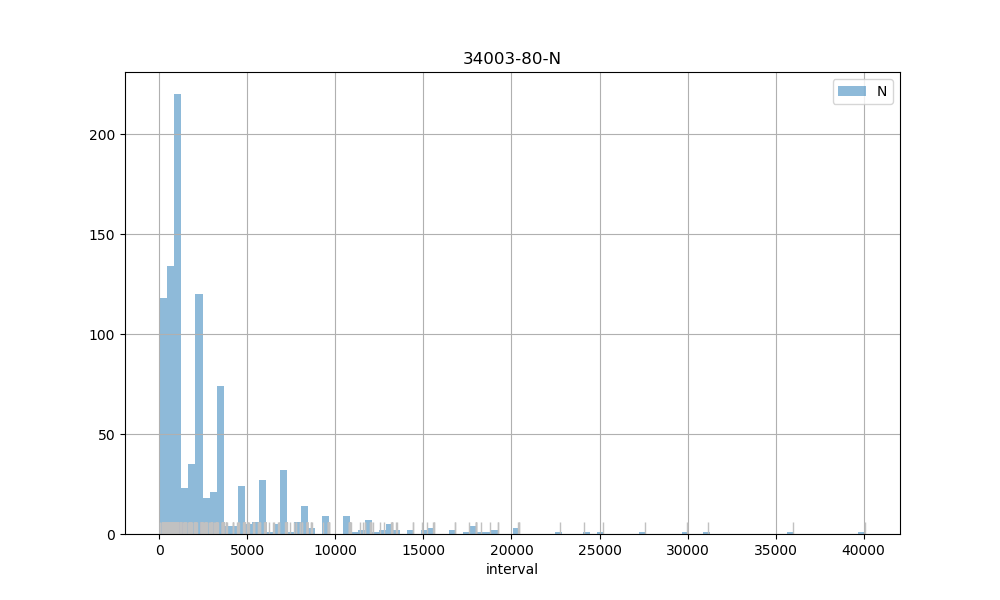

N count      962.00
mean      3104.64
std       4241.83
min         51.00
25%        809.25
50%       1441.50
75%       3595.50
max      40065.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


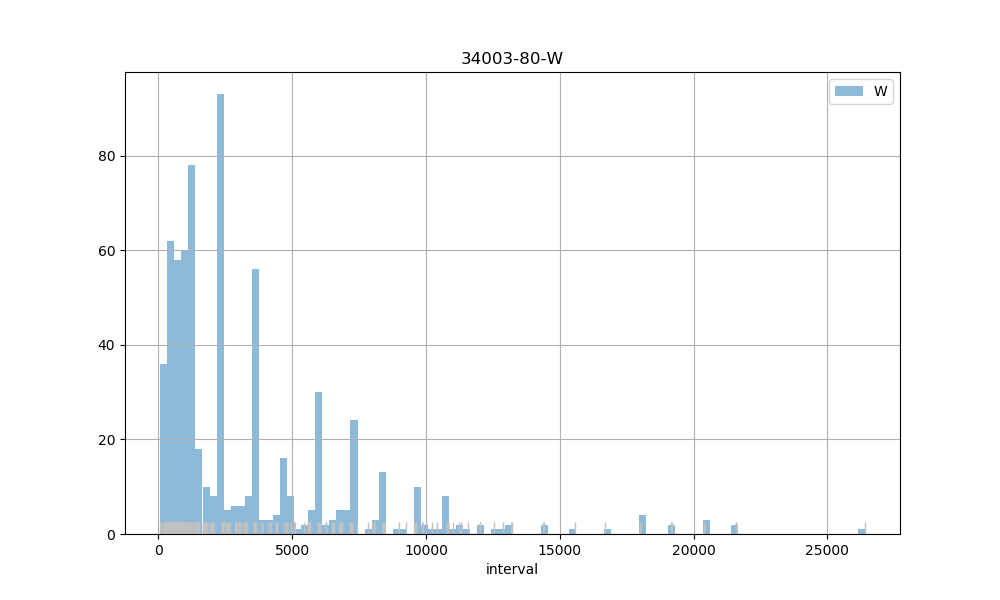

W count      682.00
mean      3299.54
std       3694.57
min         72.00
25%        899.75
50%       2378.50
75%       4408.00
max      26398.00
Name: interval, dtype: object
34003-81


<IPython.core.display.Javascript object>

D count     2022.00
mean      1167.59
std        925.76
min          2.00
25%        884.00
50%        906.00
75%        944.75
max      16238.00
Name: interval, dtype: object
N count     2084.00
mean      1549.35
std       1666.46
min          2.00
25%        886.00
50%        910.00
75%       1768.00
max      18885.00
Name: interval, dtype: object
W count     1180.00
mean      1902.35
std       2050.81
min          5.00
25%        893.00
50%        923.00
75%       1831.00
max      21599.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


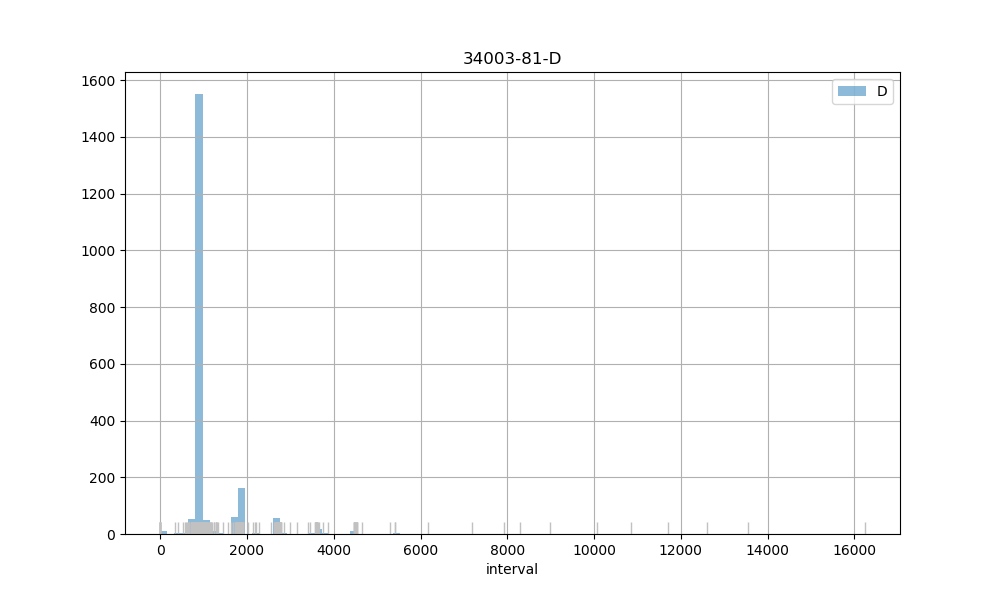

D count     2022.00
mean      1167.59
std        925.76
min          2.00
25%        884.00
50%        906.00
75%        944.75
max      16238.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count     2084.00
mean      1549.35
std       1666.46
min          2.00
25%        886.00
50%        910.00
75%       1768.00
max      18885.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


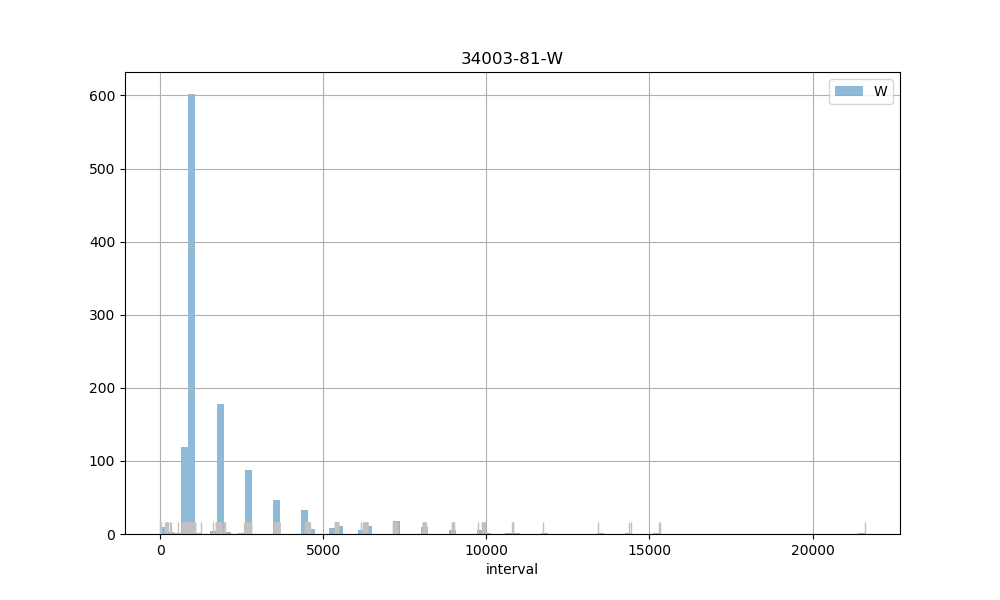

W count     1180.00
mean      1902.35
std       2050.81
min          5.00
25%        893.00
50%        923.00
75%       1831.00
max      21599.00
Name: interval, dtype: object
34003-83


<IPython.core.display.Javascript object>


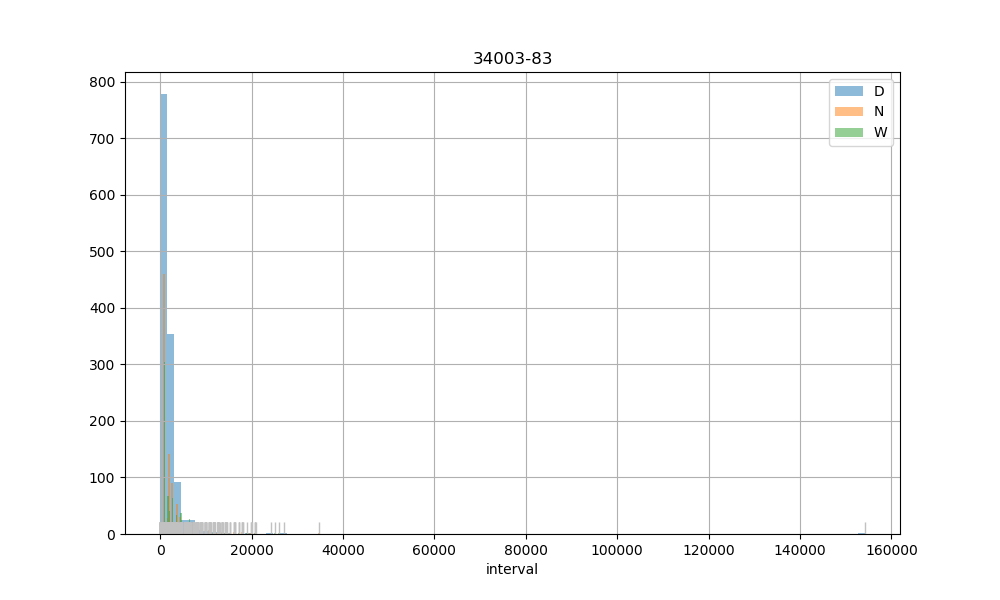

D count      1295.00
mean       1940.07
std        4666.57
min           1.00
25%         889.00
50%         943.00
75%        1851.00
max      154190.00
Name: interval, dtype: object
N count     1038.00
mean      2984.74
std       3545.64
min          2.00
25%        901.25
50%       1743.50
75%       3585.00
max      34832.00
Name: interval, dtype: object
W count      725.00
mean      3057.73
std       3513.19
min          2.00
25%        897.00
50%       1784.00
75%       3624.00
max      25946.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


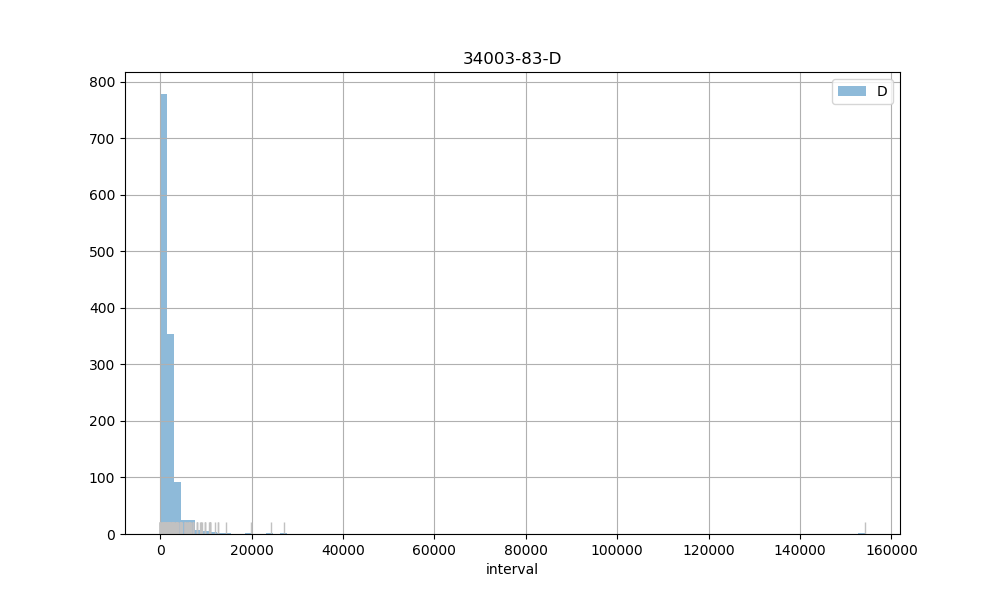

D count      1295.00
mean       1940.07
std        4666.57
min           1.00
25%         889.00
50%         943.00
75%        1851.00
max      154190.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count     1038.00
mean      2984.74
std       3545.64
min          2.00
25%        901.25
50%       1743.50
75%       3585.00
max      34832.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


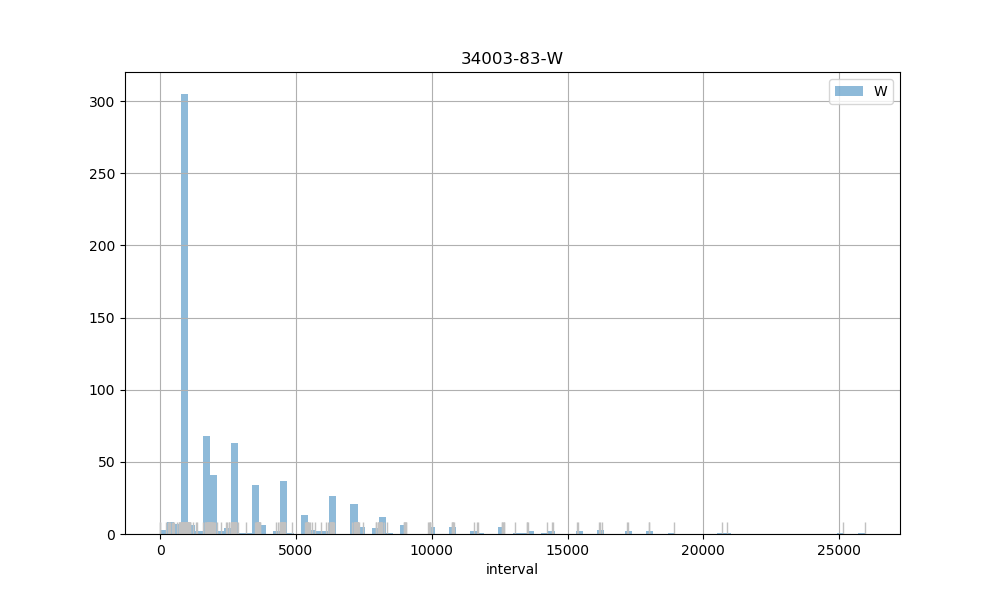

W count      725.00
mean      3057.73
std       3513.19
min          2.00
25%        897.00
50%       1784.00
75%       3624.00
max      25946.00
Name: interval, dtype: object
34003-84


<IPython.core.display.Javascript object>

D count      753.00
mean      3620.62
std       6242.64
min          2.00
25%        900.00
50%       1719.00
75%       3599.00
max      61360.00
Name: interval, dtype: object
N count      441.00
mean      6249.15
std       9707.85
min          2.00
25%        937.00
50%       2842.00
75%       7240.00
max      86412.00
Name: interval, dtype: object
W count       309.00
mean       7586.27
std       12760.08
min         258.00
25%         922.00
50%        3695.00
75%        8992.00
max      149826.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


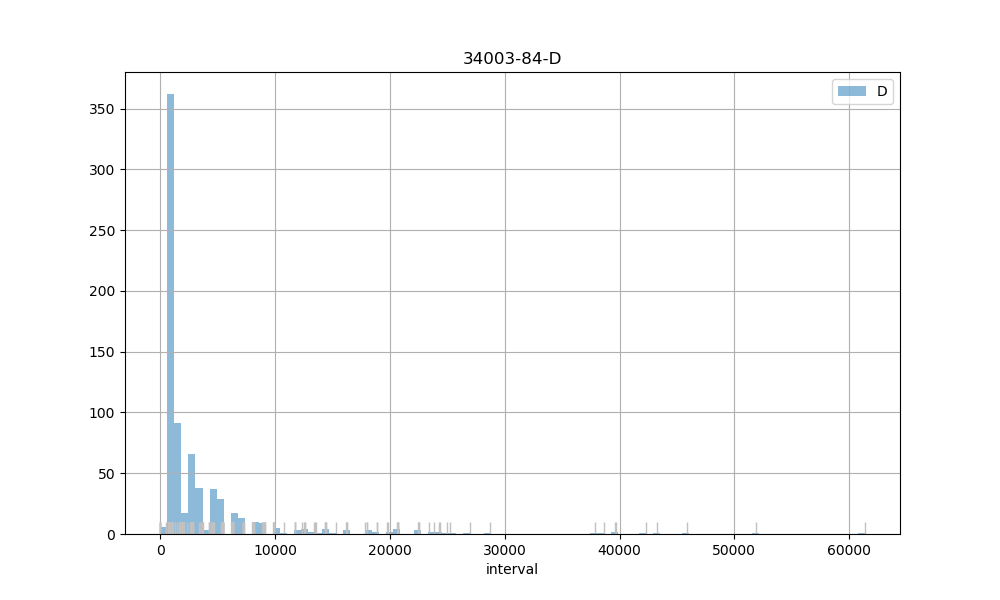

D count      753.00
mean      3620.62
std       6242.64
min          2.00
25%        900.00
50%       1719.00
75%       3599.00
max      61360.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count      441.00
mean      6249.15
std       9707.85
min          2.00
25%        937.00
50%       2842.00
75%       7240.00
max      86412.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


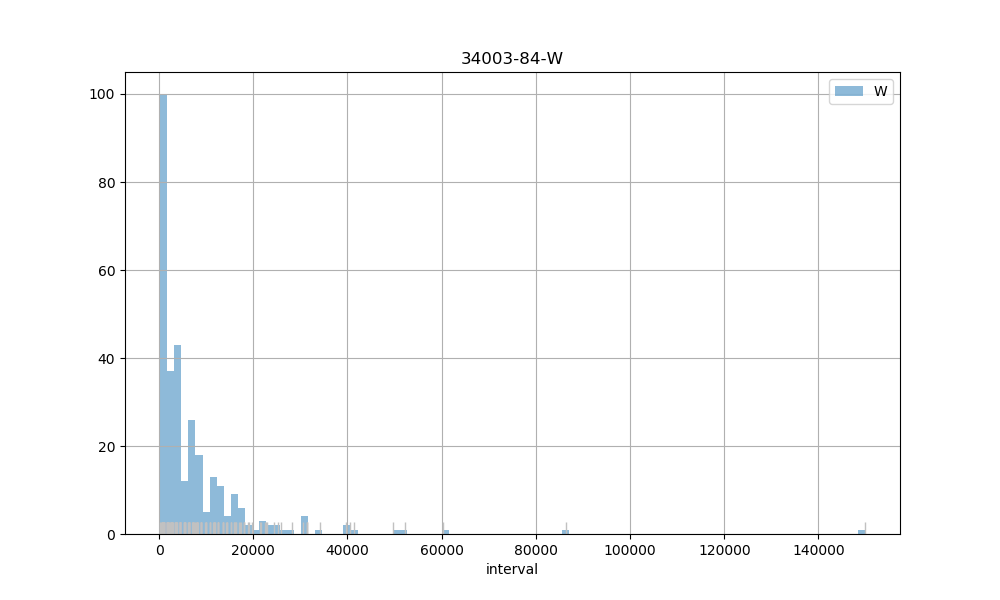

W count       309.00
mean       7586.27
std       12760.08
min         258.00
25%         922.00
50%        3695.00
75%        8992.00
max      149826.00
Name: interval, dtype: object
34003-899


<IPython.core.display.Javascript object>


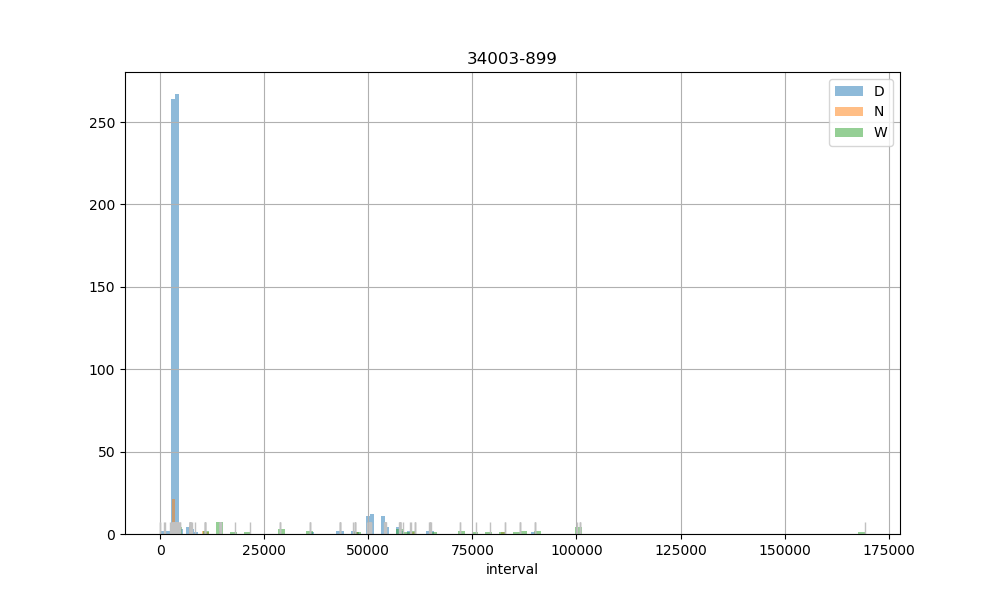

D count      607.00
mean      8439.52
std      14838.04
min          8.00
25%       3554.50
50%       3618.00
75%       3685.00
max      89958.00
Name: interval, dtype: object
N count       43.00
mean     11376.63
std      18037.46
min       2848.00
25%       3581.50
50%       3654.00
75%       7405.00
max      82717.00
Name: interval, dtype: object
W count        43.00
mean      50993.51
std       37820.21
min        3556.00
25%       14445.50
50%       57572.00
75%       81006.50
max      169246.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


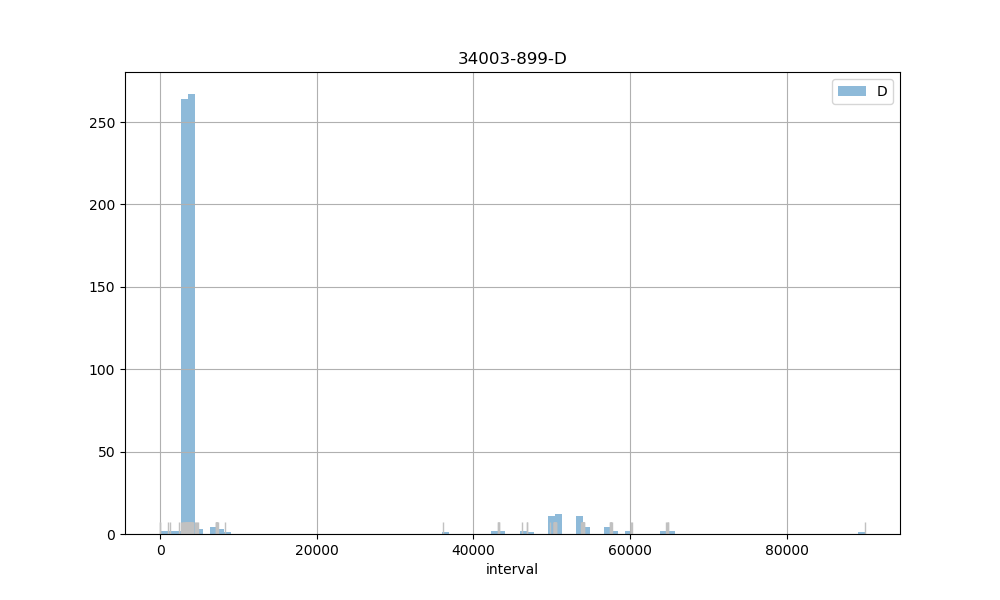

D count      607.00
mean      8439.52
std      14838.04
min          8.00
25%       3554.50
50%       3618.00
75%       3685.00
max      89958.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count       43.00
mean     11376.63
std      18037.46
min       2848.00
25%       3581.50
50%       3654.00
75%       7405.00
max      82717.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


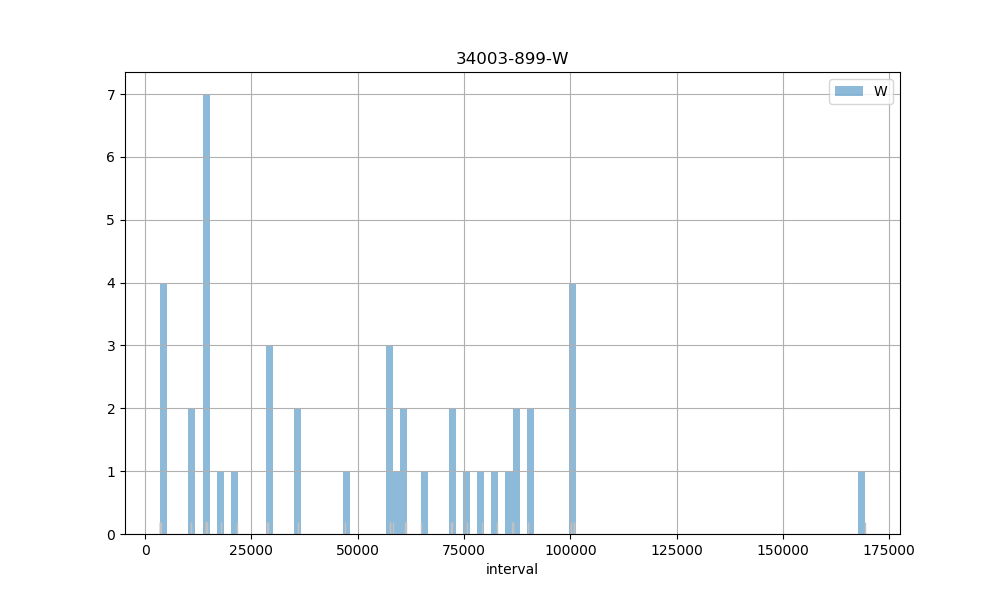

W count        43.00
mean      50993.51
std       37820.21
min        3556.00
25%       14445.50
50%       57572.00
75%       81006.50
max      169246.00
Name: interval, dtype: object
34003-85


<IPython.core.display.Javascript object>


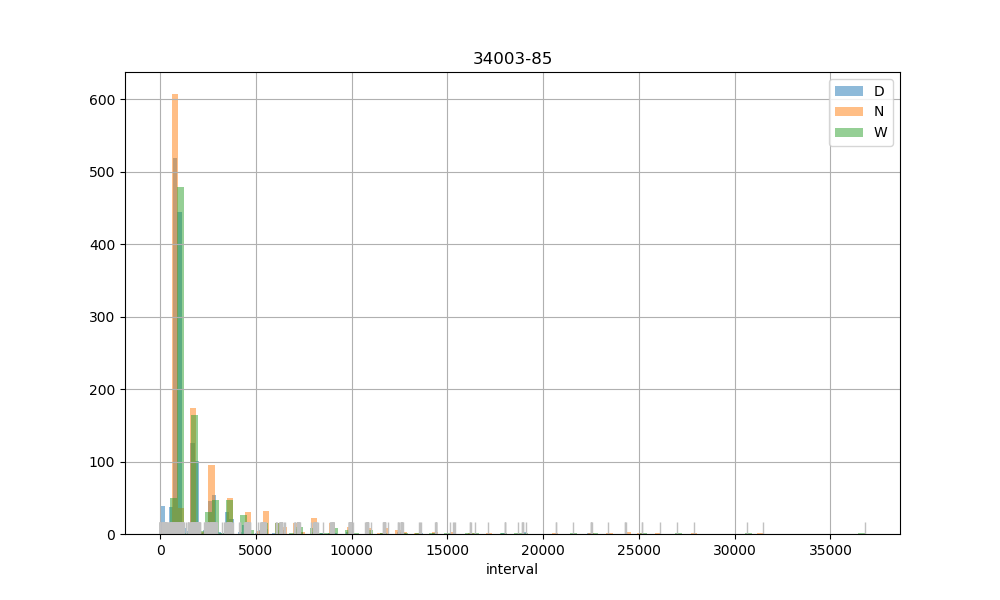

D count     1545.00
mean      1628.44
std       1950.41
min          2.00
25%        887.00
50%        914.00
75%       1796.00
max      22515.00
Name: interval, dtype: object
N count     1175.00
mean      2622.88
std       3451.17
min          2.00
25%        897.00
50%        937.00
75%       2703.00
max      31493.00
Name: interval, dtype: object
W count      956.00
mean      2340.52
std       3272.07
min        129.00
25%        897.00
50%        929.50
75%       2668.50
max      36792.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


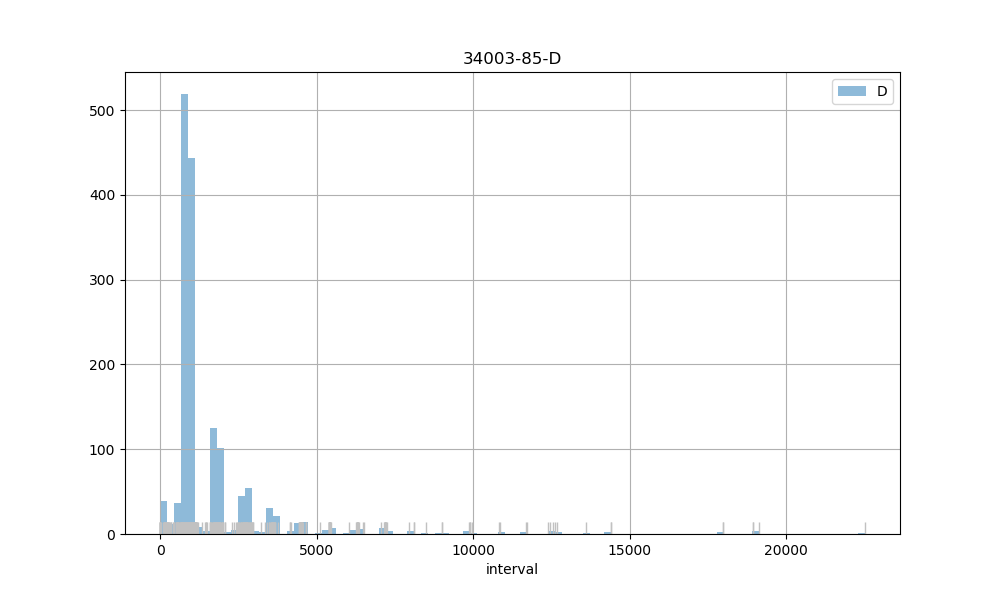

D count     1545.00
mean      1628.44
std       1950.41
min          2.00
25%        887.00
50%        914.00
75%       1796.00
max      22515.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


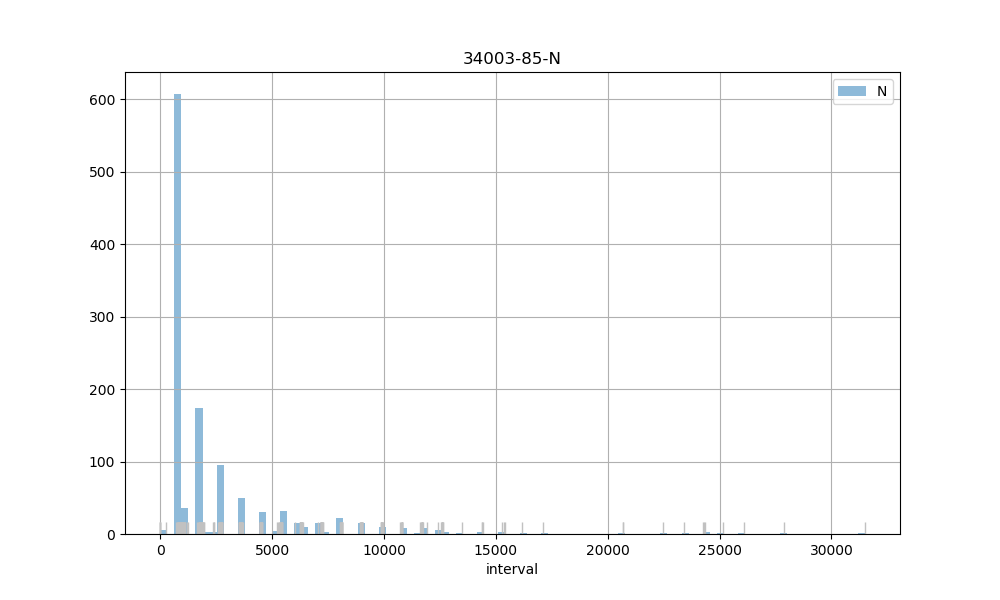

N count     1175.00
mean      2622.88
std       3451.17
min          2.00
25%        897.00
50%        937.00
75%       2703.00
max      31493.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count      956.00
mean      2340.52
std       3272.07
min        129.00
25%        897.00
50%        929.50
75%       2668.50
max      36792.00
Name: interval, dtype: object
34003-2500


<IPython.core.display.Javascript object>


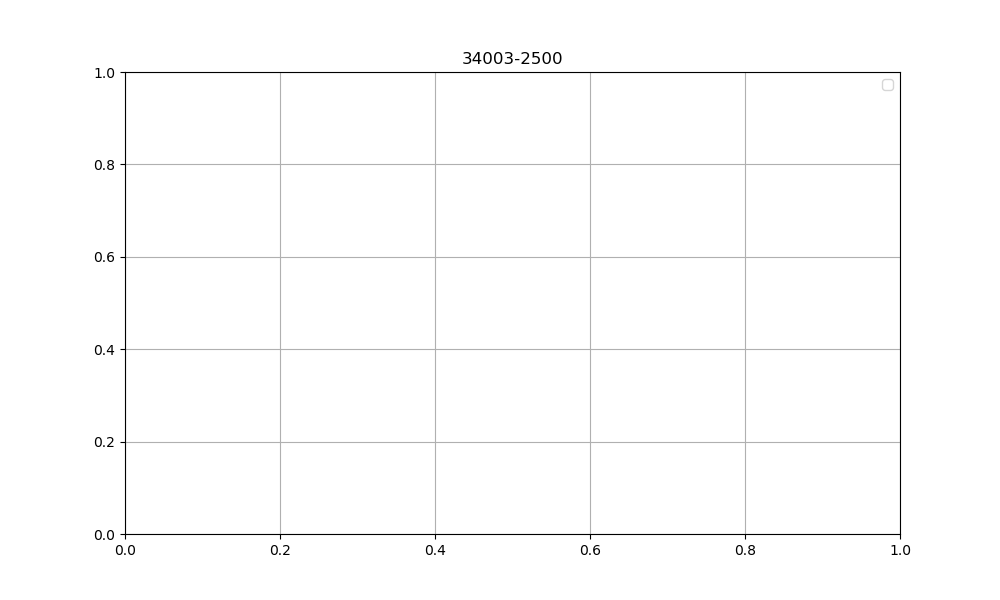

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>

D count    0.00
mean      nan
std       nan
min       nan
25%       nan
50%       nan
75%       nan
max       nan
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count    0.00
mean      nan
std       nan
min       nan
25%       nan
50%       nan
75%       nan
max       nan
Name: interval, dtype: object


<IPython.core.display.Javascript object>


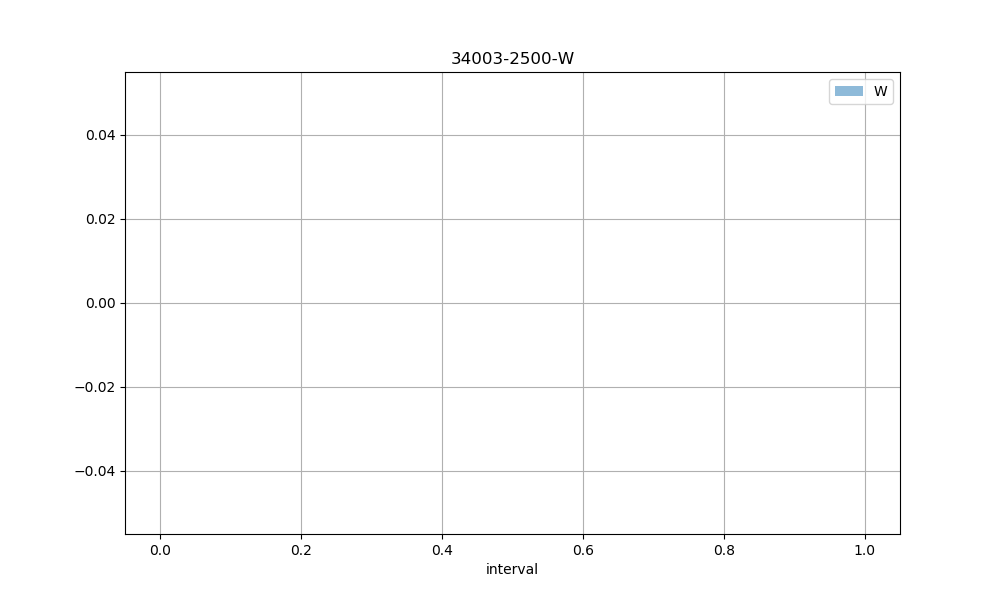

W count    0.00
mean      nan
std       nan
min       nan
25%       nan
50%       nan
75%       nan
max       nan
Name: interval, dtype: object
34003-88


<IPython.core.display.Javascript object>

D count      498.00
mean      4105.61
std       5541.31
min          2.00
25%        911.25
50%       1801.00
75%       4531.00
max      44836.00
Name: interval, dtype: object
N count       505.00
mean       7560.64
std       37733.37
min           2.00
25%         928.00
50%        2018.00
75%        6250.00
max      775862.00
Name: interval, dtype: object
W count      298.00
mean      6559.59
std       8431.71
min        735.00
25%        934.25
50%       2746.00
75%       8986.00
max      53073.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


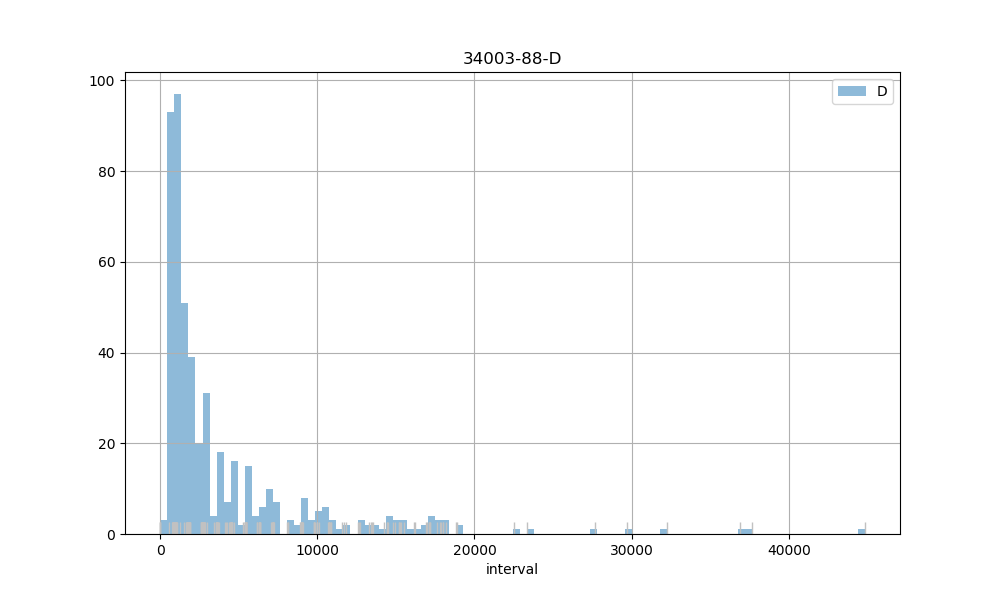

D count      498.00
mean      4105.61
std       5541.31
min          2.00
25%        911.25
50%       1801.00
75%       4531.00
max      44836.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


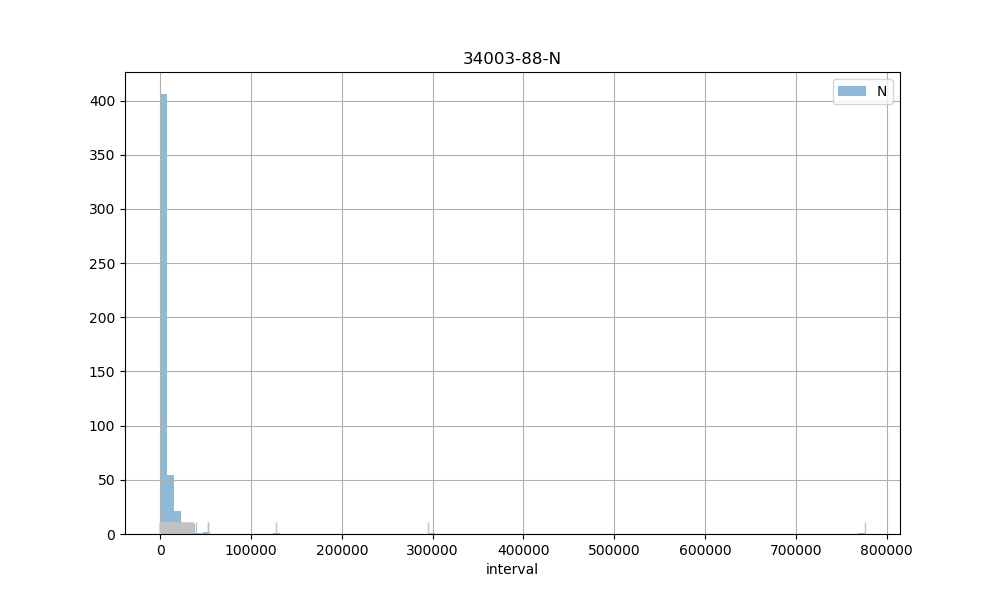

N count       505.00
mean       7560.64
std       37733.37
min           2.00
25%         928.00
50%        2018.00
75%        6250.00
max      775862.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count      298.00
mean      6559.59
std       8431.71
min        735.00
25%        934.25
50%       2746.00
75%       8986.00
max      53073.00
Name: interval, dtype: object
34003-89


<IPython.core.display.Javascript object>


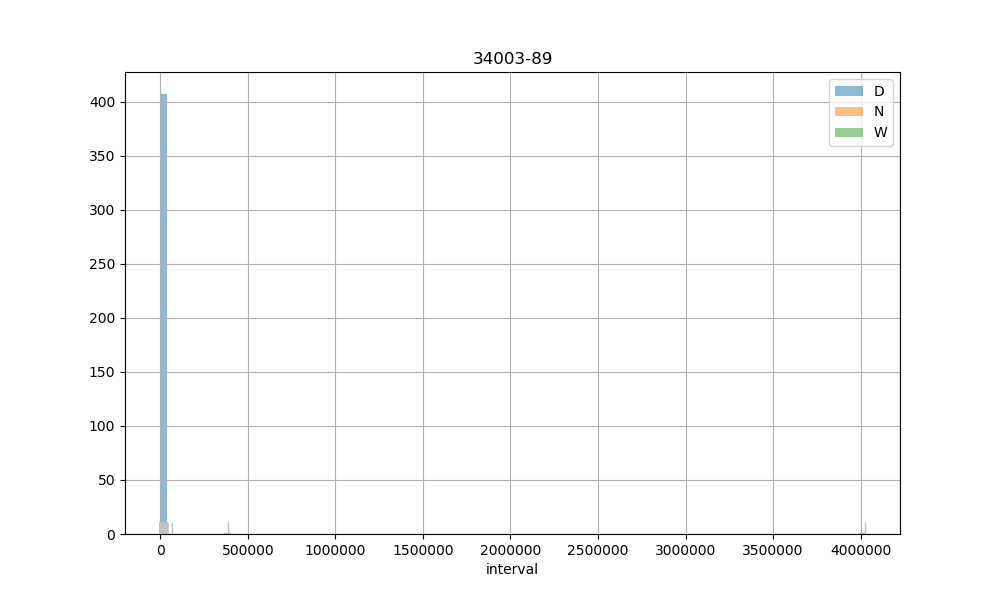

D count        409.00
mean       14032.56
std       199720.35
min            4.00
25%          896.00
50%         1391.00
75%         2748.00
max      4023533.00
Name: interval, dtype: object
N count      299.00
mean      4107.39
std       6759.61
min        238.00
25%        886.50
50%        982.00
75%       4536.00
max      66814.00
Name: interval, dtype: object
W count      189.00
mean      4572.83
std       6732.53
min        613.00
25%        897.00
50%       1793.00
75%       4826.00
max      37971.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count        409.00
mean       14032.56
std       199720.35
min            4.00
25%          896.00
50%         1391.00
75%         2748.00
max      4023533.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


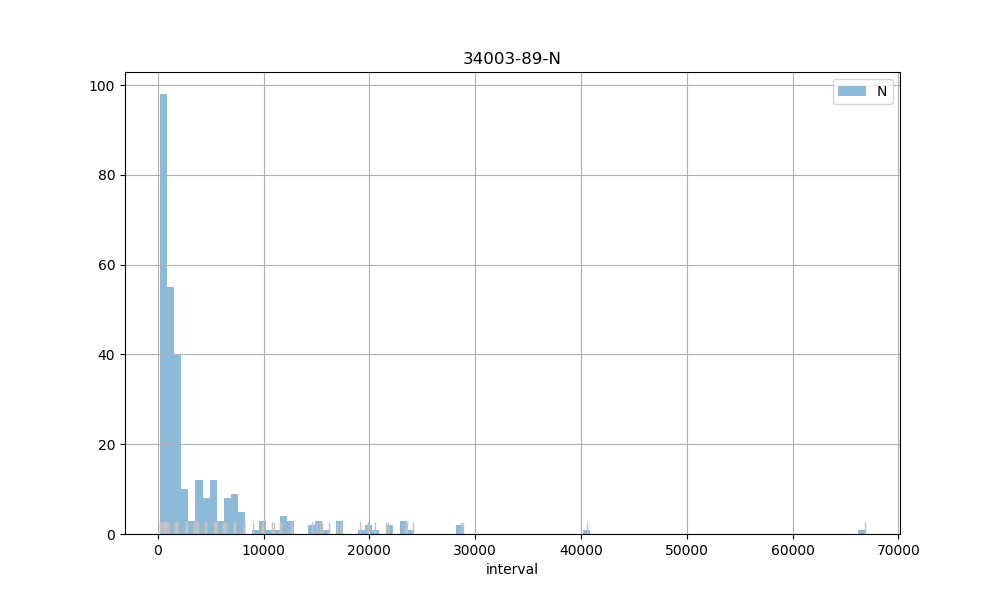

N count      299.00
mean      4107.39
std       6759.61
min        238.00
25%        886.50
50%        982.00
75%       4536.00
max      66814.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


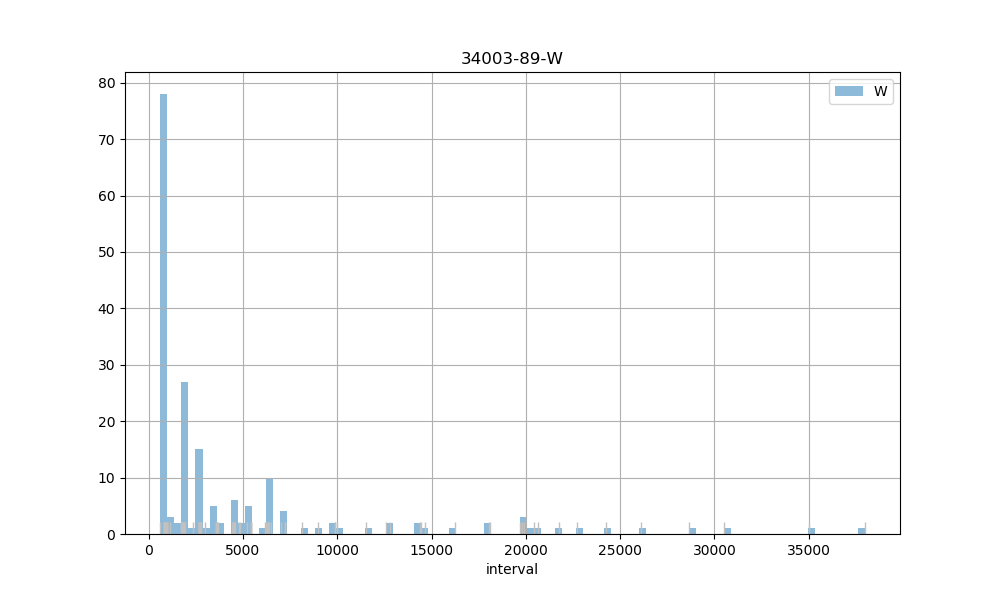

W count      189.00
mean      4572.83
std       6732.53
min        613.00
25%        897.00
50%       1793.00
75%       4826.00
max      37971.00
Name: interval, dtype: object
34003-91


<IPython.core.display.Javascript object>


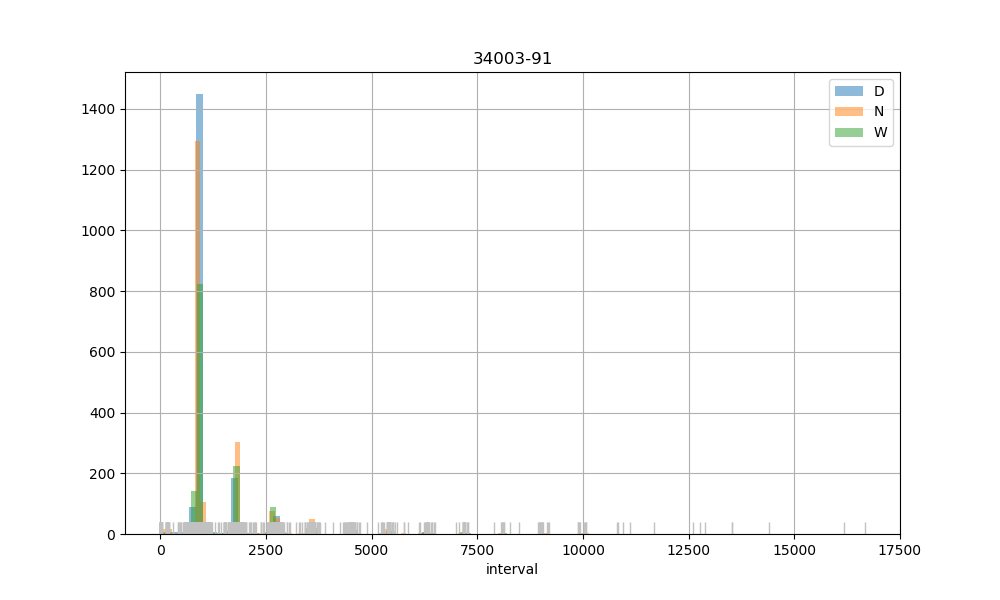

D count     1982.00
mean      1238.50
std       1092.37
min          2.00
25%        883.00
50%        907.00
75%        957.00
max      16668.00
Name: interval, dtype: object
N count     2147.00
mean      1460.22
std       1247.55
min         -2.00
25%        889.00
50%        913.00
75%       1791.50
max      13535.00
Name: interval, dtype: object
W count     1484.00
mean      1513.19
std       1406.16
min          3.00
25%        890.00
50%        916.00
75%       1790.25
max      14400.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


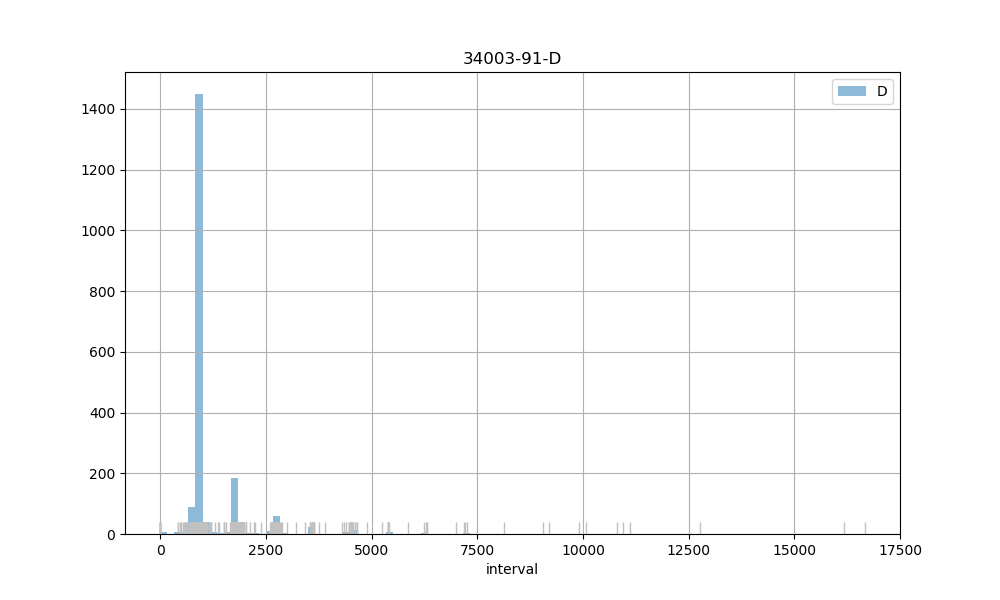

D count     1982.00
mean      1238.50
std       1092.37
min          2.00
25%        883.00
50%        907.00
75%        957.00
max      16668.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

N count     2147.00
mean      1460.22
std       1247.55
min         -2.00
25%        889.00
50%        913.00
75%       1791.50
max      13535.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


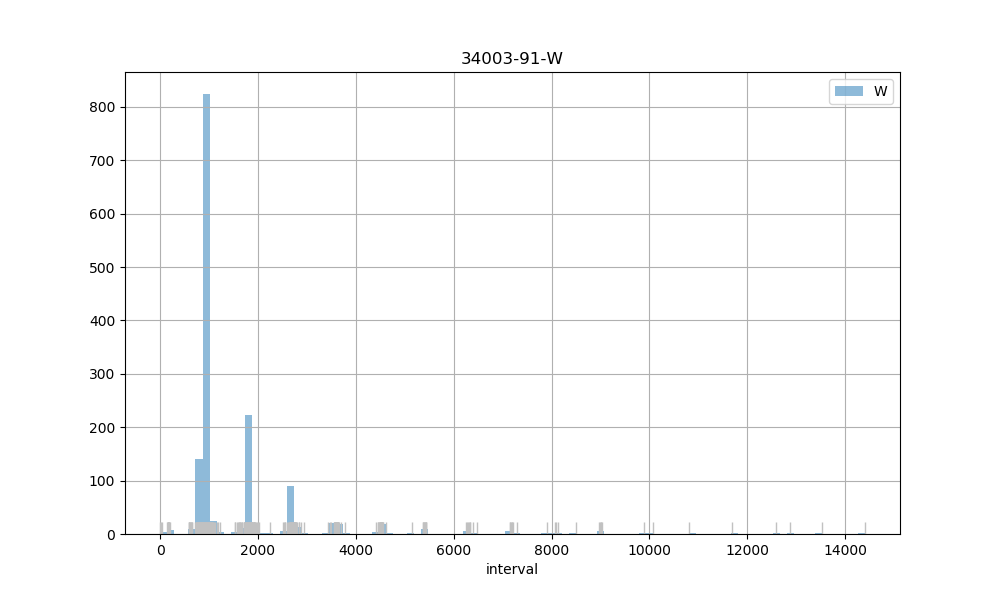

W count     1484.00
mean      1513.19
std       1406.16
min          3.00
25%        890.00
50%        916.00
75%       1790.25
max      14400.00
Name: interval, dtype: object
34003-92


<IPython.core.display.Javascript object>


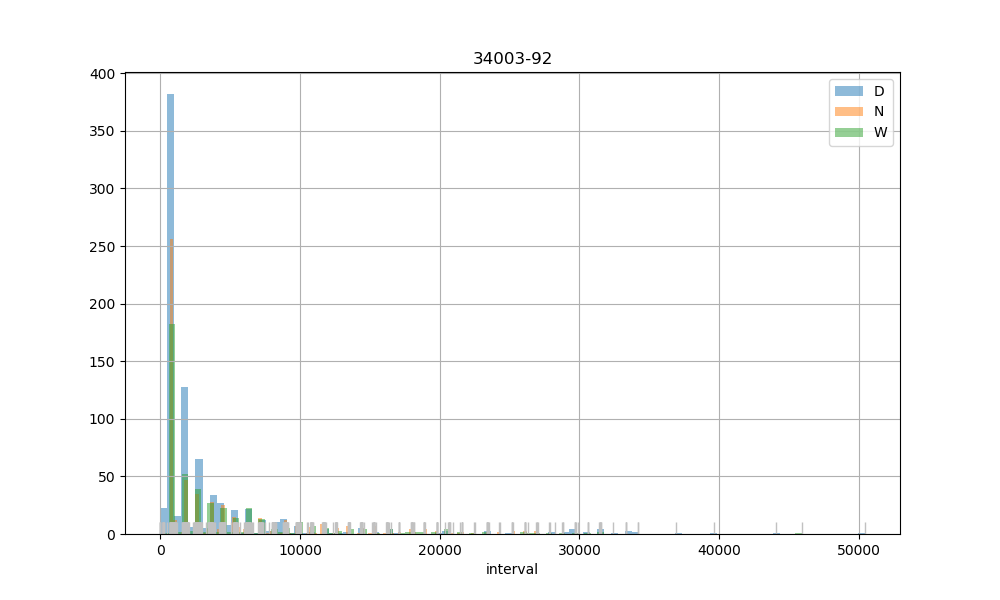

D count      840.00
mean      3590.77
std       6138.09
min          2.00
25%        898.00
50%       1080.50
75%       3578.75
max      50422.00
Name: interval, dtype: object
N count      576.00
mean      4535.37
std       5721.02
min        676.00
25%        902.00
50%       1794.00
75%       5424.00
max      27006.00
Name: interval, dtype: object
W count      468.00
mean      4709.56
std       6176.12
min        175.00
25%        906.00
50%       1876.00
75%       6071.25
max      45904.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


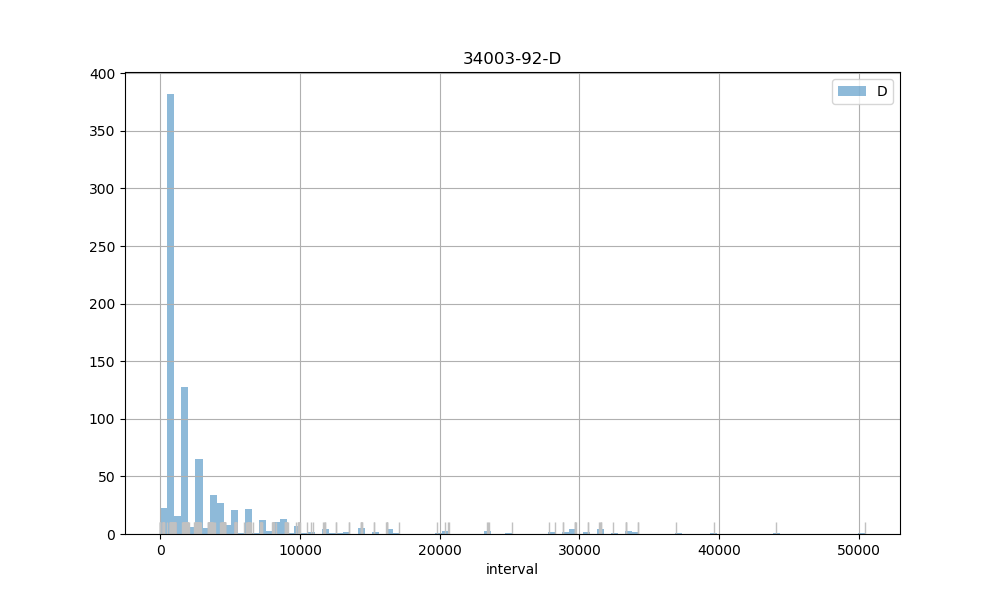

D count      840.00
mean      3590.77
std       6138.09
min          2.00
25%        898.00
50%       1080.50
75%       3578.75
max      50422.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


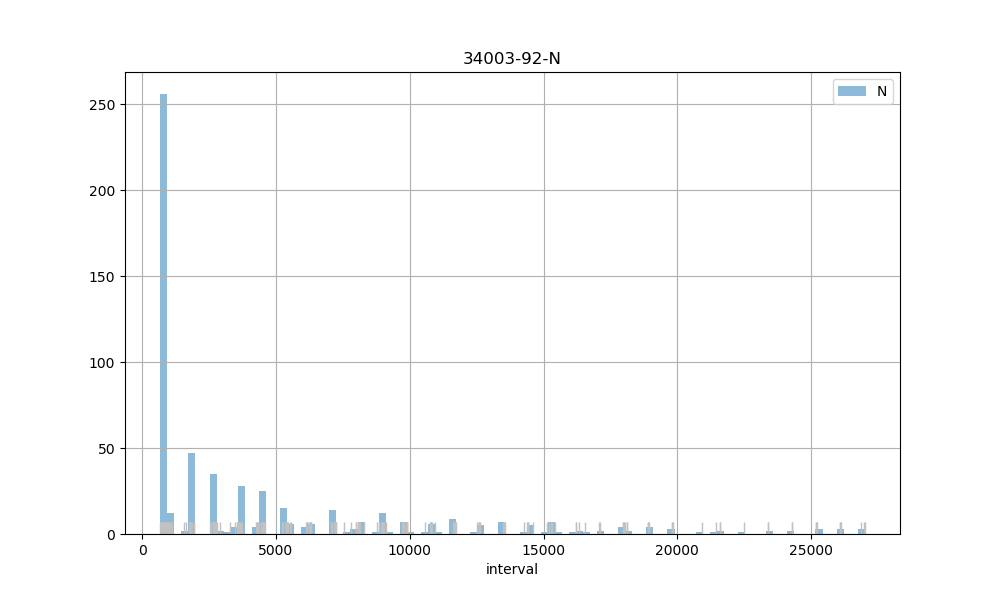

N count      576.00
mean      4535.37
std       5721.02
min        676.00
25%        902.00
50%       1794.00
75%       5424.00
max      27006.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


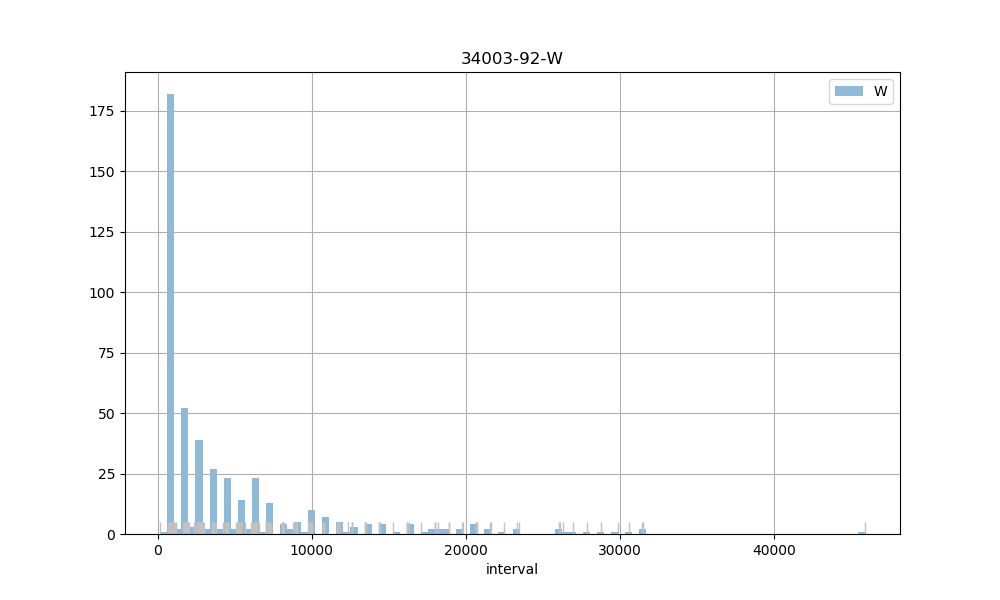

W count      468.00
mean      4709.56
std       6176.12
min        175.00
25%        906.00
50%       1876.00
75%       6071.25
max      45904.00
Name: interval, dtype: object
34003-93


<IPython.core.display.Javascript object>


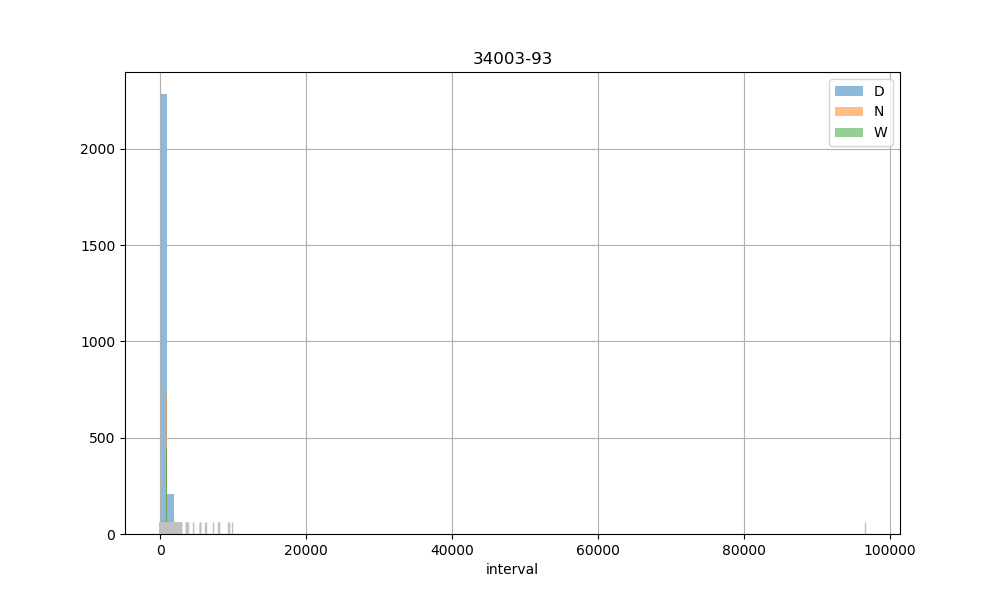

D count     2503.00
mean       952.46
std       1926.18
min          2.00
25%        879.00
50%        901.00
75%        923.00
max      96519.00
Name: interval, dtype: object
N count    3330.00
mean      962.40
std       475.13
min         2.00
25%       880.25
50%       901.00
75%       920.00
max      9795.00
Name: interval, dtype: object
W count    2396.00
mean      938.03
std       258.31
min         2.00
25%       882.00
50%       901.00
75%       919.00
max      3835.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


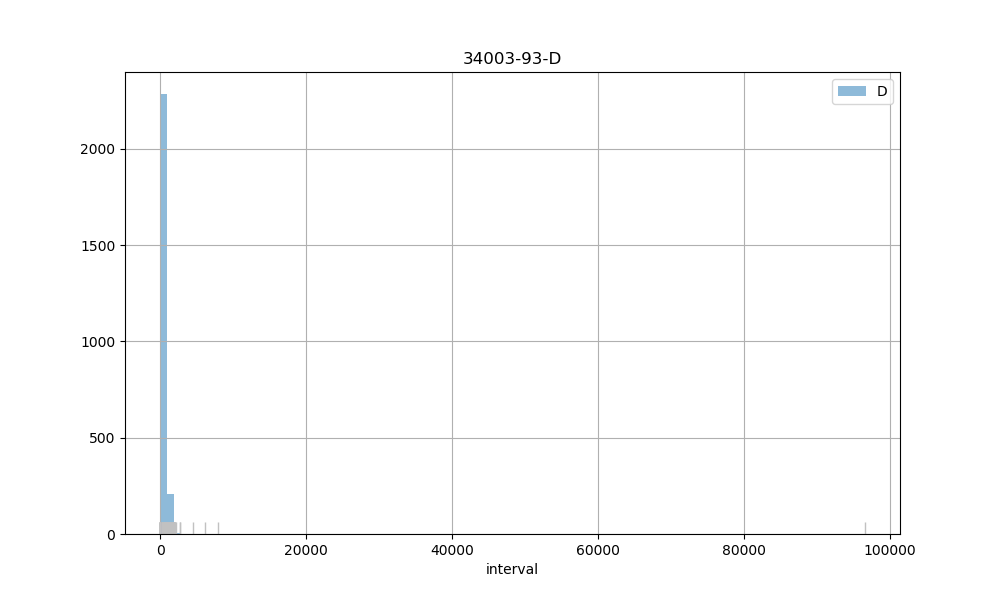

D count     2503.00
mean       952.46
std       1926.18
min          2.00
25%        879.00
50%        901.00
75%        923.00
max      96519.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


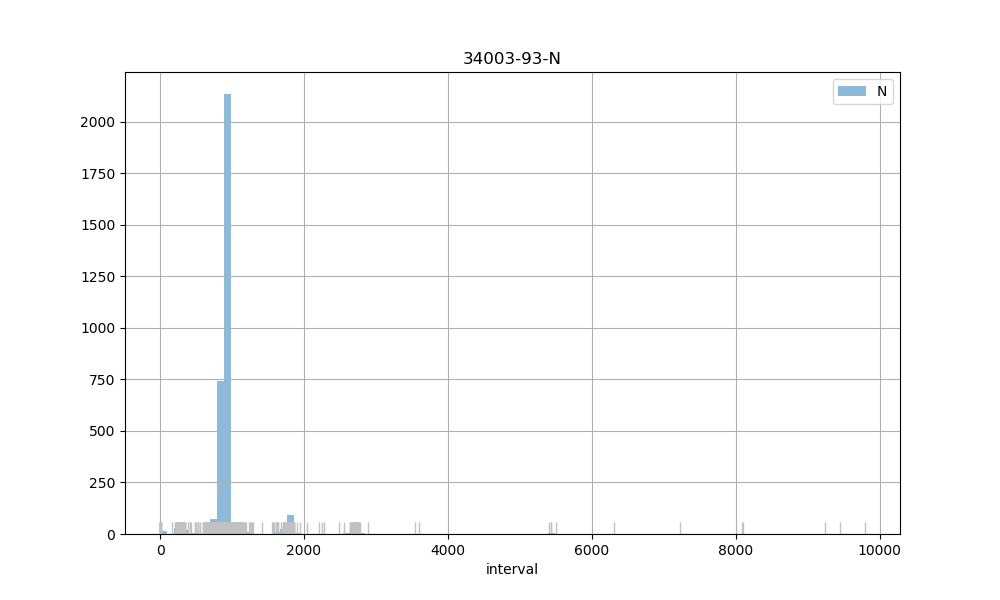

N count    3330.00
mean      962.40
std       475.13
min         2.00
25%       880.25
50%       901.00
75%       920.00
max      9795.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


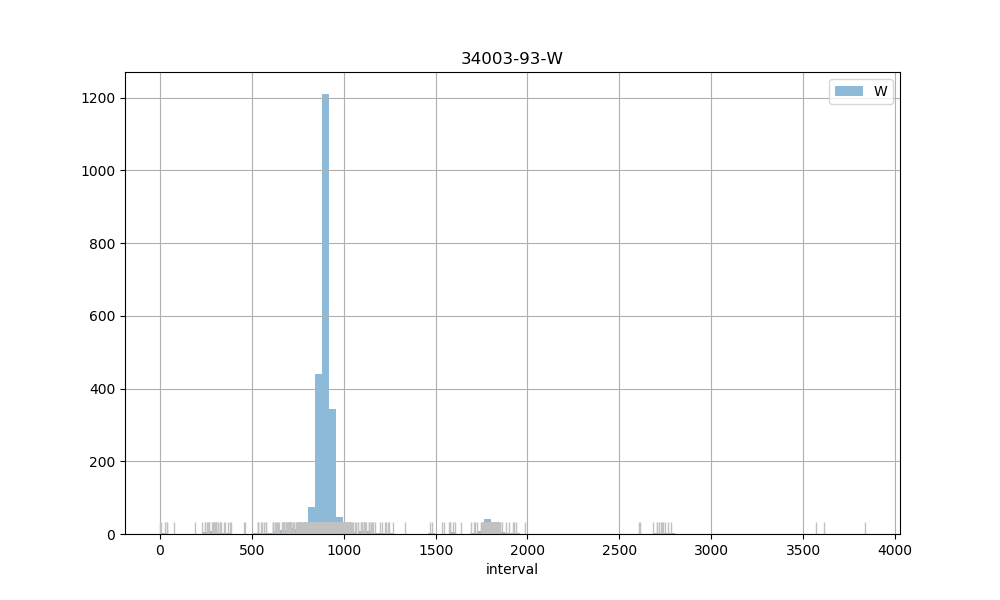

W count    2396.00
mean      938.03
std       258.31
min         2.00
25%       882.00
50%       901.00
75%       919.00
max      3835.00
Name: interval, dtype: object
34003-94


<IPython.core.display.Javascript object>


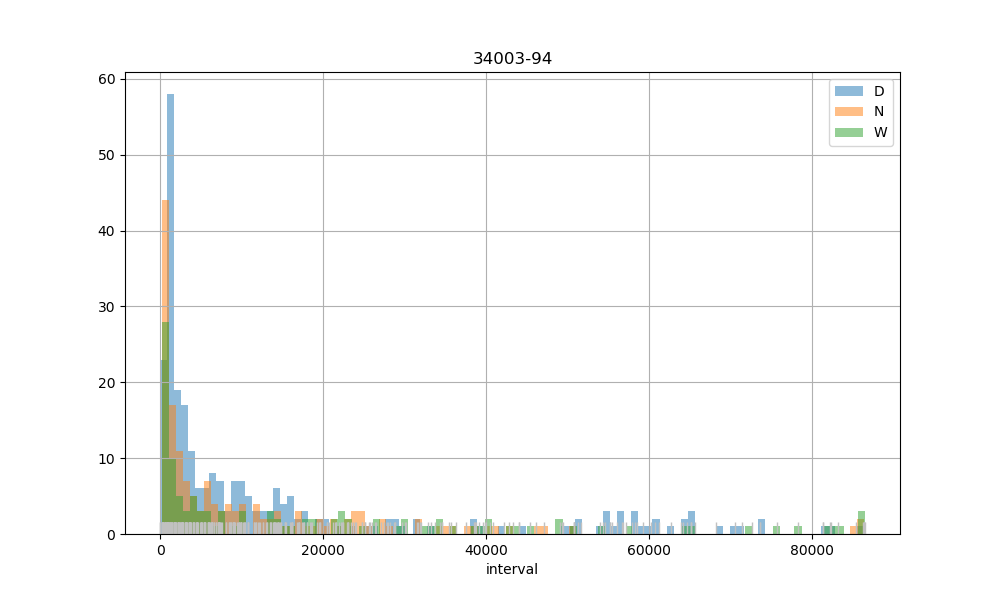

D count      260.00
mean     14125.64
std      20486.18
min          2.00
25%        921.75
50%       4524.50
75%      15341.50
max      86364.00
Name: interval, dtype: object
N count      164.00
mean     10959.58
std      15522.34
min        183.00
25%        961.25
50%       4046.50
75%      14771.00
max      86430.00
Name: interval, dtype: object
W count      117.00
mean     19354.53
std      24212.06
min        204.00
25%       1436.00
50%       7120.00
75%      30078.00
max      86526.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


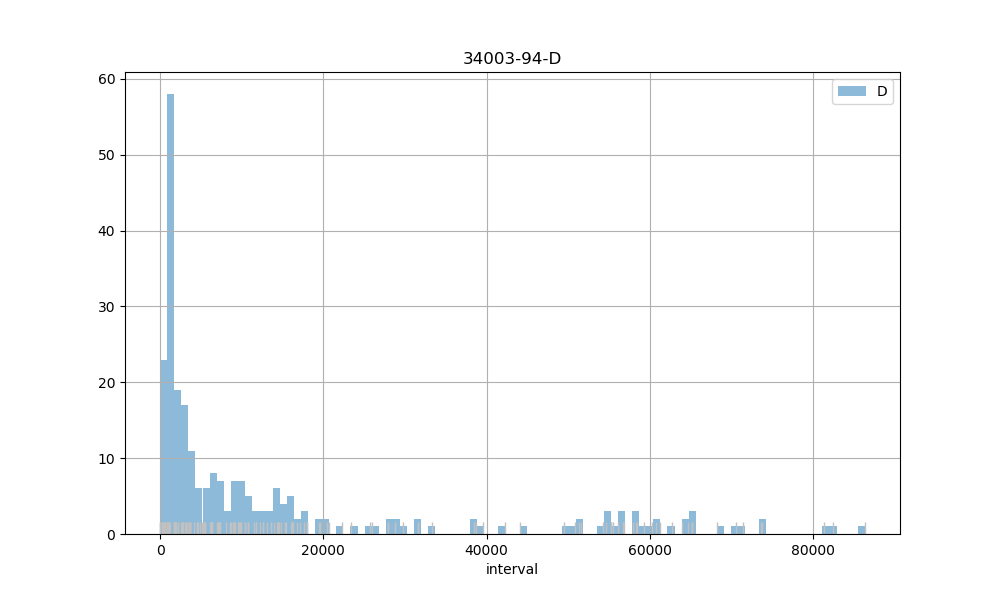

D count      260.00
mean     14125.64
std      20486.18
min          2.00
25%        921.75
50%       4524.50
75%      15341.50
max      86364.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


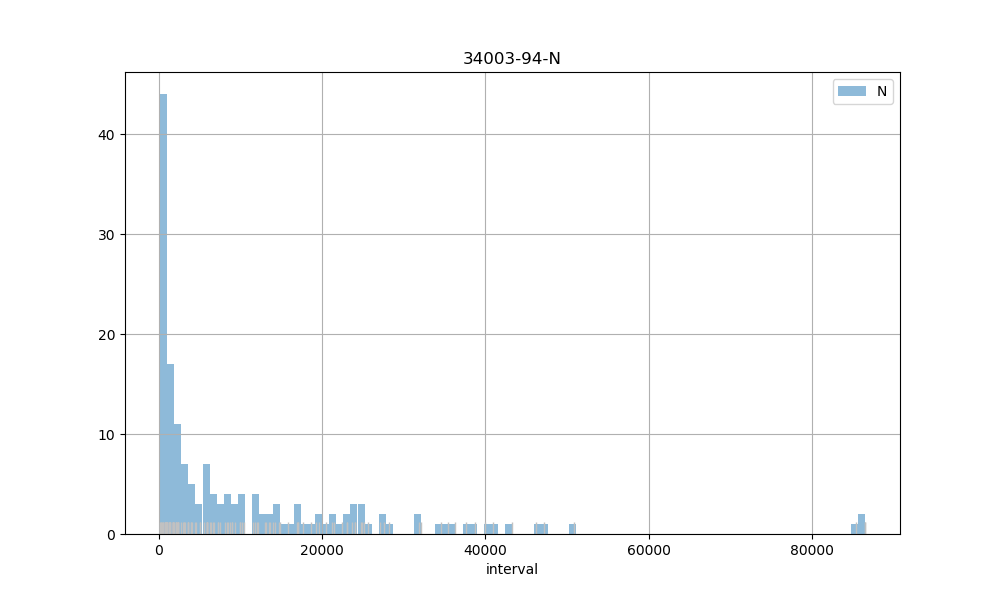

N count      164.00
mean     10959.58
std      15522.34
min        183.00
25%        961.25
50%       4046.50
75%      14771.00
max      86430.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


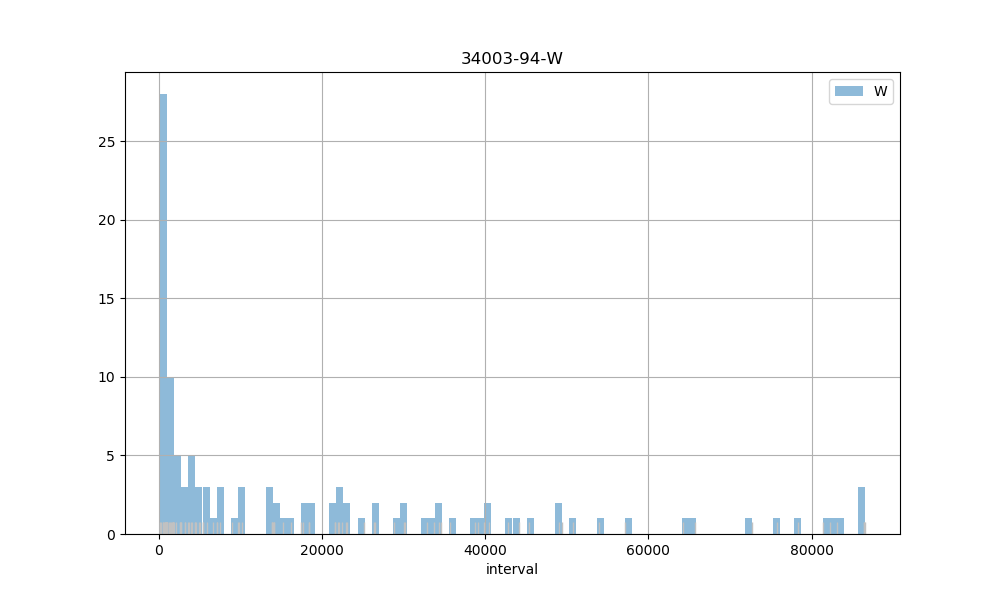

W count      117.00
mean     19354.53
std      24212.06
min        204.00
25%       1436.00
50%       7120.00
75%      30078.00
max      86526.00
Name: interval, dtype: object
34003-95


<IPython.core.display.Javascript object>


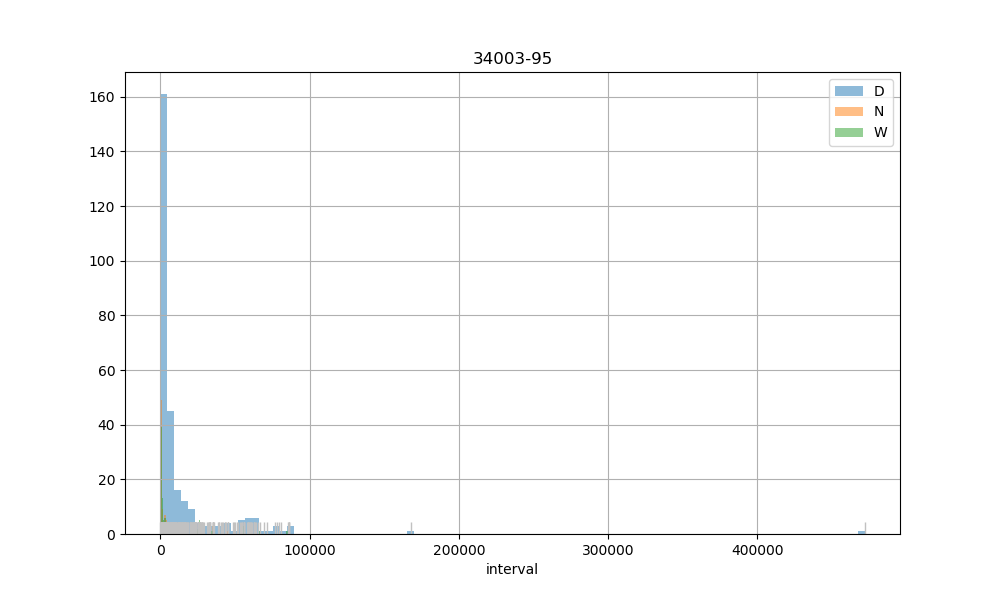

D count       289.00
mean      14396.82
std       34598.39
min           8.00
25%         925.00
50%        3547.00
75%       12488.00
max      471892.00
Name: interval, dtype: object
N count      135.00
mean      9851.82
std      12885.28
min        757.00
25%        911.50
50%       3599.00
75%      13818.50
max      56403.00
Name: interval, dtype: object
W count      125.00
mean     14983.54
std      19558.47
min        250.00
25%        918.00
50%       3638.00
75%      24174.00
max      85317.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


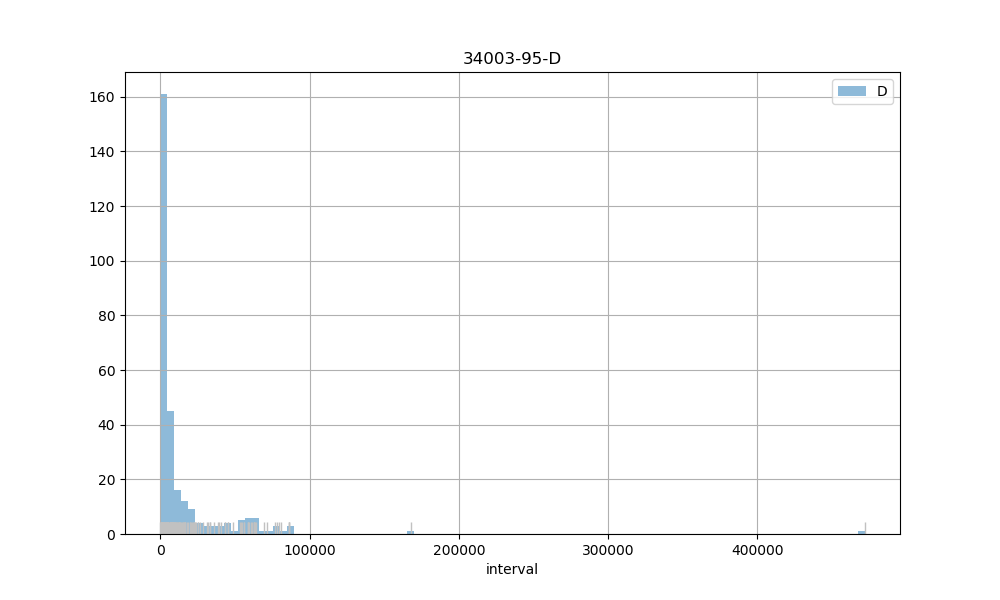

D count       289.00
mean      14396.82
std       34598.39
min           8.00
25%         925.00
50%        3547.00
75%       12488.00
max      471892.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


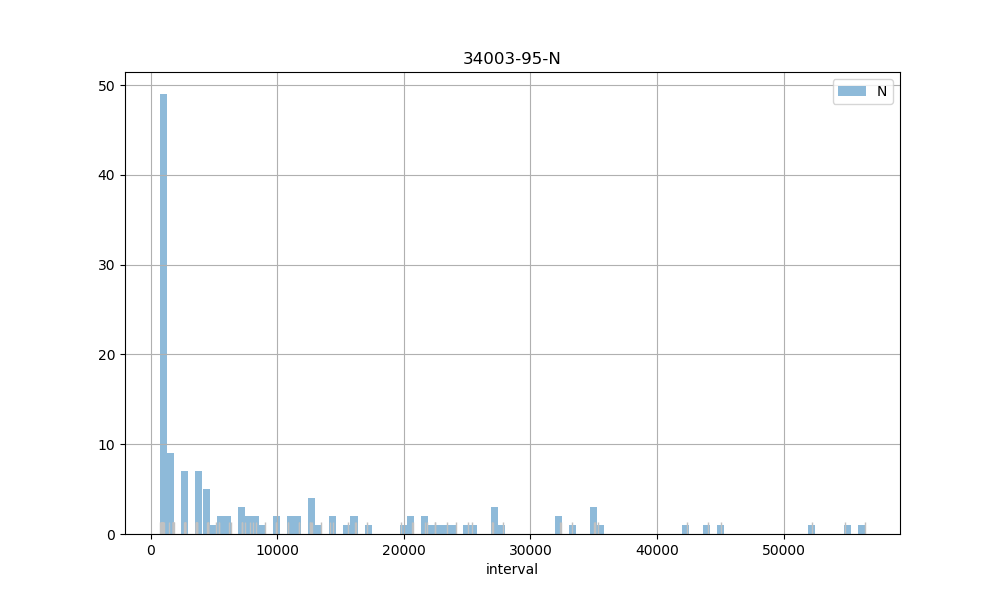

N count      135.00
mean      9851.82
std      12885.28
min        757.00
25%        911.50
50%       3599.00
75%      13818.50
max      56403.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

W count      125.00
mean     14983.54
std      19558.47
min        250.00
25%        918.00
50%       3638.00
75%      24174.00
max      85317.00
Name: interval, dtype: object
34003-96


<IPython.core.display.Javascript object>


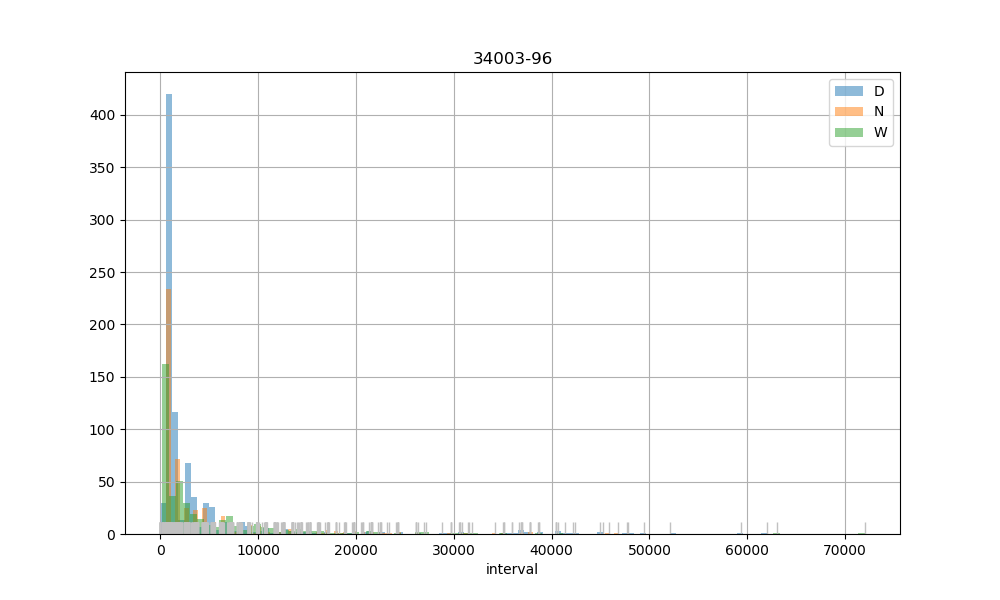

D count      862.00
mean      3960.99
std       7876.72
min          2.00
25%        897.00
50%       1077.50
75%       2980.25
max      62043.00
Name: interval, dtype: object
N count      500.00
mean      4377.40
std       6750.94
min        621.00
25%        904.00
50%       1765.00
75%       4521.25
max      46838.00
Name: interval, dtype: object
W count      449.00
mean      4963.65
std       7586.11
min        215.00
25%        905.00
50%       1816.00
75%       6304.00
max      72010.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


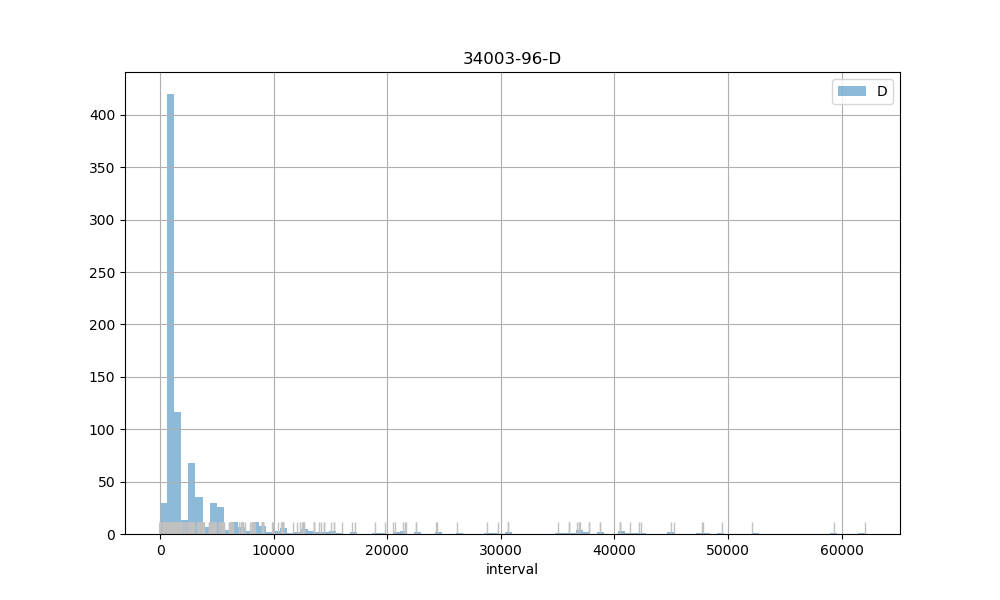

D count      862.00
mean      3960.99
std       7876.72
min          2.00
25%        897.00
50%       1077.50
75%       2980.25
max      62043.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


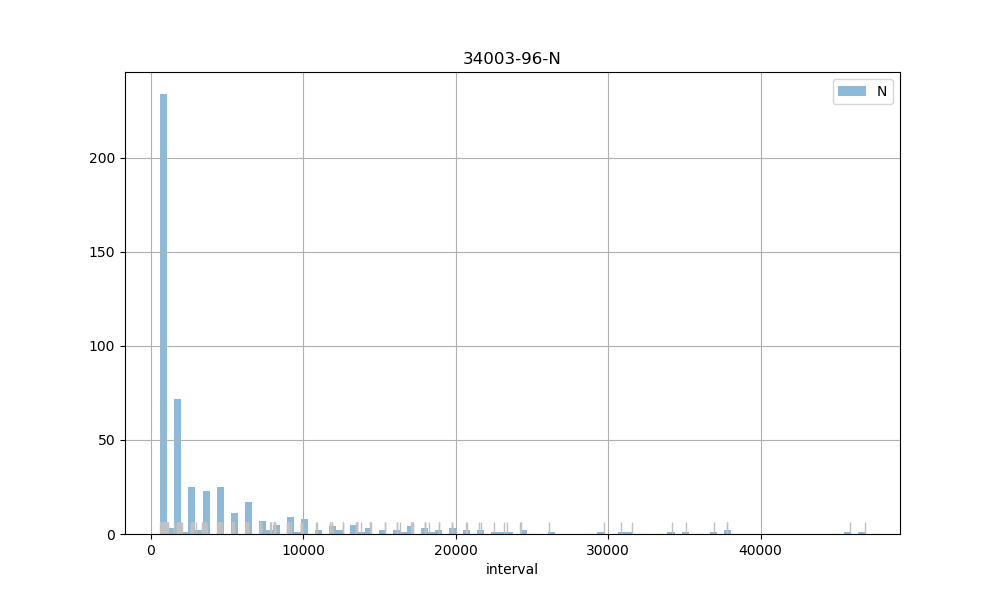

N count      500.00
mean      4377.40
std       6750.94
min        621.00
25%        904.00
50%       1765.00
75%       4521.25
max      46838.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


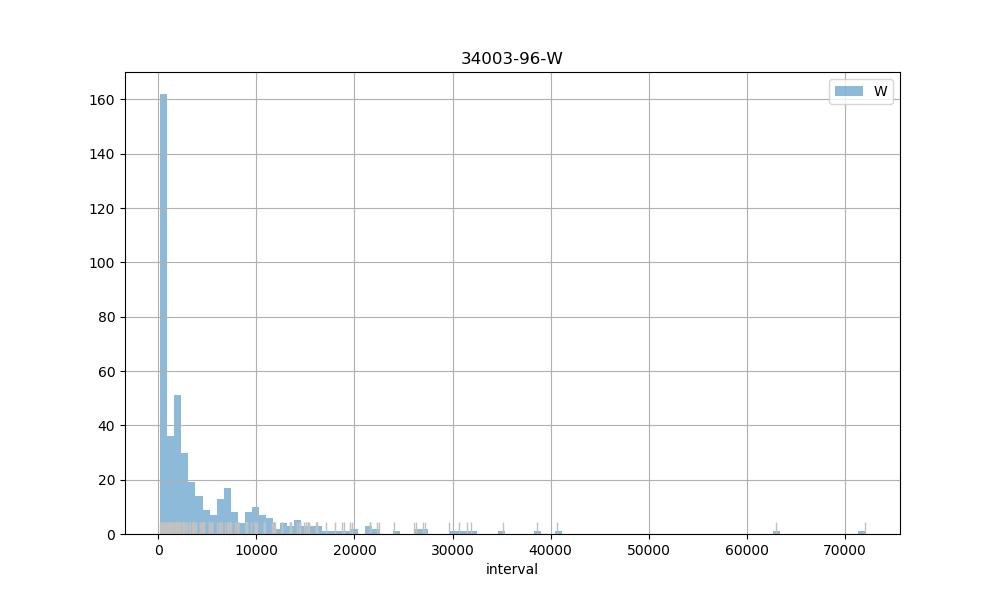

W count      449.00
mean      4963.65
std       7586.11
min        215.00
25%        905.00
50%       1816.00
75%       6304.00
max      72010.00
Name: interval, dtype: object
34003-97


<IPython.core.display.Javascript object>


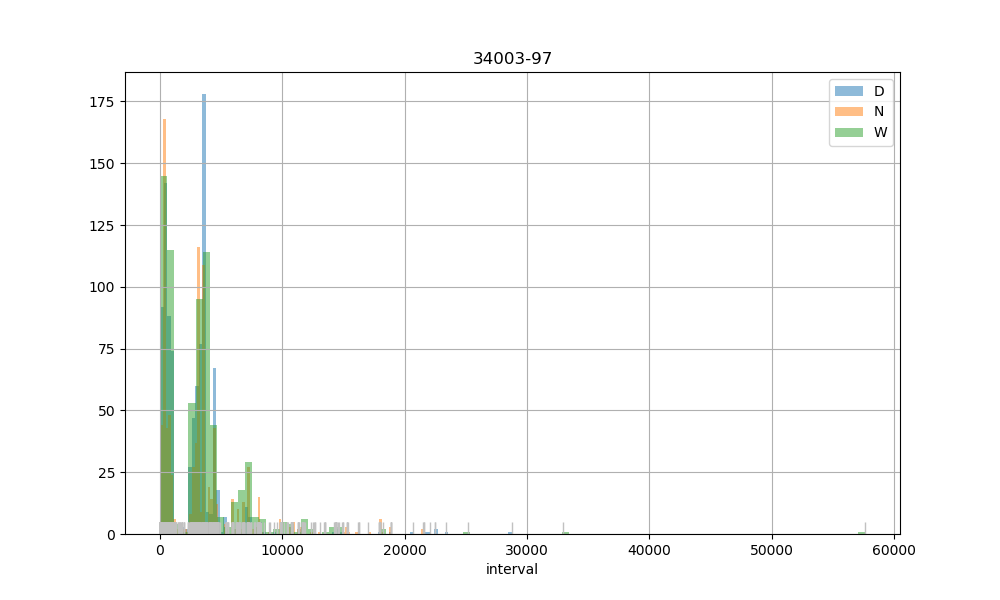

D count      956.00
mean      2692.42
std       2863.15
min         29.00
25%        639.50
50%       2902.50
75%       3598.25
max      28747.00
Name: interval, dtype: object
N count      893.00
mean      3381.52
std       3518.84
min         36.00
25%        545.00
50%       3186.00
75%       4119.00
max      21557.00
Name: interval, dtype: object
W count      687.00
mean      3257.62
std       3819.79
min         34.00
25%        679.00
50%       3150.00
75%       3613.50
max      57597.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


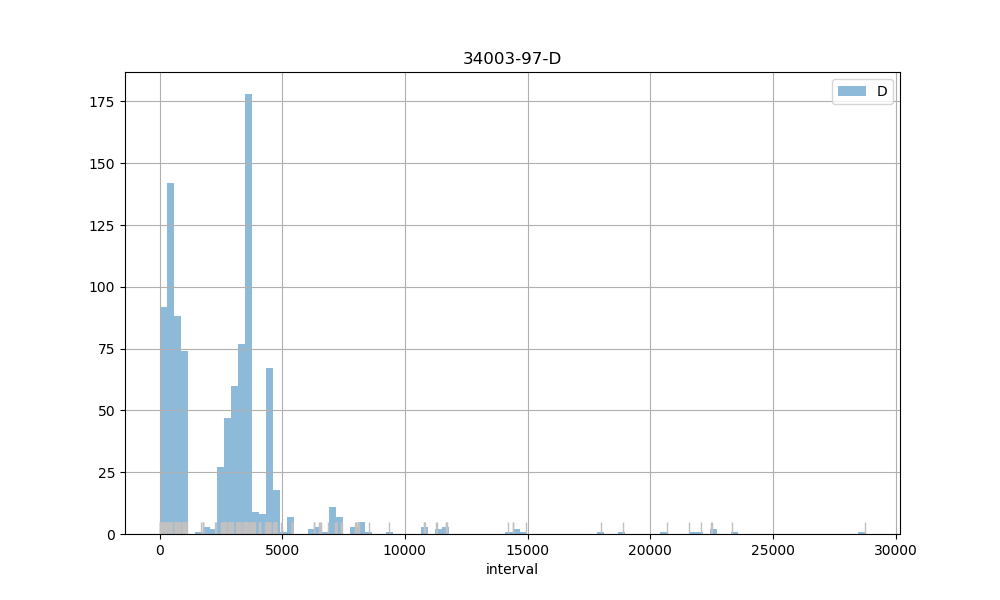

D count      956.00
mean      2692.42
std       2863.15
min         29.00
25%        639.50
50%       2902.50
75%       3598.25
max      28747.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


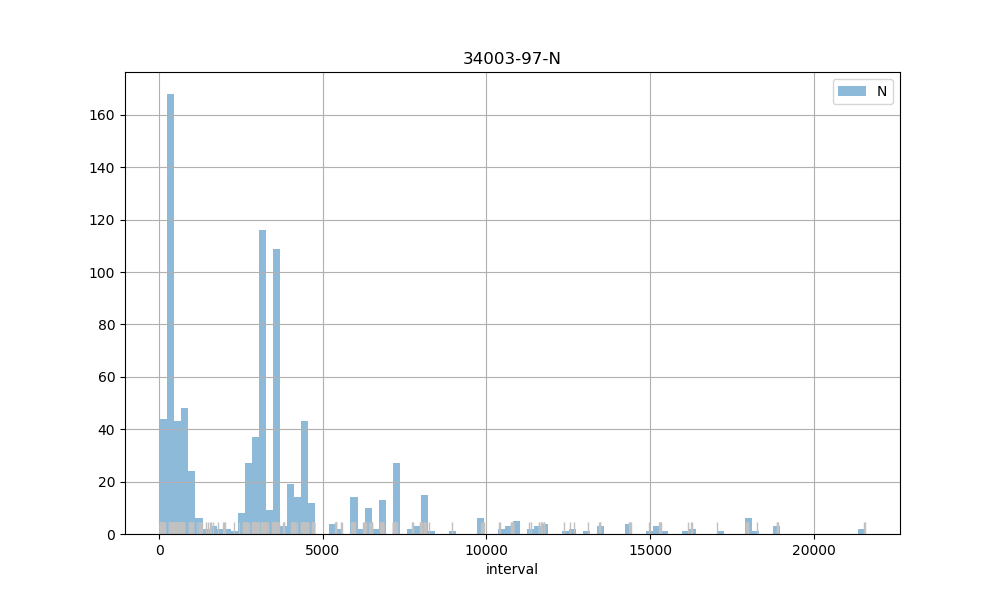

N count      893.00
mean      3381.52
std       3518.84
min         36.00
25%        545.00
50%       3186.00
75%       4119.00
max      21557.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


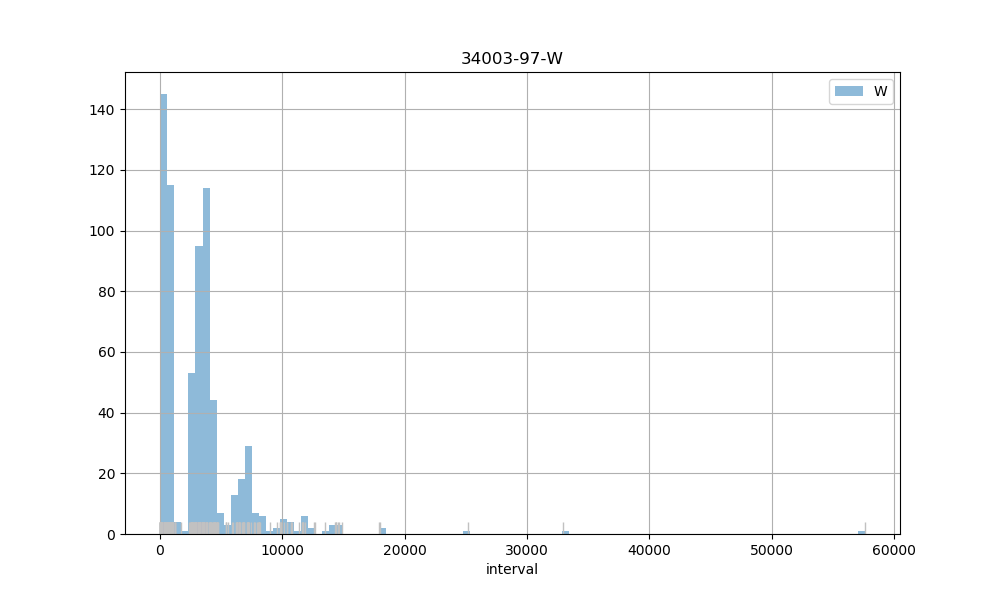

W count      687.00
mean      3257.62
std       3819.79
min         34.00
25%        679.00
50%       3150.00
75%       3613.50
max      57597.00
Name: interval, dtype: object
34003-98


<IPython.core.display.Javascript object>

D count     1178.00
mean      2312.12
std       3268.56
min          2.00
25%        894.00
50%        942.50
75%       2524.25
max      29708.00
Name: interval, dtype: object
N count     1008.00
mean      2846.08
std       3414.53
min          1.00
25%        899.00
50%       1745.00
75%       3585.75
max      30429.00
Name: interval, dtype: object
W count      582.00
mean      3855.21
std       4939.14
min          6.00
25%        910.00
50%       1839.00
75%       4501.75
max      33231.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>

D count     1178.00
mean      2312.12
std       3268.56
min          2.00
25%        894.00
50%        942.50
75%       2524.25
max      29708.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


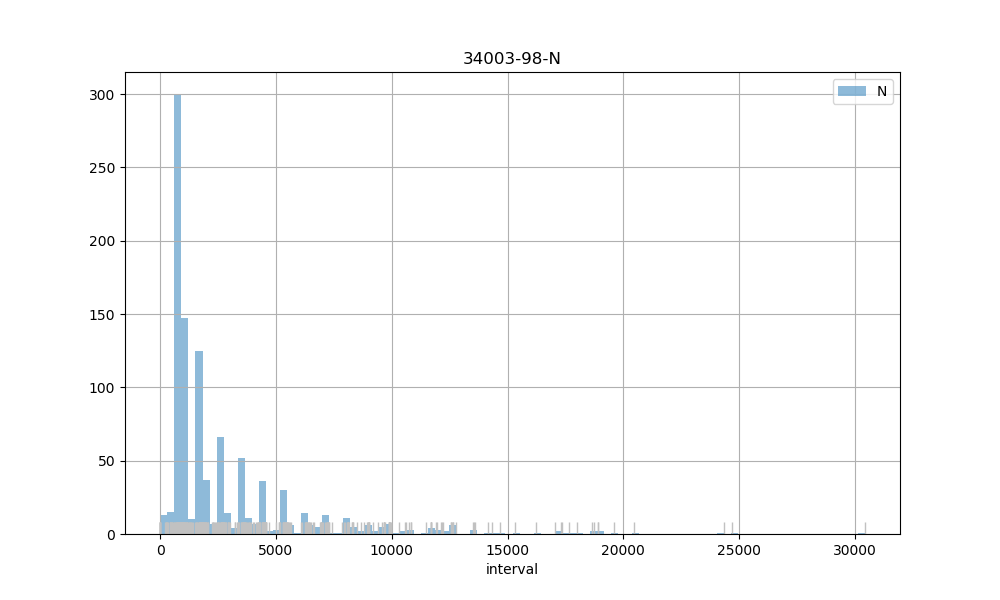

N count     1008.00
mean      2846.08
std       3414.53
min          1.00
25%        899.00
50%       1745.00
75%       3585.75
max      30429.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


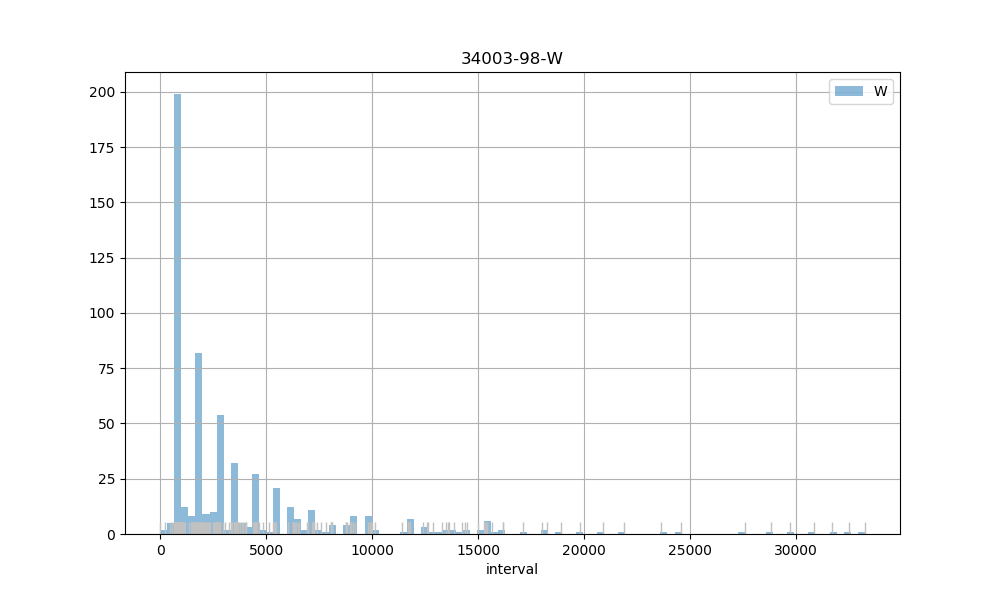

W count      582.00
mean      3855.21
std       4939.14
min          6.00
25%        910.00
50%       1839.00
75%       4501.75
max      33231.00
Name: interval, dtype: object
34003-99


<IPython.core.display.Javascript object>


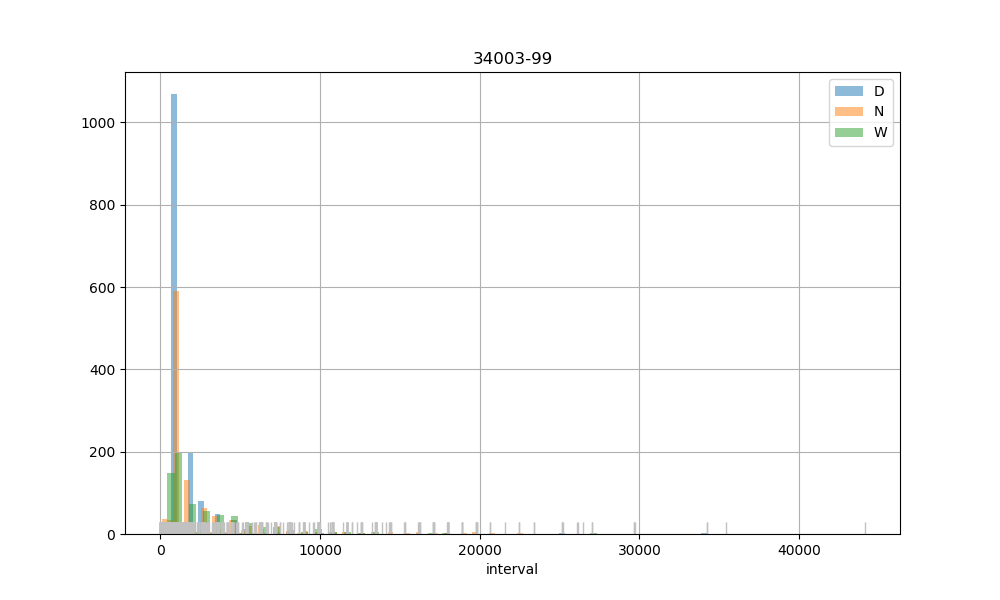

D count     1530.00
mean      1701.35
std       2542.11
min          2.00
25%        894.00
50%        910.00
75%       1787.00
max      34230.00
Name: interval, dtype: object
N count     1143.00
mean      2598.62
std       3715.14
min         90.00
25%        896.00
50%        922.00
75%       2699.00
max      35444.00
Name: interval, dtype: object
W count      737.00
mean      3069.38
std       3994.95
min         15.00
25%        899.00
50%       1759.00
75%       3622.00
max      44111.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


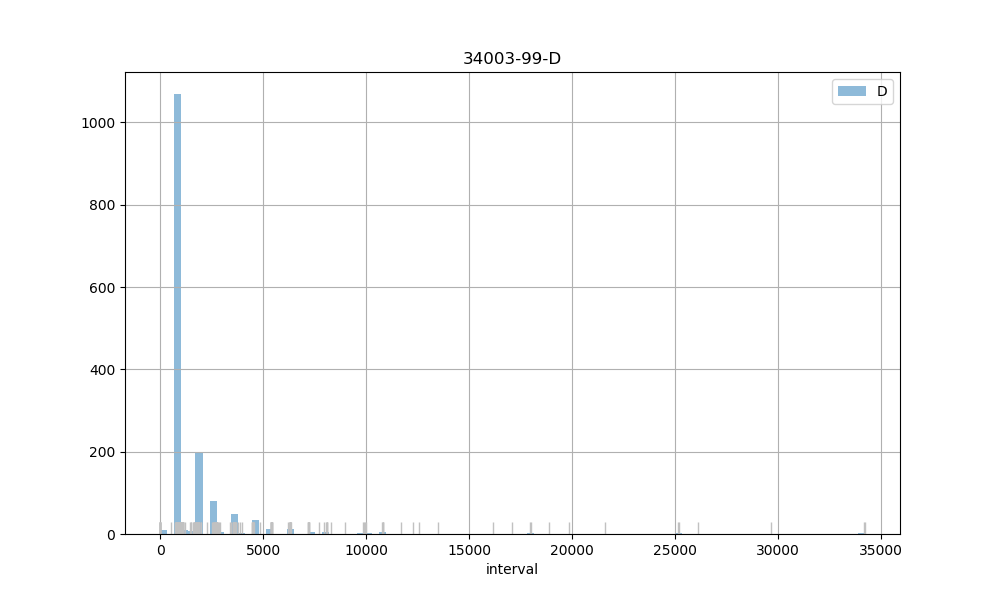

D count     1530.00
mean      1701.35
std       2542.11
min          2.00
25%        894.00
50%        910.00
75%       1787.00
max      34230.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


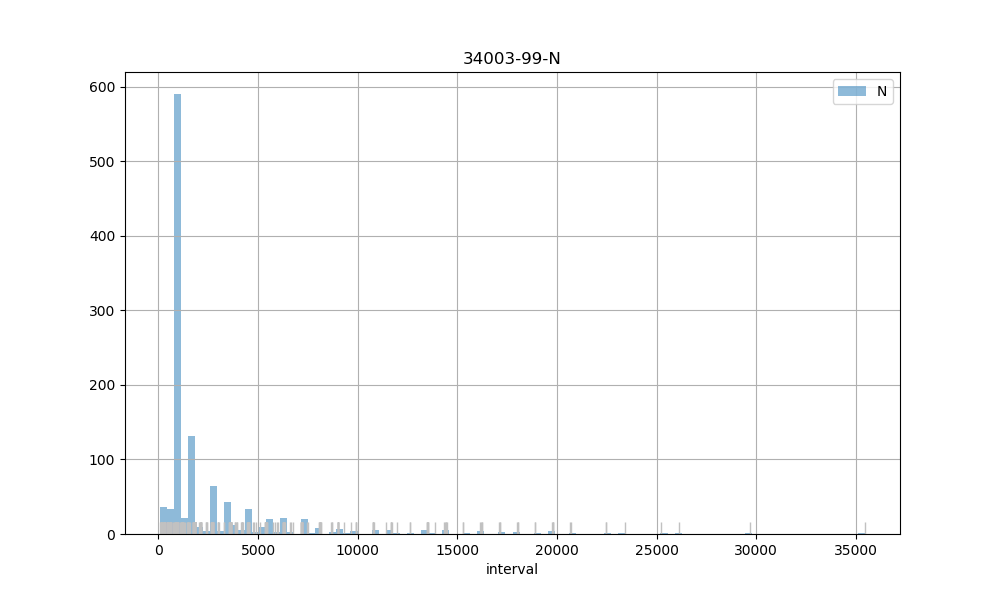

N count     1143.00
mean      2598.62
std       3715.14
min         90.00
25%        896.00
50%        922.00
75%       2699.00
max      35444.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


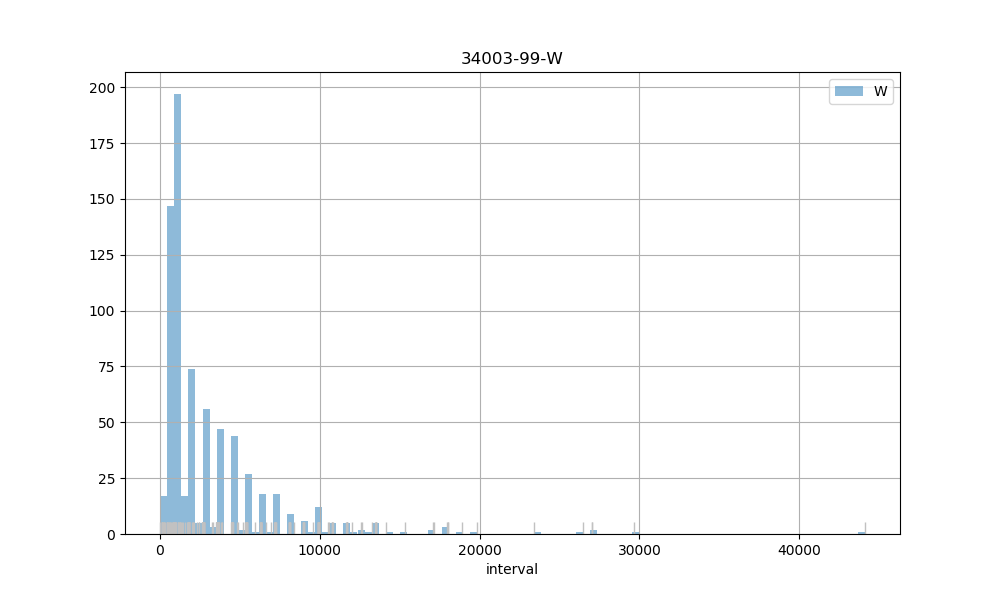

W count      737.00
mean      3069.38
std       3994.95
min         15.00
25%        899.00
50%       1759.00
75%       3622.00
max      44111.00
Name: interval, dtype: object
34003-100


<IPython.core.display.Javascript object>


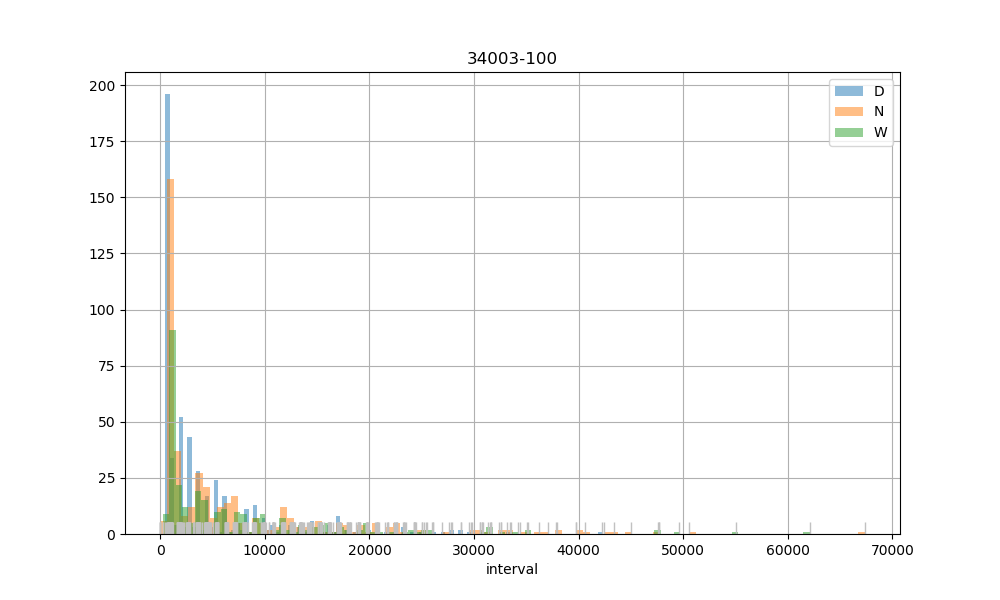

D count      544.00
mean      4736.33
std       6176.11
min        506.00
25%        903.00
50%       1825.00
75%       5441.50
max      42275.00
Name: interval, dtype: object
N count      435.00
mean      7003.39
std       9685.60
min          2.00
25%        906.00
50%       2740.00
75%       8901.00
max      67364.00
Name: interval, dtype: object
W count      298.00
mean      7326.83
std       9575.65
min        230.00
25%        915.25
50%       3603.00
75%       9626.00
max      62085.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


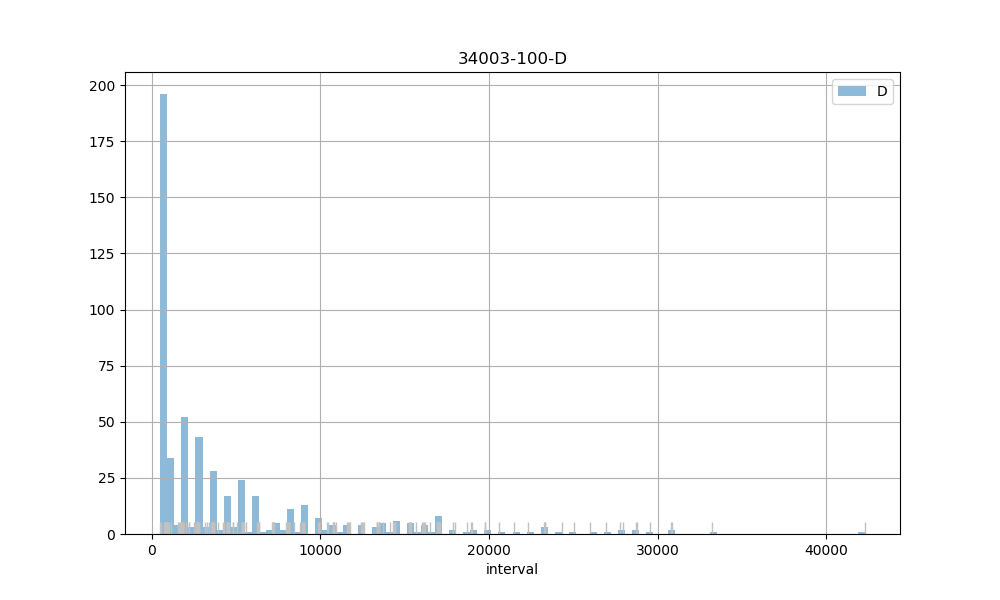

D count      544.00
mean      4736.33
std       6176.11
min        506.00
25%        903.00
50%       1825.00
75%       5441.50
max      42275.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


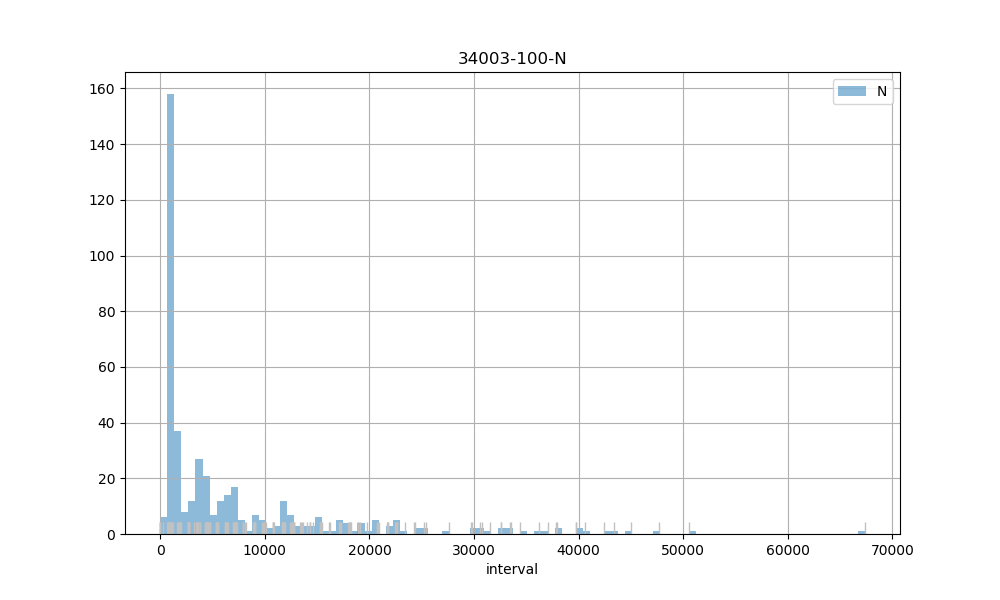

N count      435.00
mean      7003.39
std       9685.60
min          2.00
25%        906.00
50%       2740.00
75%       8901.00
max      67364.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


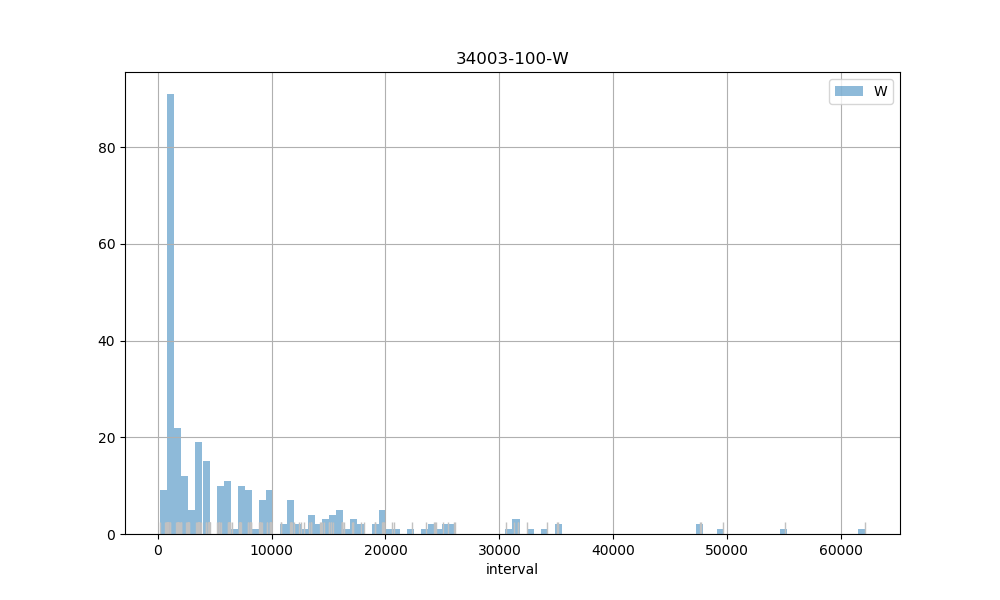

W count      298.00
mean      7326.83
std       9575.65
min        230.00
25%        915.25
50%       3603.00
75%       9626.00
max      62085.00
Name: interval, dtype: object
34003-101


<IPython.core.display.Javascript object>


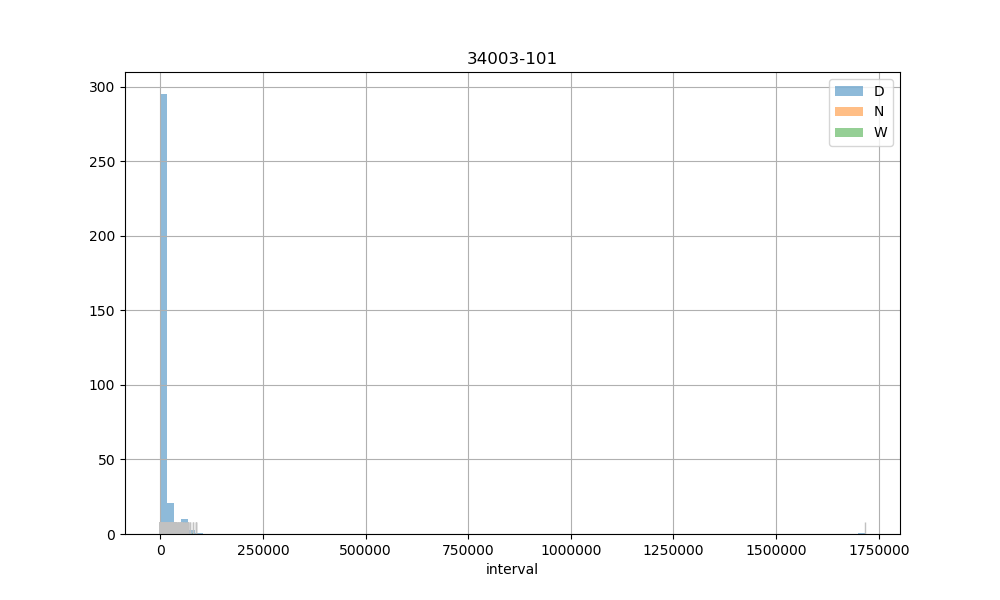

D count        337.00
mean       13439.15
std        94196.22
min            0.00
25%          923.00
50%         2680.00
75%         8099.00
max      1716038.00
Name: interval, dtype: object
N count      185.00
mean      8524.85
std      12371.66
min          0.00
25%        907.00
50%       1928.00
75%      10994.00
max      59612.00
Name: interval, dtype: object
W count      160.00
mean     10701.42
std      15839.29
min          0.00
25%        920.00
50%       3589.00
75%      14481.50
max      86801.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


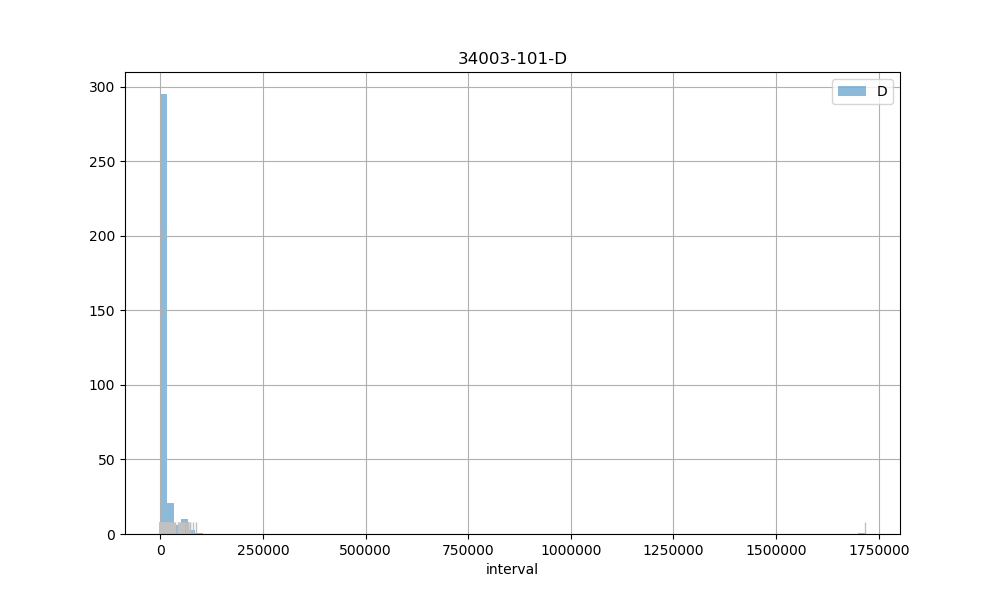

D count        337.00
mean       13439.15
std        94196.22
min            0.00
25%          923.00
50%         2680.00
75%         8099.00
max      1716038.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


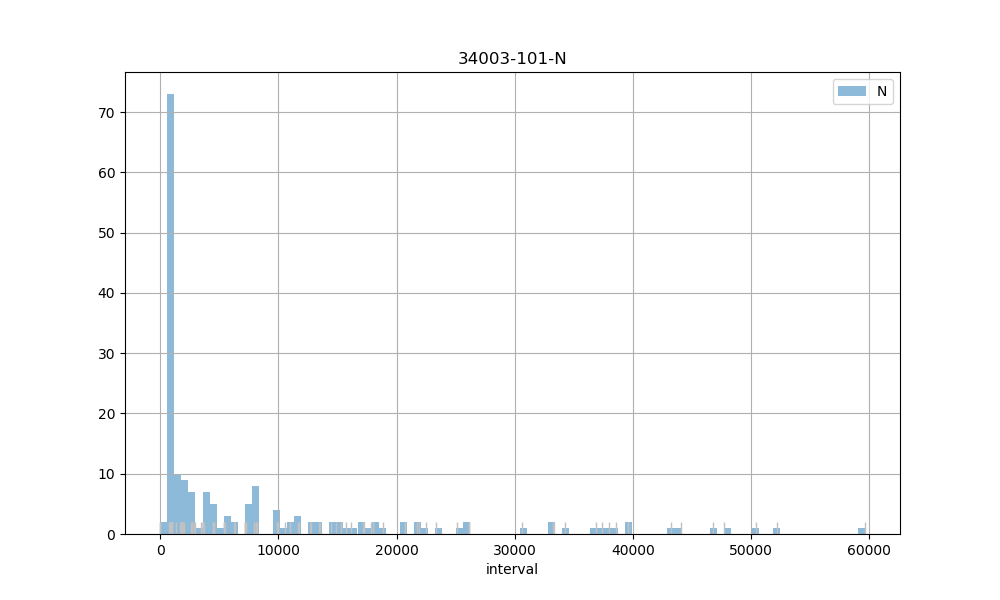

N count      185.00
mean      8524.85
std      12371.66
min          0.00
25%        907.00
50%       1928.00
75%      10994.00
max      59612.00
Name: interval, dtype: object


<IPython.core.display.Javascript object>


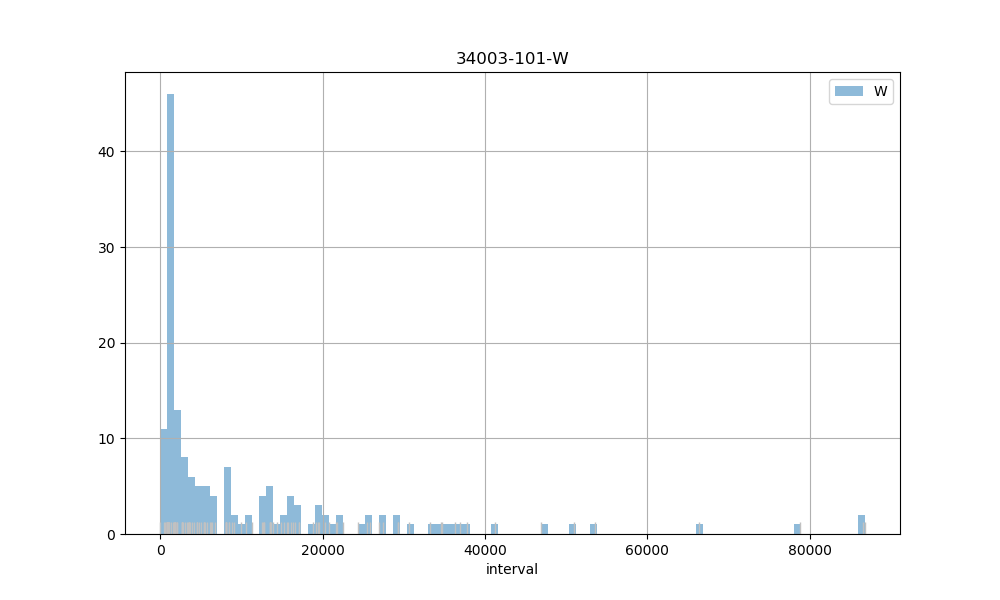

W count      160.00
mean     10701.42
std      15839.29
min          0.00
25%        920.00
50%       3589.00
75%      14481.50
max      86801.00
Name: interval, dtype: object


In [74]:
# loop through the agency list, make the output

for agency in get_agency_list('f'):
    print(agency)
    agency_bool = df_all['uniquename'] == agency
    agency_df = df_all[agency_bool]
    
    outlier_threshold = 100000000
    
    saveoutput = 1
    make_output(agency, agency_df, outlier_threshold, saveoutput)
    